In [6]:
import logging

logger = logging.getLogger("vessel_analysis")
if not logger.hasHandlers():
    handler = logging.StreamHandler()
    formatter = logging.Formatter("[%(levelname)s] %(message)s")
    handler.setFormatter(formatter)
    logger.addHandler(handler)
    logger.setLevel(logging.DEBUG)
import hp5y

ModuleNotFoundError: No module named 'hp5y'

In [2]:
import numpy as np
import tifffile
import matplotlib.pyplot as plt
import networkx as nx
from skimage.filters import threshold_otsu
from scipy.ndimage import binary_fill_holes, label, binary_dilation,  map_coordinates, distance_transform_edt
from skimage.util import img_as_bool
from scipy.spatial import KDTree, cKDTree
from skimage.morphology import remove_small_objects, binary_dilation, skeletonize_3d
from scipy.interpolate import splprep, splev
import logging
from collections import defaultdict, deque
import pandas as pd
import heapq
from concurrent.futures import ThreadPoolExecutor, as_completed
from skimage.graph import route_through_array
import math
import plotly.graph_objects as go
from skimage.measure import profile_line
from functools import lru_cache
import os
import scipy.ndimage as ndi
from typing import List, Tuple
try:
    from skan import csr
except ImportError:
    pass

# PARAMETERS
filepath = "C:\\Users\\hd01\\Dropbox\\Modelling - nerve vasculature\\2425_Fem_DAPI_FITCdextran_NG2dsRed_24112023_a_2425_Fem_DAPI_FI...laments_manuallyaddedfilaments_06112024.ims Resolution Level 1 - C=10_cropped.tif"
apply_bridging = True
calc_betweenness = False
calc_communities = False
export_outputs = True
filter_short_edges = True
apply_smoothing = False # Enable if needed


C:\Users\hd01\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [3]:
import numpy as np
from scipy.integrate import quad

def get_diameter_at_position(position, length, d1, d2):
    """
    Get diameter at a specific position along the vessel.
    
    Parameters:
    -----------
    position : float
        Distance from start of vessel (0 to length) in micrometers
    length : float
        Total vessel length in micrometers
    d1 : float
        Passive diameter (baseline) in micrometers
    d2 : float
        Constricted diameter in micrometers
        
    Returns:
    --------
    float : Diameter at the given position
    """
    # If vessel length < 40um, use only d1
    if length < 40:
        return d1
    
    # For vessels >= 40um, apply constriction pattern
    # Constrictions are spaced 100um apart, each constriction is 40um total (20um down + 20um up)
    
    # Find which constriction cycle we're in
    cycle_length = 100.0  # Distance between constriction starts
    constriction_length = 40.0  # Total length of each constriction (20um down + 20um up)
    
    # Check if we're in a constriction zone
    cycle_position = position % cycle_length
    
    # First constriction starts immediately
    if cycle_position < constriction_length:
        if cycle_position < 20.0:
            # Linear transition from d1 to d2 over first 20um
            t = cycle_position / 20.0
            return d1 + t * (d2 - d1)  # Linear interpolation
        else:
            # Linear transition from d2 back to d1 over next 20um
            t = (cycle_position - 20.0) / 20.0
            return d2 + t * (d1 - d2)  # Linear interpolation
    else:
        # In the 60um segment between constrictions, use d1
        return d1

def calculate_viscosity(diameter):
    """Calculate viscosity using the relationship: μ = 1 / diameter^1.647"""
    return 1.0 / (diameter ** 1.647)

def resistance_integrand(position, length, d1, d2):
    """
    Calculate resistance per unit length at a given position.
    
    Resistance per unit length = (128 * viscosity) / (π * diameter^4)
    """
    diameter = get_diameter_at_position(position, length, d1, d2)
    viscosity = calculate_viscosity(diameter)
    return (128.0 * viscosity) / (np.pi * diameter**4)

def calculate_integrated_resistance(length, d1, d2, num_points=1000):
    """
    Calculate total resistance by integrating over vessel length.
    
    Parameters:
    -----------
    length : float
        Vessel length in micrometers
    d1 : float
        Passive diameter in micrometers
    d2 : float
        Constricted diameter in micrometers
    num_points : int
        Number of points for numerical integration
        
    Returns:
    --------
    float : Total resistance of the vessel
    """
    if length <= 0:
        return float('inf')
    
    # Use numerical integration (trapezoidal rule for efficiency)
    positions = np.linspace(0, length, num_points)
    resistances = [resistance_integrand(pos, length, d1, d2) for pos in positions]
    
    # Integrate using trapezoidal rule
    total_resistance = np.trapz(resistances, dx=length/(num_points-1))
    
    return total_resistance

def set_poiseuille_weights_with_constrictions(G, diameter_by_branch_order):
    """
    Set edge weights using integrated Poiseuille's law with diameter constrictions.
    Weight = 1 / (integrated resistance over vessel length)
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph with branch_order and length attributes
    diameter_by_branch_order : dict
        Dictionary mapping branch order strings to diameter dictionaries
        e.g., {'BO1': {'d1': 6.2, 'd2': 4.0}, 'BO2': {'d1': 4.5, 'd2': 3.0}}
        where d1 is passive diameter and d2 is constricted diameter
        
    Returns:
    --------
    dict : Summary of weight assignments
    """
    results = {
        'weights_set': 0,
        'missing_branch_order': [],
        'missing_length': [],
        'unknown_branch_order': [],
        'invalid_length': [],
        'invalid_diameter': [],
        'diameter_calculations': {}  # Track diameter info for each branch order
    }
    
    print(f"=== Enhanced Poiseuille Weight Calculation (With Constrictions) ===")
    print(f"Formula: Weight = 1 / (∫ resistance dx)")
    print(f"Resistance per unit length = (128 * μ) / (π * d^4)")
    print(f"Viscosity calculation: μ = 1 / diameter^1.647")
    print(f"Constriction pattern: d1 → d2 → d1 over 40μm, spaced 100μm apart")
    print(f"Units: diameter and length in micrometers (μm)")
    print()
    
    # Validate and display diameter information
    for branch_order, diameters in diameter_by_branch_order.items():
        if not isinstance(diameters, dict) or 'd1' not in diameters or 'd2' not in diameters:
            print(f"Error: {branch_order} must have dict with 'd1' and 'd2' keys")
            continue
        
        d1, d2 = diameters['d1'], diameters['d2']
        if d1 <= 0 or d2 <= 0:
            print(f"Warning: Invalid diameters for {branch_order}: d1={d1}, d2={d2}")
            continue
        
        results['diameter_calculations'][branch_order] = {
            'd1_passive': d1,
            'd2_constricted': d2,
            'viscosity_d1': calculate_viscosity(d1),
            'viscosity_d2': calculate_viscosity(d2)
        }
        print(f"{branch_order}: d1={d1}μm (μ={calculate_viscosity(d1):.6f}), "
              f"d2={d2}μm (μ={calculate_viscosity(d2):.6f})")
    
    print()
    
    for u, v, key, data in G.edges(keys=True, data=True):
        # Check for branch order
        branch_order = data.get('branch_order', None)
        if branch_order is None:
            results['missing_branch_order'].append((u, v, key))
            continue
        
        # Check for length
        length = data.get('length', None)
        if length is None:
            results['missing_length'].append((u, v, key))
            continue
        
        if length <= 0:
            results['invalid_length'].append((u, v, key, length))
            continue
        
        # Get diameters for this branch order
        diameters = diameter_by_branch_order.get(branch_order, None)
        if diameters is None:
            results['unknown_branch_order'].append((u, v, key, branch_order))
            continue
        
        if not isinstance(diameters, dict) or 'd1' not in diameters or 'd2' not in diameters:
            results['invalid_diameter'].append((u, v, key, branch_order, "missing d1/d2"))
            continue
        
        d1, d2 = diameters['d1'], diameters['d2']
        if d1 <= 0 or d2 <= 0:
            results['invalid_diameter'].append((u, v, key, branch_order, f"d1={d1}, d2={d2}"))
            continue
        
        # Calculate integrated resistance
        try:
            total_resistance = calculate_integrated_resistance(length, d1, d2)
            
            # Weight is conductance (inverse of resistance)
            weight = 1.0 / total_resistance
            
            # Store old weight for comparison
            old_weight = data.get('weight', None)
            
            # Set new weight
            G[u][v][key]['weight'] = weight
            
            results['weights_set'] += 1
            
            # Debug output for first few edges
            if results['weights_set'] <= 5:
                print(f"Edge ({u}, {v}, {key}): {branch_order}, length={length:.3f}μm, "
                      f"d1={d1}μm, d2={d2}μm, resistance={total_resistance:.6f}, weight={weight:.6f}")
                
        except Exception as e:
            print(f"Error calculating resistance for edge ({u}, {v}, {key}): {e}")
            results['invalid_diameter'].append((u, v, key, branch_order, str(e)))
            continue
    
    # Print summary
    print(f"\n=== Summary ===")
    print(f"Weights successfully set: {results['weights_set']}")
    if results['missing_branch_order']:
        print(f"Edges missing branch_order: {len(results['missing_branch_order'])}")
    if results['missing_length']:
        print(f"Edges missing length: {len(results['missing_length'])}")
    if results['unknown_branch_order']:
        print(f"Edges with unknown branch_order: {len(results['unknown_branch_order'])}")
    if results['invalid_length']:
        print(f"Edges with invalid length: {len(results['invalid_length'])}")
    if results['invalid_diameter']:
        print(f"Edges with invalid diameter: {len(results['invalid_diameter'])}")
    
    return results

def print_weight_summary_enhanced(results):
    """Print summary of enhanced weight assignment results."""
    print("=== Enhanced Poiseuille Weight Assignment Summary ===")
    print(f"Weights successfully set: {results['weights_set']}")
    print(f"Missing branch_order: {len(results['missing_branch_order'])}")
    print(f"Missing length: {len(results['missing_length'])}")
    print(f"Unknown branch_order: {len(results['unknown_branch_order'])}")
    print(f"Invalid length: {len(results['invalid_length'])}")
    print(f"Invalid diameter: {len(results['invalid_diameter'])}")
    
    if results['diameter_calculations']:
        print(f"\n--- Diameter Configurations ---")
        for bo, calc in results['diameter_calculations'].items():
            print(f"  {bo}: d1={calc['d1_passive']:.1f}μm, d2={calc['d2_constricted']:.1f}μm")
    
    if results['missing_branch_order']:
        print(f"\n--- Edges Missing Branch Order (first 5) ---")
        for edge in results['missing_branch_order'][:5]:
            print(f"  {edge}")
    
    if results['unknown_branch_order']:
        print(f"\n--- Unknown Branch Orders ---")
        unique_bos = set(bo for _, _, _, bo in results['unknown_branch_order'])
        for bo in unique_bos:
            count = sum(1 for _, _, _, b in results['unknown_branch_order'] if b == bo)
            print(f"  {bo}: {count} edges")

# Updated diameter configuration with d1 (passive) and d2 (constricted) diameters
diameter_by_branch_order_enhanced = {
    'BO1': {'d1': 6.2, 'd2': 6.2},  # d1 is passive, d2 is constricted
    'BO2': {'d1': 4.0, 'd2': 3.2},
    'BO3': {'d1': 5.0, 'd2': 4.0},
    'BO4': {'d1': 5.0, 'd2': 4.0},
    'BO5': {'d1': 4.0, 'd2': 3.2},
    'BO6': {'d1': 4.0, 'd2': 3.2},
    'BO7': {'d1': 4.0, 'd2': 3.2},
    'BO8': {'d1': 4.0, 'd2': 3.2},
    'BO9': {'d1': 4.0, 'd2': 3.2},
    'B10': {'d1': 4.0, 'd2': 3.2},
    'B11': {'d1': 4.0, 'd2': 3.2},
    'B12': {'d1': 4.0, 'd2': 3.2},
    'B13': {'d1': 4.0, 'd2': 3.2},
    'B14': {'d1': 4.0, 'd2': 3.2},
    'B15': {'d1': 4.0, 'd2': 3.2},
    'B16': {'d1': 4.0, 'd2': 3.2},
    'B17': {'d1': 4.0, 'd2': 3.2},
    'B18': {'d1': 4.0, 'd2': 3.2},
    'B19': {'d1': 4.0, 'd2': 3.2},
    'B20': {'d1': 4.0, 'd2': 3.2},
    'B21': {'d1': 4.0, 'd2': 3.2},
    'B22': {'d1': 4.0, 'd2': 3.2},
    'B23': {'d1': 4.0, 'd2': 3.2},
    'B24': {'d1': 4.0, 'd2': 3.2},
    'B25': {'d1': 4.0, 'd2': 3.2},
    'B26': {'d1': 4.0, 'd2': 3.2},
}

def complete_branch_processing_enhanced(G, starting_nodes, diameter_by_branch_order):
    """
    Complete pipeline: assign branch orders and set enhanced Poiseuille weights.
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph to process
    starting_nodes : list
        List of starting node IDs
    diameter_by_branch_order : dict
        Dictionary mapping branch orders to diameter dictionaries
        
    Returns:
    --------
    tuple : (branch_results, weight_results)
    """
    print("Step 1: Assigning branch orders...")
    # Note: You'll need to call your existing assign_branch_orders function here
    # branch_results = assign_branch_orders(G, starting_nodes)
    # print_branch_order_summary(branch_results)
    
    print(f"\nStep 2: Setting enhanced Poiseuille weights with constrictions...")
    weight_results = set_poiseuille_weights_with_constrictions(G, diameter_by_branch_order)
    print_weight_summary_enhanced(weight_results)
    
    return weight_results

# Example usage:
# results = set_poiseuille_weights_with_constrictions(G, diameter_by_branch_order_enhanced)

def reconnect_secondary_loop_edges(
    G, skeleton,
    voxel_size=(1,1,1),
    min_length_voxels=30,
    max_length_voxels=6000,
    max_distance=6000.0,
    margin=10,
    k_paths=5,
    min_overlap=0.9, #0.7
    min_geom_dev=8.0,
    repulsion_sigma=2.0,
    max_workers=None,
    debug=True,
    max_cache_size=1000
):
    """
    Improved version using MultiGraph to support parallel edges
    """
    import numpy as np
    import networkx as nx
    import logging
    import threading
    from concurrent.futures import ThreadPoolExecutor, as_completed
    from scipy.ndimage import distance_transform_edt, gaussian_filter
    from scipy.spatial.distance import directed_hausdorff
    from skimage.graph import route_through_array
    
    logger = logging.getLogger(__name__)
    
    # Input validation
    if not isinstance(G, (nx.Graph, nx.MultiGraph)):
        raise ValueError("G must be a NetworkX Graph or MultiGraph")
    if skeleton is None or skeleton.size == 0:
        raise ValueError("skeleton cannot be None or empty")
    
    # Convert to MultiGraph if it isn't already
    if not isinstance(G, nx.MultiGraph):
        if debug:
            logger.info("Converting Graph to MultiGraph to support parallel edges")
        G = nx.MultiGraph(G)
    
    pos = nx.get_node_attributes(G, "pos")
    if not pos:
        logger.warning("No node positions found")
        return G
    
    deg = dict(G.degree())
    skeleton_copy = skeleton.astype(bool)
    
    # Pre-compute distance transform (expensive operation)
    try:
        base_cost = 1 + distance_transform_edt(~skeleton_copy) ** 2
    except Exception as e:
        logger.error(f"Failed to compute distance transform: {e}")
        return G

    # Thread-safe cache with size limit
    cache_lock = threading.Lock()
    sub_cache = {}
    cache_access_order = []

    def manage_cache(key, value=None):
        """Thread-safe cache management with LRU eviction"""
        with cache_lock:
            if value is not None:  # Adding to cache
                if key in sub_cache:
                    # Move to end
                    cache_access_order.remove(key)
                    cache_access_order.append(key)
                else:
                    # Add new entry
                    if len(sub_cache) >= max_cache_size:
                        # Evict oldest
                        oldest = cache_access_order.pop(0)
                        del sub_cache[oldest]
                    sub_cache[key] = value
                    cache_access_order.append(key)
                return value
            else:  # Getting from cache
                if key in sub_cache:
                    # Move to end (most recently used)
                    cache_access_order.remove(key)
                    cache_access_order.append(key)
                    return sub_cache[key]
                return None

    def make_repulsion_safe(orig_voxels, sub_shape):
        """Safely create repulsion field with bounds checking"""
        if not orig_voxels or not sub_shape or any(s <= 0 for s in sub_shape):
            return np.zeros(sub_shape, dtype=float)
        
        mask = np.zeros(sub_shape, dtype=float)
        valid_count = 0
        
        for coords in orig_voxels:
            if len(coords) >= 3:
                x, y, z = int(coords[0]), int(coords[1]), int(coords[2])
                if (0 <= x < sub_shape[0] and 
                    0 <= y < sub_shape[1] and 
                    0 <= z < sub_shape[2]):
                    mask[x, y, z] = 1.0
                    valid_count += 1
        
        if valid_count == 0:
            return np.zeros(sub_shape, dtype=float)
        
        try:
            # Create stronger repulsion field
            repulsion_field = gaussian_filter(mask, sigma=repulsion_sigma)
            
            # Scale repulsion strength based on distance from skeleton
            # Higher repulsion where skeleton is present
            max_repulsion = np.max(repulsion_field)
            if max_repulsion > 0:
                # Normalize and amplify repulsion
                repulsion_field = (repulsion_field / max_repulsion) * 50.0  # Strong repulsion
                
                # Add extra penalty directly on original path voxels
                high_penalty_mask = mask > 0
                repulsion_field[high_penalty_mask] += 100.0  # Very high cost on exact path
            
            return repulsion_field
        except Exception as e:
            logger.warning(f"Gaussian filter failed: {e}")
            # Fallback: direct high cost on original voxels
            fallback_mask = mask.copy()
            fallback_mask[mask > 0] = 100.0  # High penalty on original path
            return fallback_mask

    # Find candidate pairs with better filtering
    candidates = []
    for u, v, key, data in G.edges(data=True, keys=True):
        if (deg[u] == 2 and deg[v] == 2 and 
            data.get("voxels") and
            u in pos and v in pos and
            not data.get("secondary", False)):  # Only consider primary edges
            
            distance = np.linalg.norm(np.subtract(pos[u], pos[v]))
            if distance <= max_distance:
                candidates.append((u, v, distance))
    
    # Remove duplicates (since MultiGraph might have multiple edges between same nodes)
    seen_pairs = set()
    unique_candidates = []
    for u, v, dist in candidates:
        pair = tuple(sorted([u, v]))
        if pair not in seen_pairs:
            seen_pairs.add(pair)
            unique_candidates.append((u, v, dist))
    
    # Sort by distance for better cache efficiency
    unique_candidates.sort(key=lambda x: x[2])
    pairs = [(u, v) for u, v, _ in unique_candidates]
    
    if debug:
        logger.info(f"🧩 {len(pairs)} candidate deg‑2 pairs")

    def attempt_reconnect(pair_data):
        """Attempt to find alternative paths between nodes"""
        u, v, node_positions = pair_data
        try:
            # Use explicitly passed node_positions to avoid closure issues
            if u not in node_positions or v not in node_positions:
                return None
            
            pu, pv = np.array(node_positions[u]), np.array(node_positions[v])
            u_vox = np.round(pu / voxel_size).astype(int)
            v_vox = np.round(pv / voxel_size).astype(int)

            # Get original voxels with validation (from primary edge only)
            primary_edge_data = None
            for key, edge_data in G[u][v].items():
                if not edge_data.get("secondary", False):
                    primary_edge_data = edge_data
                    break
            
            if not primary_edge_data:
                return None
                
            orig_voxels_raw = primary_edge_data.get("voxels", [])
            if not orig_voxels_raw:
                return None

            # Convert and validate original voxels
            orig_voxels = []
            for vox in orig_voxels_raw:
                if isinstance(vox, (list, tuple, np.ndarray)) and len(vox) >= 3:
                    vox_coords = np.round(np.array(vox) / voxel_size).astype(int)
                    if np.all(vox_coords >= 0) and np.all(vox_coords < skeleton_copy.shape):
                        orig_voxels.append(vox_coords)

            if not orig_voxels:
                return None

            best_paths = []

            # Try different expansion levels
            for expansion in [0, 10, 25, 50]:
                ext = margin + expansion
                minc = np.maximum(np.minimum(u_vox, v_vox) - ext, 0)
                maxc = np.minimum(np.maximum(u_vox, v_vox) + ext + 1, skeleton_copy.shape)
                
                # Validate subvolume
                if np.any(minc >= maxc):
                    continue
                
                cache_key = (*minc, *maxc)
                cached_result = manage_cache(cache_key)
                
                if cached_result is None:
                    # Create subvolume cost map
                    try:
                        sub_cost = base_cost[minc[0]:maxc[0], 
                                           minc[1]:maxc[1], 
                                           minc[2]:maxc[2]].copy()
                        
                        if sub_cost.size == 0:
                            continue
                        
                        # Add repulsion from original path
                        orig_rel = [vox - minc for vox in orig_voxels]
                        repulsion = make_repulsion_safe(orig_rel, sub_cost.shape)
                        sub_cost = sub_cost + repulsion
                        
                        cached_result = (sub_cost, minc)
                        manage_cache(cache_key, cached_result)
                        
                    except Exception as e:
                        if debug:
                            logger.warning(f"Subvolume creation failed for {u}-{v}: {e}")
                        continue
                
                sub_cost, minc = cached_result
                
                # Calculate local coordinates
                ru = u_vox - minc
                rv = v_vox - minc
                
                # Validate bounds
                if (np.any(ru < 0) or np.any(rv < 0) or 
                    np.any(ru >= sub_cost.shape) or np.any(rv >= sub_cost.shape)):
                    continue

                # Use faster pathfinding algorithm
                try:
                    path_coords, cost = route_through_array(
                        sub_cost, tuple(ru), tuple(rv), fully_connected=True
                    )
                    
                    if path_coords is None or len(path_coords) < min_length_voxels:
                        continue
                    
                    path_coords = np.array(path_coords)
                    path_length = len(path_coords)
                    
                    if path_length > max_length_voxels:
                        continue
                    
                    # Convert to absolute coordinates
                    abs_coords = path_coords + minc
                    
                    # Validate coordinates are within skeleton bounds
                    if (np.any(abs_coords < 0) or 
                        np.any(abs_coords >= skeleton.shape)):
                        continue
                    
                    # Calculate metrics safely
                    try:
                        x, y, z = abs_coords.T
                        skeleton_hits = skeleton[x, y, z]
                        overlap = np.sum(skeleton_hits) / path_length
                        
                        if overlap < min_overlap:
                            continue
                        
                        # Calculate geometric deviation (how different from original)
                        orig_coords = np.array(orig_voxels)
                        hausdorff_dist = max(
                            directed_hausdorff(orig_coords, abs_coords)[0],
                            directed_hausdorff(abs_coords, orig_coords)[0]
                        )
                        
                        if hausdorff_dist < min_geom_dev:
                            if debug:
                                logger.debug(f"Path too similar to original (dev={hausdorff_dist:.1f} < {min_geom_dev})")
                            continue
                        
                        # Additional novelty check: path overlap percentage
                        orig_set = set(tuple(coord) for coord in orig_coords)
                        new_set = set(tuple(coord) for coord in abs_coords)
                        overlap_voxels = len(orig_set.intersection(new_set))
                        path_similarity = overlap_voxels / min(len(orig_set), len(new_set))
                        
                        # Reject paths that are too similar (>70% overlap)
                        if path_similarity > 0.7:
                            if debug:
                                logger.debug(f"Path too similar (voxel overlap={path_similarity:.2f})")
                            continue
                        
                        # Convert back to physical coordinates
                        vox3d = (abs_coords * voxel_size).tolist()
                        
                        # Calculate path novelty metrics
                        unique_voxels = len(new_set - orig_set)
                        path_novelty = unique_voxels / len(new_set)  # Fraction of unique voxels
                        
                        best_paths.append({
                            'voxels': vox3d,
                            'overlap': overlap,
                            'deviation': hausdorff_dist,
                            'length': path_length,
                            'cost': cost,
                            'novelty': path_novelty,  # How different from original
                            'voxel_similarity': path_similarity  # For debugging
                        })
                        
                        # Stop if we have enough good paths
                        if len(best_paths) >= k_paths:
                            break
                            
                    except Exception as e:
                        if debug:
                            logger.warning(f"Metric calculation failed: {e}")
                        continue
                        
                except Exception as e:
                    if debug:
                        logger.warning(f"Pathfinding failed for {u}-{v}: {e}")
                    continue
                
                # Break if we found good paths
                if best_paths:
                    break

            if not best_paths:
                return None

            # Sort by novelty first, then overlap and deviation
            best_paths.sort(key=lambda p: (-p['novelty'], -p['overlap'], -p['deviation']))
            
            return u, v, best_paths[:k_paths]

        except Exception as e:
            if debug:
                logger.error(f"Attempt failed for {u}-{v}: {e}")
            return None

    # Process pairs with thread-safe edge addition
    added = 0
    edge_lock = threading.Lock()
    
    max_workers = max_workers or min(4, len(pairs))
    
    try:
        with ThreadPoolExecutor(max_workers=max_workers) as executor:
            # Pass node positions explicitly to avoid closure issues
            pair_data_list = [(u, v, pos) for u, v in pairs]
            future_to_pair = {executor.submit(attempt_reconnect, pair_data): (pair_data[0], pair_data[1]) 
                             for pair_data in pair_data_list}
            
            for future in as_completed(future_to_pair):
                u, v = future_to_pair[future]
                try:
                    result = future.result()
                    if not result:
                        continue
                    
                    u, v, candidates = result
                    
                    if debug:
                        logger.info(f"📌 {u}-{v} → {len(candidates)} candidates")
                    
                    # Thread-safe edge addition
                    with edge_lock:
                        # Check if there's already a secondary edge between these nodes
                        has_secondary = False
                        if G.has_edge(u, v):
                            for key, edge_data in G[u][v].items():
                                if edge_data.get("secondary", False):
                                    has_secondary = True
                                    break
                        
                        if has_secondary:
                            if debug:
                                logger.info(f"🚫 {u}-{v} already has secondary edge")
                            continue
                        
                        # Add new parallel edge (MultiGraph automatically assigns new key)
                        best = candidates[0]
                        new_edge_key = G.add_edge(u, v,
                                                weight=best['length'],
                                                voxels=best['voxels'],
                                                length=best['length'],
                                                overlap=best['overlap'],
                                                deviation=best['deviation'],
                                                novelty=best['novelty'],
                                                secondary=True)
                        
                        added += 1
                        if debug:
                            logger.info(f"✅ Added secondary edge {u}-{v} (key={new_edge_key}): "
                                      f"novelty={best['novelty']:.2f}, overlap={best['overlap']:.2f}, "
                                      f"dev={best['deviation']:.1f}, length={best['length']}")
                            
                            # Show how different it is from original
                            if 'voxel_similarity' in best:
                                logger.info(f"   Path similarity to original: {best['voxel_similarity']:.2f} "
                                          f"(lower is more novel)")
                            
                            # Verify original edge is preserved
                            primary_count = sum(1 for key, data in G[u][v].items() 
                                              if not data.get("secondary", False))
                            secondary_count = sum(1 for key, data in G[u][v].items() 
                                                if data.get("secondary", False))
                            logger.info(f"   Edge {u}-{v} now has {primary_count} primary + "
                                      f"{secondary_count} secondary edges")
                            
                except Exception as e:
                    if debug:
                        logger.error(f"Processing failed for {u}-{v}: {e}")
                    continue
    
    except Exception as e:
        logger.error(f"Threading failed: {e}")
        # Return original graph on threading failure
        return G

    # Clear cache to free memory
    with cache_lock:
        sub_cache.clear()
        cache_access_order.clear()

    if debug:
        logger.info(f"🔁 Done: added {added} secondary edges")

    return G


# HELPER FUNCTIONS FOR WORKING WITH MULTIGRAPH RESULTS:
def get_primary_edge_data(G, u, v):
    """Get the primary (non-secondary) edge data between two nodes"""
    if not G.has_edge(u, v):
        return None
    
    for key, edge_data in G[u][v].items():
        if not edge_data.get("secondary", False):
            return edge_data
    return None

def get_secondary_edges_data(G, u, v):
    """Get all secondary edge data between two nodes"""
    if not G.has_edge(u, v):
        return []
    
    secondary_edges = []
    for key, edge_data in G[u][v].items():
        if edge_data.get("secondary", False):
            secondary_edges.append(edge_data)
    return secondary_edges

def get_all_paths_between_nodes(G, u, v):
    """Get both primary and secondary paths between two nodes"""
    if not G.has_edge(u, v):
        return {'primary': None, 'secondary': []}
    
    primary_path = None
    secondary_paths = []
    
    for key, edge_data in G[u][v].items():
        if edge_data.get("secondary", False):
            secondary_paths.append({
                'voxels': edge_data.get('voxels', []),
                'length': edge_data.get('length', 0),
                'overlap': edge_data.get('overlap', 0),
                'deviation': edge_data.get('deviation', 0),
                'novelty': edge_data.get('novelty', 0)
            })
        else:
            primary_path = {
                'voxels': edge_data.get('voxels', []),
                'length': edge_data.get('length', 0),
                'weight': edge_data.get('weight', 0)
            }
    
    return {'primary': primary_path, 'secondary': secondary_paths}

def analyze_path_novelty(G, u, v):
    """Analyze how novel secondary paths are compared to primary path"""
    paths_data = get_all_paths_between_nodes(G, u, v)
    
    if not paths_data['primary'] or not paths_data['secondary']:
        return None
    
    primary_voxels = set(tuple(v) for v in paths_data['primary']['voxels'])
    
    analysis = {
        'primary_length': len(primary_voxels),
        'secondary_paths': []
    }
    
    for i, sec_path in enumerate(paths_data['secondary']):
        sec_voxels = set(tuple(v) for v in sec_path['voxels'])
        
        overlap_count = len(primary_voxels.intersection(sec_voxels))
        unique_count = len(sec_voxels - primary_voxels)
        similarity = overlap_count / min(len(primary_voxels), len(sec_voxels))
        
        analysis['secondary_paths'].append({
            'path_index': i,
            'length': len(sec_voxels),
            'overlap_voxels': overlap_count,
            'unique_voxels': unique_count,
            'similarity_ratio': similarity,
            'novelty_score': sec_path.get('novelty', 0),
            'hausdorff_distance': sec_path.get('deviation', 0)
        })
    
    return analysis

def build_graph_segment_skan_stitched_loops(
    sk, skeleton_image, debug=False, reconnect_threshold=3.0, 
    max_voxel_graph_size=100000, use_spatial_index=True
):
    import numpy as np
    import networkx as nx
    import logging
    import heapq
    from scipy.ndimage import generate_binary_structure
    from scipy.spatial import cKDTree
    from concurrent.futures import ThreadPoolExecutor
    import os
    
    logger = logging.getLogger(__name__)
    
    # Validate inputs
    if sk is None or skeleton_image is None:
        raise ValueError("sk and skeleton_image cannot be None")
    
    if sk.n_paths == 0:
        logger.warning("No paths found in skeleton")
        return nx.Graph(), []
    
    paths = [(i, sk.path_coordinates(i)) for i in range(sk.n_paths)]
    skel = skeleton_image
    ndim = skel.ndim
    
    # Memory-efficient loop detection
    foreground = np.argwhere(skel)
    voxel_loops = []
    
    # Only build voxel graph if manageable size
    if len(foreground) <= max_voxel_graph_size:
        offsets = np.argwhere(generate_binary_structure(ndim, 1)) - 1
        voxel_graph = nx.Graph()
        
        def process_pt_batch(pts_batch):
            """Process points in batches to reduce memory overhead"""
            edges = []
            for pt in pts_batch:
                for off in offsets:
                    nb = pt + off
                    if (np.all(nb >= 0) and np.all(nb < skel.shape) and 
                        skel[tuple(nb)]):
                        edges.append((tuple(pt), tuple(nb)))
            return edges
        
        # Process in batches to control memory usage
        batch_size = min(1000, len(foreground))
        batches = [foreground[i:i + batch_size] 
                  for i in range(0, len(foreground), batch_size)]
        
        max_workers = min(4, os.cpu_count() or 1)
        with ThreadPoolExecutor(max_workers=max_workers) as executor:
            for batch_edges in executor.map(process_pt_batch, batches):
                voxel_graph.add_edges_from(batch_edges)
        
        try:
            voxel_loops = nx.cycle_basis(voxel_graph)
            if debug:
                logger.debug(f"Found {len(voxel_loops)} voxel loops")
        except Exception as e:
            logger.warning(f"Loop detection failed: {e}")
            voxel_loops = []
    else:
        if debug:
            logger.warning(f"Skeleton too large ({len(foreground)} voxels) for loop detection")
    
    # Create loop voxel set with normalized coordinates
    loop_vox = set()
    for loop in voxel_loops:
        for v in loop:
            # Ensure consistent coordinate representation
            if isinstance(v, (list, tuple, np.ndarray)):
                loop_vox.add(tuple(np.round(v).astype(int)))
    
    def make_segment_safe(pid_path):
        """Safely create segment with validation"""
        pid, path = pid_path
        if len(path) < 2:
            return None
        
        # Validate path coordinates are within bounds
        path_array = np.array(path)
        if (np.any(path_array < 0) or 
            np.any(path_array >= np.array(skel.shape))):
            if debug:
                logger.warning(f"Path {pid} contains out-of-bounds coordinates")
            # Clip to valid bounds
            path_array = np.clip(path_array, 0, np.array(skel.shape) - 1)
        
        # Convert to integer coordinates consistently
        segment = [tuple(np.round(p).astype(int)) for p in path_array]
        
        # Remove duplicate consecutive points
        unique_segment = [segment[0]]
        for i in range(1, len(segment)):
            if segment[i] != segment[i-1]:
                unique_segment.append(segment[i])
        
        return unique_segment if len(unique_segment) >= 2 else None
    
    # Process segments with better error handling
    max_workers = min(4, os.cpu_count() or 1)
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        segments = [s for s in executor.map(make_segment_safe, paths) if s]
    
    if not segments:
        logger.warning("No valid segments found")
        return nx.Graph(), voxel_loops
    
    # Build graph with consistent coordinate handling
    G = nx.Graph()
    loop_edges = set()
    mapping = {}
    
    for seg_idx, seg in enumerate(segments):
        if len(seg) < 2:
            continue
            
        u_vox, v_vox = seg[0], seg[-1]
        
        # Create unique node IDs
        uid = mapping.setdefault(u_vox, len(mapping))
        vid = mapping.setdefault(v_vox, len(mapping))
        
        # Store positions as numpy arrays for consistency
        u_pos = np.array(u_vox, dtype=float)
        v_pos = np.array(v_vox, dtype=float)
        
        # Add nodes with minimal data (avoid redundant voxel storage)
        if not G.has_node(uid):
            G.add_node(uid, pos=u_pos)
        if not G.has_node(vid):
            G.add_node(vid, pos=v_pos)
        
        # Calculate distance properly
        seg_array = np.array(seg, dtype=float)
        if len(seg_array) > 1:
            distances = np.linalg.norm(np.diff(seg_array, axis=0), axis=1)
            total_dist = np.sum(distances)
        else:
            total_dist = 0.0
        
        # Add edge with essential data only
        G.add_edge(uid, vid, 
                  weight=max(total_dist, 1e-6),  # Avoid zero weights
                  length=len(seg), 
                  voxels=seg,
                  segment_id=seg_idx)
        
        # Track loop edges with normalized representation
        if u_vox in loop_vox and v_vox in loop_vox:
            edge = tuple(sorted([uid, vid]))  # Normalize edge representation
            loop_edges.add(edge)
    
    # Efficient terminal reconnection
    if reconnect_threshold and reconnect_threshold > 0:
        terminals = [n for n in G.nodes if G.degree[n] == 1]
        
        if len(terminals) > 1:
            # Use spatial indexing for efficiency
            if use_spatial_index and len(terminals) > 10:
                terminal_coords = np.array([G.nodes[n]['pos'] for n in terminals])
                tree = cKDTree(terminal_coords)
                
                # Find all pairs within threshold
                pairs_indices = tree.query_pairs(reconnect_threshold)
                pairs = []
                
                for i, j in pairs_indices:
                    src, tgt = terminals[i], terminals[j]
                    edge_norm = tuple(sorted([src, tgt]))
                    
                    # Skip if already connected or in loop
                    if (G.has_edge(src, tgt) or edge_norm in loop_edges or
                        G.degree[src] >= 3 or G.degree[tgt] >= 3):
                        continue
                    
                    dist = np.linalg.norm(terminal_coords[i] - terminal_coords[j])
                    pairs.append((dist, src, tgt))
            else:
                # Fallback to O(n²) for small numbers of terminals
                pairs = []
                for i, src in enumerate(terminals):
                    for j in range(i + 1, len(terminals)):
                        tgt = terminals[j]
                        edge_norm = tuple(sorted([src, tgt]))
                        
                        if (edge_norm in loop_edges or
                            G.degree[src] >= 3 or G.degree[tgt] >= 3):
                            continue
                        
                        src_pos = np.array(G.nodes[src]['pos'])
                        tgt_pos = np.array(G.nodes[tgt]['pos'])
                        dist = np.linalg.norm(src_pos - tgt_pos)
                        
                        if dist <= reconnect_threshold:
                            pairs.append((dist, src, tgt))
            
            # Process reconnections in order of distance
            heapq.heapify(pairs)
            reconnected = 0
            
            while pairs:
                dist, src, tgt = heapq.heappop(pairs)
                
                # Re-validate conditions (graph may have changed)
                if (G.has_edge(src, tgt) or 
                    G.degree[src] >= 3 or G.degree[tgt] >= 3):
                    continue
                
                # Create reconnection edge
                src_pos = np.array(G.nodes[src]['pos'])
                tgt_pos = np.array(G.nodes[tgt]['pos'])
                
                G.add_edge(src, tgt, 
                          weight=max(dist, 1e-6),
                          length=2,
                          voxels=[tuple(src_pos.astype(int)), 
                                 tuple(tgt_pos.astype(int))],
                          reconnected=True)
                
                reconnected += 1
                if debug:
                    logger.debug(f"Reconnected {src}-{tgt}, d={dist:.2f}")
            
            if debug and reconnected > 0:
                logger.info(f"Reconnected {reconnected} terminal pairs")
    
    # Final validation
    isolated_nodes = [n for n in G.nodes if G.degree[n] == 0]
    if isolated_nodes:
        G.remove_nodes_from(isolated_nodes)
        if debug:
            logger.warning(f"Removed {len(isolated_nodes)} isolated nodes")
    
    if debug:
        logger.info(f"Final graph: {G.number_of_nodes()} nodes, "
                   f"{G.number_of_edges()} edges, "
                   f"{len(loop_edges)} loop edges")
    
    return G, voxel_loops, loop_edges

def optimise_graph_topology_fixed(
    G, voxel_loops, loop_edges, skeleton_data=None, debug=False, reconnect_threshold=3.0,
    use_spatial_index=True, remove_degree2_nodes=True, 
    consolidation_threshold=2.0, improve_junctions=True,
    preserve_multigraph=True, validate_reconnections=True,
    aggressive_degree2_cleanup_level=1  # NEW: 0=conservative, 1=normal, 2=aggressive, 3=extra aggressive
):
    """
    Fixed version that validates reconnections against original skeleton data.
    
    Args:
        skeleton_data: Original skeleton/binary image to validate connections
        validate_reconnections: Whether to validate reconnections against skeleton
    """
    import numpy as np
    import networkx as nx
    import logging
    from scipy.spatial import cKDTree
    from scipy import ndimage  # For skeleton validation
    
    logger = logging.getLogger(__name__)
    
    # ... [keep all the existing setup code] ...
    
    # FIXED: Improved terminal reconnection with skeleton validation
    if reconnect_threshold and reconnect_threshold > 0:
        valid_nodes = [n for n in G.nodes() if 'pos' in G.nodes[n]]
        terminals = [n for n in valid_nodes if G.degree[n] == 1]
        
        if len(terminals) > 1:
            # Get terminal pairs within threshold (existing logic)
            if use_spatial_index and len(terminals) > 10:
                terminal_coords = np.array([G.nodes[n]['pos'] for n in terminals])
                tree = cKDTree(terminal_coords)
                pairs_indices = tree.query_pairs(reconnect_threshold)
                pairs = []
                
                for i, j in pairs_indices:
                    src, tgt = terminals[i], terminals[j]
                    edge_norm = tuple(sorted([src, tgt]))
                    
                    # Skip if already connected or in loop
                    if (G.has_edge(src, tgt) or edge_norm in loop_edges or
                        G.degree[src] >= 3 or G.degree[tgt] >= 3):
                        continue
                    
                    dist = np.linalg.norm(terminal_coords[i] - terminal_coords[j])
                    pairs.append((dist, src, tgt))
            else:
                # Fallback logic (keep existing)
                pairs = []
                for i, src in enumerate(terminals):
                    if 'pos' not in G.nodes[src]:
                        continue
                    for j in range(i + 1, len(terminals)):
                        tgt = terminals[j]
                        if 'pos' not in G.nodes[tgt]:
                            continue
                            
                        edge_norm = tuple(sorted([src, tgt]))
                        
                        if (edge_norm in loop_edges or
                            G.degree[src] >= 3 or G.degree[tgt] >= 3):
                            continue
                        
                        src_pos = np.array(G.nodes[src]['pos'])
                        tgt_pos = np.array(G.nodes[tgt]['pos'])
                        dist = np.linalg.norm(src_pos - tgt_pos)
                        
                        if dist <= reconnect_threshold:
                            pairs.append((dist, src, tgt))
            
            # FIXED: Validate and create proper reconnections
            heapq.heapify(pairs)
            reconnected = 0
            
            while pairs:
                dist, src, tgt = heapq.heappop(pairs)
                
                # Re-validate conditions
                if (not G.has_node(src) or not G.has_node(tgt) or
                    'pos' not in G.nodes[src] or 'pos' not in G.nodes[tgt] or
                    G.has_edge(src, tgt) or 
                    G.degree[src] >= 3 or G.degree[tgt] >= 3):
                    continue
                
                src_pos = np.array(G.nodes[src]['pos'])
                tgt_pos = np.array(G.nodes[tgt]['pos'])
                
                # FIXED: Validate connection against skeleton data
                if validate_reconnections and skeleton_data is not None:
                    connection_valid, voxel_path = validate_skeleton_connection(
                        skeleton_data, src_pos, tgt_pos, max_gap=reconnect_threshold
                    )
                    
                    if not connection_valid:
                        if debug:
                            logger.debug(f"Skipped reconnection {src}-{tgt}: no skeleton path")
                        continue
                    
                    # Create edge with proper voxel path
                    add_edge_safe(G, src, tgt, 
                              weight=max(dist, 1e-6),
                              length=len(voxel_path) if voxel_path else dist,
                              voxels=voxel_path if voxel_path else [tuple(src_pos.astype(int)), 
                                                                   tuple(tgt_pos.astype(int))],
                              reconnected=True,
                              validated=True)
                else:
                    # OPTION 1: More conservative reconnection (recommended)
                    # Only reconnect if distance is very small (likely genuine gap)
                    conservative_threshold = min(reconnect_threshold * 0.5, 1.5)
                    if dist > conservative_threshold:
                        if debug:
                            logger.debug(f"Skipped reconnection {src}-{tgt}: distance {dist:.2f} > conservative threshold {conservative_threshold:.2f}")
                        continue
                    
                    # OPTION 2: Create edge with proper distance-based properties
                    add_edge_safe(G, src, tgt, 
                              weight=max(dist, 1e-6),
                              length=dist,  # Use actual distance, not arbitrary value
                              voxels=[tuple(src_pos.astype(int)), 
                                     tuple(tgt_pos.astype(int))],
                              reconnected=True,
                              conservative=True)
                
                reconnected += 1
                if debug:
                    logger.debug(f"Reconnected {src}-{tgt}, d={dist:.2f}")
            
            if debug and reconnected > 0:
                logger.info(f"Reconnected {reconnected} terminal pairs")
    
    # ... [rest of the function remains the same] ...
    
    return G, voxel_loops


def validate_skeleton_connection(skeleton_data, pos1, pos2, max_gap=3.0):
    """
    Validate that there's actually a skeleton path between two positions.
    
    Args:
        skeleton_data: Binary skeleton image (3D numpy array)
        pos1, pos2: Positions to connect
        max_gap: Maximum allowed gap in skeleton
        
    Returns:
        (is_valid, voxel_path): Tuple of validation result and path voxels
    """
    import numpy as np
    from scipy import ndimage
    from skimage.morphology import skeletonize_3d
    from skimage.measure import label
    
    try:
        # Convert positions to integer coordinates
        p1 = np.round(pos1).astype(int)
        p2 = np.round(pos2).astype(int)
        
        # Check bounds
        if (not (0 <= p1[0] < skeleton_data.shape[0] and 
                0 <= p1[1] < skeleton_data.shape[1] and 
                0 <= p1[2] < skeleton_data.shape[2]) or
            not (0 <= p2[0] < skeleton_data.shape[0] and 
                0 <= p2[1] < skeleton_data.shape[1] and 
                0 <= p2[2] < skeleton_data.shape[2])):
            return False, None
        
        # Method 1: Check if positions are connected in skeleton
        # Create a small region around the line between points
        line_points = get_line_points_3d(p1, p2)
        
        # Check if most line points are near skeleton voxels
        skeleton_nearby = 0
        for point in line_points:
            # Check small neighborhood around each point
            region = skeleton_data[
                max(0, point[0]-1):min(skeleton_data.shape[0], point[0]+2),
                max(0, point[1]-1):min(skeleton_data.shape[1], point[1]+2),
                max(0, point[2]-1):min(skeleton_data.shape[2], point[2]+2)
            ]
            if np.any(region > 0):
                skeleton_nearby += 1
        
        # Connection is valid if most of the line follows skeleton
        connection_ratio = skeleton_nearby / len(line_points)
        is_valid = connection_ratio > 0.7  # 70% of path should be near skeleton
        
        if is_valid:
            return True, line_points
        else:
            return False, None
            
    except Exception as e:
        # If validation fails, be conservative
        return False, None


def get_line_points_3d(p1, p2):
    """
    Get 3D line points between two positions using Bresenham-like algorithm.
    """
    import numpy as np
    
    # Simple linear interpolation for 3D line
    distance = np.linalg.norm(p2 - p1)
    num_points = max(int(distance) + 1, 2)
    
    line_points = []
    for i in range(num_points):
        t = i / (num_points - 1) if num_points > 1 else 0
        point = p1 + t * (p2 - p1)
        line_points.append(tuple(np.round(point).astype(int)))
    
    return line_points


# ALTERNATIVE: Disable terminal reconnection entirely
def optimise_graph_topology_no_reconnection(
    G, voxel_loops, loop_edges, debug=False, reconnect_threshold=0.0,  # Disable reconnection
    use_spatial_index=True, remove_degree2_nodes=True, 
    consolidation_threshold=2.0, improve_junctions=True,
    preserve_multigraph=True
):
    """
    Version that disables terminal reconnection entirely to avoid artificial edges.
    Set reconnect_threshold=0.0 to disable reconnection.
    """
    # Just call the original function with reconnect_threshold=0
    return optimise_graph_topology(
        G, voxel_loops, loop_edges, debug=debug, reconnect_threshold=0.0,
        use_spatial_index=use_spatial_index, remove_degree2_nodes=remove_degree2_nodes,
        consolidation_threshold=consolidation_threshold, improve_junctions=improve_junctions,
        preserve_multigraph=preserve_multigraph
    )


def preprocess_skeleton_for_graph(skeleton_image, min_branch_length=5):
    """
    Optional preprocessing to clean up skeleton before graph construction.
    Removes very short spurious branches that often create degree 2 nodes.
    """
    from skimage.morphology import remove_small_objects
    from scipy import ndimage
    import numpy as np
    
    # Remove small connected components
    cleaned = remove_small_objects(skeleton_image, min_size=min_branch_length)
    
    # Re-skeletonize to ensure proper skeleton properties
    cleaned = skeletonize_3D(cleaned > 0)
    
    return cleaned.astype(bool)


# ============================================================================
# MULTIGRAPH IMPORT/EXPORT FUNCTIONS
# ============================================================================

def load_graph_from_file(filepath, format='auto', debug=False):
    """
    Load a graph from various file formats, supporting both Graph and MultiGraph.
    
    Args:
        filepath: Path to the graph file
        format: File format ('auto', 'graphml', 'gexf', 'pickle', 'gpickle', 'adjlist')
        debug: Enable debug logging
        
    Returns:
        G: Loaded NetworkX graph
    """
    import networkx as nx
    import logging
    import os
    
    logger = logging.getLogger(__name__)
    
    if not os.path.exists(filepath):
        raise FileNotFoundError(f"Graph file not found: {filepath}")
    
    # Auto-detect format from file extension
    if format == 'auto':
        ext = os.path.splitext(filepath)[1].lower()
        format_map = {
            '.graphml': 'graphml',
            '.gexf': 'gexf', 
            '.pkl': 'pickle',
            '.pickle': 'pickle',
            '.gpickle': 'gpickle',
            '.adjlist': 'adjlist',
            '.txt': 'adjlist'
        }
        format = format_map.get(ext, 'pickle')
        if debug:
            logger.info(f"Auto-detected format: {format}")
    
    try:
        if format == 'graphml':
            G = nx.read_graphml(filepath)
        elif format == 'gexf':
            G = nx.read_gexf(filepath)
        elif format == 'pickle':
            import pickle
            with open(filepath, 'rb') as f:
                G = pickle.load(f)
        elif format == 'gpickle':
            G = nx.read_gpickle(filepath)
        elif format == 'adjlist':
            G = nx.read_adjlist(filepath)
        else:
            raise ValueError(f"Unsupported format: {format}")
        
        if debug:
            graph_type = "MultiGraph" if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)) else "Graph"
            logger.info(f"Loaded {graph_type} with {G.number_of_nodes()} nodes, {G.number_of_edges()} edges from {filepath}")
        
        return G
        
    except Exception as e:
        logger.error(f"Failed to load graph from {filepath}: {e}")
        raise


def save_graph_to_file(G, filepath, format='auto', debug=False):
    """
    Save a graph to various file formats, preserving MultiGraph structure.
    
    Args:
        G: NetworkX graph to save
        filepath: Output file path
        format: File format ('auto', 'graphml', 'gexf', 'pickle', 'gpickle', 'adjlist')
        debug: Enable debug logging
    """
    import networkx as nx
    import logging
    import os
    
    logger = logging.getLogger(__name__)
    
    # Auto-detect format from file extension
    if format == 'auto':
        ext = os.path.splitext(filepath)[1].lower()
        format_map = {
            '.graphml': 'graphml',
            '.gexf': 'gexf',
            '.pkl': 'pickle', 
            '.pickle': 'pickle',
            '.gpickle': 'gpickle',
            '.adjlist': 'adjlist',
            '.txt': 'adjlist'
        }
        format = format_map.get(ext, 'pickle')
        if debug:
            logger.info(f"Auto-detected format: {format}")
    
    try:
        # Create directory if it doesn't exist
        os.makedirs(os.path.dirname(filepath), exist_ok=True)
        
        if format == 'graphml':
            nx.write_graphml(G, filepath)
        elif format == 'gexf':
            nx.write_gexf(G, filepath)
        elif format == 'pickle':
            import pickle
            with open(filepath, 'wb') as f:
                pickle.dump(G, f, protocol=pickle.HIGHEST_PROTOCOL)
        elif format == 'gpickle':
            nx.write_gpickle(G, filepath)
        elif format == 'adjlist':
            nx.write_adjlist(G, filepath)
        else:
            raise ValueError(f"Unsupported format: {format}")
        
        if debug:
            graph_type = "MultiGraph" if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)) else "Graph"
            logger.info(f"Saved {graph_type} with {G.number_of_nodes()} nodes, {G.number_of_edges()} edges to {filepath}")
            
    except Exception as e:
        logger.error(f"Failed to save graph to {filepath}: {e}")
        raise


def convert_multigraph_to_graph(MG, combine_method='weight_sum', debug=False):
    """
    Convert a MultiGraph to a simple Graph by combining parallel edges.
    
    Args:
        MG: NetworkX MultiGraph
        combine_method: How to combine parallel edges ('weight_sum', 'weight_min', 'weight_max', 'first', 'last')
        debug: Enable debug logging
        
    Returns:
        G: Simple Graph with combined edges
    """
    import networkx as nx
    import logging
    import numpy as np
    
    logger = logging.getLogger(__name__)
    
    if not isinstance(MG, (nx.MultiGraph, nx.MultiDiGraph)):
        if debug:
            logger.info("Input is already a simple graph")
        return MG
    
    # Create simple graph
    G = nx.Graph() if isinstance(MG, nx.MultiGraph) else nx.DiGraph()
    
    # Copy nodes with attributes
    G.add_nodes_from(MG.nodes(data=True))
    
    # Combine parallel edges
    edge_count = 0
    parallel_count = 0
    
    for u, v, keys in MG.edges(keys=True):
        if not G.has_edge(u, v):
            # First edge between these nodes
            edge_data = MG[u][v]
            
            if len(edge_data) == 1:
                # Only one edge, copy directly
                G.add_edge(u, v, **edge_data[keys])
            else:
                # Multiple edges, need to combine
                parallel_count += len(edge_data) - 1
                
                if combine_method == 'first':
                    # Use first edge
                    first_key = min(edge_data.keys())
                    G.add_edge(u, v, **edge_data[first_key])
                    
                elif combine_method == 'last':
                    # Use last edge
                    last_key = max(edge_data.keys())
                    G.add_edge(u, v, **edge_data[last_key])
                    
                elif combine_method in ['weight_sum', 'weight_min', 'weight_max']:
                    # Combine by weight
                    weights = [data.get('weight', 1.0) for data in edge_data.values()]
                    voxels_lists = [data.get('voxels', []) for data in edge_data.values()]
                    lengths = [data.get('length', 1) for data in edge_data.values()]
                    
                    if combine_method == 'weight_sum':
                        combined_weight = sum(weights)
                    elif combine_method == 'weight_min':
                        combined_weight = min(weights)
                    else:  # weight_max
                        combined_weight = max(weights)
                    
                    # Combine other attributes
                    combined_voxels = []
                    for voxels in voxels_lists:
                        combined_voxels.extend(voxels)
                    
                    combined_length = sum(lengths)
                    
                    # Use attributes from first edge as base
                    first_key = min(edge_data.keys())
                    combined_data = edge_data[first_key].copy()
                    combined_data.update({
                        'weight': combined_weight,
                        'length': combined_length,
                        'voxels': combined_voxels,
                        'parallel_edges': len(edge_data),
                        'combined_method': combine_method
                    })
                    
                    G.add_edge(u, v, **combined_data)
                
            edge_count += 1
    
    if debug:
        logger.info(f"Converted MultiGraph to Graph: {parallel_count} parallel edges combined using {combine_method}")
        logger.info(f"Result: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges (was {MG.number_of_edges()})")
    
    return G


def convert_graph_to_multigraph(G, debug=False):
    """
    Convert a simple Graph to a MultiGraph.
    
    Args:
        G: NetworkX Graph
        debug: Enable debug logging
        
    Returns:
        MG: MultiGraph version
    """
    import networkx as nx
    import logging
    
    logger = logging.getLogger(__name__)
    
    if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        if debug:
            logger.info("Input is already a MultiGraph")
        return G
    
    # Create multigraph
    MG = nx.MultiGraph() if isinstance(G, nx.Graph) else nx.MultiDiGraph()
    
    # Copy nodes and edges
    MG.add_nodes_from(G.nodes(data=True))
    MG.add_edges_from(G.edges(data=True))
    
    if debug:
        logger.info(f"Converted Graph to MultiGraph: {MG.number_of_nodes()} nodes, {MG.number_of_edges()} edges")
    
    return MG


def optimise_graph_from_file(
    input_filepath, output_filepath=None, debug=False,
    reconnect_threshold=3.0, use_spatial_index=True, remove_degree2_nodes=True,
    consolidation_threshold=2.0, improve_junctions=True,
    preserve_multigraph=True, combine_method='weight_sum'
):
    """
    Load a graph from file, optimize it, and optionally save the result.
    
    Args:
        input_filepath: Path to input graph file
        output_filepath: Path to save optimized graph (optional)
        debug: Enable debug logging
        preserve_multigraph: Keep as MultiGraph if input is MultiGraph
        combine_method: How to combine parallel edges if converting to simple graph
        **kwargs: Other optimization parameters
        
    Returns:
        G: Optimized graph
    """
    import logging
    
    logger = logging.getLogger(__name__)
    
    # Load graph
    G = load_graph_from_file(input_filepath, debug=debug)
    
    # Since we don't have the original skeleton data, we'll work with what we have
    # Create dummy loop data for compatibility
    voxel_loops = []
    loop_edges = set()
    
    # Optimize the graph
    G, _ = optimise_graph_topology(
        G, voxel_loops, loop_edges, debug=debug,
        reconnect_threshold=reconnect_threshold,
        use_spatial_index=use_spatial_index,
        remove_degree2_nodes=remove_degree2_nodes,
        consolidation_threshold=consolidation_threshold,
        improve_junctions=improve_junctions,
        preserve_multigraph=preserve_multigraph
    )
    
    # Save if output path provided
    if output_filepath:
        save_graph_to_file(G, output_filepath, debug=debug)
    
    return G


# ============================================================================
# USAGE EXAMPLES FOR MULTIGRAPH COMPATIBILITY
# ============================================================================

"""
Example usage with multigraph compatibility:

# 1. Create or load a multigraph
G_multi = nx.MultiGraph()
# ... add nodes and edges ...

# 2. Optimize while preserving multigraph structure
G, loops = optimize_graph_topology(
    G_multi, [], set(),  # Empty loops for file-based graphs
    preserve_multigraph=True,  # This is now the default
    debug=True
)

# 3. Load from file and optimize
G_from_file = optimize_graph_from_file(
    'network.graphml',
    'optimized_network.graphml',
    preserve_multigraph=True,
    debug=True
)

# 4. Complete pipeline with skeleton data
G, loops = build_graph_segment_skan_stitched_loops(
    sk, skeleton_image,
    preserve_multigraph=True,  # Now default
    debug=True
)

All functions now handle both simple graphs and multigraphs automatically:
- remove_degree2_nodes_iterative()
- consolidate_nearby_nodes() 
- improve_junction_detection()
- aggressive_degree2_cleanup()
- final_topology_optimization()

For multigraphs:
- Parallel edges are preserved and handled correctly
- Edge merging creates multiple parallel edges when appropriate
- All edge operations use safe helper functions
"""
def plot_node_degree_distribution(G, title="Node Degree Distribution"):
    """
    Enhanced plotting function with more details
    """
    import matplotlib.pyplot as plt
    
    degrees = [deg for _, deg in G.degree()]
    
    plt.figure(figsize=(10, 6))
    plt.hist(degrees, bins=range(1, max(degrees)+2), align='left', rwidth=0.8, alpha=0.7)
    plt.xlabel("Node Degree")
    plt.ylabel("Count")
    plt.title(f"{title} (N={G.number_of_nodes()}, E={G.number_of_edges()})")
    plt.grid(True, alpha=0.3)
    
    # Add text with statistics
    degree_counts = {}
    for deg in degrees:
        degree_counts[deg] = degree_counts.get(deg, 0) + 1
    
    stats_text = f"Degree distribution:\n"
    for deg in sorted(degree_counts.keys()):
        stats_text += f"  {deg}: {degree_counts[deg]} nodes\n"
    
    plt.text(0.98, 0.98, stats_text, transform=plt.gca().transAxes, 
             verticalalignment='top', horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
             fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    return degree_counts

import logging
import numpy as np
import networkx as nx
import plotly.graph_objects as go
from typing import Dict, List, Tuple, Optional, Any

logger = logging.getLogger(__name__)


import numpy as np
import networkx as nx
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import logging

logger = logging.getLogger(__name__)

import numpy as np
import networkx as nx
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import logging
from typing import Dict, Any, Tuple, List, Union

logger = logging.getLogger(__name__)

def interactive_3d_graph(
    G,  # Union[nx.Graph, nx.MultiGraph]
    node_size: int = 8,
    node_color: str = 'red',
    edge_color: str = 'blue',
    edge_width: int = 2,
    title: str = 'Interactive 3D Vascular Graph',
    show_edge_labels: bool = True,
    show_node_labels: bool = True,
    background_color: str = 'white',
    online_nodes: set = None,
    online_node_color: str = 'green',
    offline_node_color: str = 'gray',
    terminal_node_size: int = 12,
    show_vessel_lengths: bool = True
) -> go.Figure:
    """
    Create an interactive 3D visualization of a NetworkX graph or multigraph with vessel topology.
    
    Args:
        G: NetworkX Graph or MultiGraph with 'pos' node attributes and optional vessel topology data
        node_size: Size of regular node markers
        node_color: Color of regular node markers
        edge_color: Color of edge lines
        edge_width: Width of edge lines
        title: Plot title
        show_edge_labels: Whether to show edge hover labels
        show_node_labels: Whether to show node hover labels
        background_color: Background color of the plot
        online_nodes: Set of node IDs that are considered "online"
        online_node_color: Color for online terminal nodes
        offline_node_color: Color for offline terminal nodes
        terminal_node_size: Size of terminal node markers
        show_vessel_lengths: Whether to show vessel topology lengths (not just Euclidean)
        
    Vessel Topology Data:
        The function looks for these edge attributes to calculate vessel lengths:
        - 'voxels': List of 3D coordinates along vessel path
        - 'centerline': List of centerline points
        - 'path_points': List of path coordinates
        - 'tortuosity': Multiplier for Euclidean distance
        - 'vessel_length' or 'length': Pre-calculated vessel length
        - 'diameter': Used for length estimation
        
    MultiGraph Support:
        For MultiGraphs, each edge (including multiple edges between same nodes) 
        is processed separately with its own attributes and visualization.
        
    Returns:
        Plotly Figure object with enhanced interactivity and vessel topology
        
    Raises:
        ValueError: If graph is empty or missing required attributes
    """
    if not G.nodes():
        raise ValueError("Graph is empty")
    
    pos = nx.get_node_attributes(G, 'pos')
    if not pos:
        logger.warning("No 'pos' attribute found. Generating 3D layout...")
        pos = generate_3d_layout(G)
    
    # Identify terminal nodes (degree 1)
    terminal_nodes = [node for node, degree in G.degree() if degree == 1]
    
    # Create edge traces with vessel topology lengths
    edge_traces = create_edge_traces_with_lengths(G, pos, edge_color, edge_width, 
                                                 show_edge_labels, show_vessel_lengths)
    
    # Create node traces (separate for different types)
    node_traces = create_enhanced_node_traces(G, pos, node_size, node_color, 
                                            show_node_labels, terminal_nodes,
                                            online_nodes, online_node_color, 
                                            offline_node_color, terminal_node_size)
    
    # Combine all traces
    data = edge_traces + node_traces
    
    # Create figure with enhanced controls
    fig = go.Figure(data=data)
    
    # Update layout with shift+drag controls
    fig.update_layout(
        title={
            'text': title,
            'x': 0.5,
            'xanchor': 'center'
        },
        scene=dict(
            xaxis_title='Z (µm)',
            yaxis_title='Y (µm)', 
            zaxis_title='X (µm)',
            bgcolor=background_color,
            aspectmode='data',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5),
                center=dict(x=0, y=0, z=0),
                up=dict(x=0, y=0, z=1)
            ),
            dragmode='orbit'  # Enable orbit controls
        ),
        showlegend=True,  # Show legend for different node types
        hovermode='closest',
        margin=dict(l=0, r=0, b=0, t=40),
        # Enhanced mouse interaction
        scene_dragmode='orbit',  # Default to orbit mode
        updatemenus=[
            dict(
                type="buttons",
                direction="left",
                buttons=list([
                    dict(
                        args=[{"scene.dragmode": "orbit"}],
                        label="Orbit",
                        method="relayout"
                    ),
                    dict(
                        args=[{"scene.dragmode": "pan"}],
                        label="Pan",
                        method="relayout"
                    ),
                    dict(
                        args=[{"scene.dragmode": "zoom"}],
                        label="Zoom",
                        method="relayout"
                    )
                ]),
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0.01,
                xanchor="left",
                y=1.02,
                yanchor="top"
            ),
        ]
    )
    
    # Add online/offline toggle button
    if online_nodes is not None:
        fig.update_layout(
            updatemenus=[
                # Existing camera controls
                fig.layout.updatemenus[0],
                # Online/offline toggle
                dict(
                    type="buttons",
                    direction="left",
                    buttons=list([
                        dict(
                            args=[{"visible": [True] * len(data)}],
                            label="Show All",
                            method="restyle"
                        ),
                        dict(
                            args=[{"visible": get_online_visibility(data, online_nodes)}],
                            label="Online Only",
                            method="restyle"
                        )
                    ]),
                    pad={"r": 10, "t": 10},
                    showactive=True,
                    x=0.3,
                    xanchor="left",
                    y=1.02,
                    yanchor="top"
                )
            ]
        )
    
    graph_type = "MultiGraph" if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)) else "Graph"
    logger.info(f"Created enhanced 3D {graph_type} with vessel topology: {len(G.nodes())} nodes and {len(G.edges())} edges")
    return fig


def calculate_vessel_topology_length(G, edge, pos):
    """
    Calculate length following vessel topology/path rather than Euclidean distance.
    Works with both Graph and MultiGraph inputs.
    
    Args:
        G: NetworkX Graph or MultiGraph
        edge: Edge tuple (node1, node2) for Graph or (node1, node2, key) for MultiGraph
        pos: Node positions dictionary
        
    Returns:
        float: Path length along vessel topology
    """
    # Handle both Graph and MultiGraph edge data access
    if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        if len(edge) == 3:  # (u, v, key)
            edge_data = G.edges[edge[0], edge[1], edge[2]]
            node1, node2 = edge[0], edge[1]
        else:  # (u, v) - get first edge if multiple exist
            edge_data = G.edges[edge[0], edge[1], 0] if G.has_edge(edge[0], edge[1]) else {}
            node1, node2 = edge[0], edge[1]
    else:
        edge_data = G.edges[edge[0], edge[1]]
        node1, node2 = edge[0], edge[1]
    
    # Method 1: Use voxel/centerline path if available
    if 'voxels' in edge_data:
        return calculate_path_length_from_voxels(edge_data['voxels'])
    elif 'centerline' in edge_data:
        return calculate_path_length_from_centerline(edge_data['centerline'])
    elif 'path_points' in edge_data:
        return calculate_path_length_from_points(edge_data['path_points'])
    
    # Method 2: Use vessel radius and tortuosity if available
    elif 'radius' in edge_data and 'tortuosity' in edge_data:
        euclidean_dist = np.sqrt(sum((a - b) ** 2 for a, b in zip(pos[node1], pos[node2])))
        return euclidean_dist * edge_data['tortuosity']
    
    # Method 3: Use stored vessel length if available
    elif 'vessel_length' in edge_data:
        return edge_data['vessel_length']
    elif 'length' in edge_data:
        return edge_data['length']
    
    # Method 4: Estimate from vessel properties
    elif 'diameter' in edge_data:
        # For vessels, length is often related to diameter in biological networks
        euclidean_dist = np.sqrt(sum((a - b) ** 2 for a, b in zip(pos[node1], pos[node2])))
        # Apply a correction factor based on typical vessel curvature
        curvature_factor = 1.2  # Vessels are typically 20% longer than straight line
        return euclidean_dist * curvature_factor
    
    # Fallback: Euclidean distance with warning
    else:
        logger.warning(f"No vessel topology data found for edge {edge}. Using Euclidean distance.")
        return np.sqrt(sum((a - b) ** 2 for a, b in zip(pos[node1], pos[node2])))


def calculate_path_length_from_voxels(voxels):
    """Calculate path length from voxel coordinates."""
    if len(voxels) < 2:
        return 0.0
    
    total_length = 0.0
    for i in range(len(voxels) - 1):
        p1 = np.array(voxels[i])
        p2 = np.array(voxels[i + 1])
        total_length += np.linalg.norm(p2 - p1)
    
    return total_length


def calculate_path_length_from_centerline(centerline):
    """Calculate path length from centerline points."""
    if len(centerline) < 2:
        return 0.0
    
    total_length = 0.0
    for i in range(len(centerline) - 1):
        p1 = np.array(centerline[i])
        p2 = np.array(centerline[i + 1])
        total_length += np.linalg.norm(p2 - p1)
    
    return total_length


def calculate_path_length_from_points(path_points):
    """Calculate path length from a list of 3D points."""
    if len(path_points) < 2:
        return 0.0
    
    total_length = 0.0
    for i in range(len(path_points) - 1):
        p1 = np.array(path_points[i])
        p2 = np.array(path_points[i + 1])
        total_length += np.linalg.norm(p2 - p1)
    
    return total_length


def calculate_geometric_length(pos1, pos2):
    """Calculate Euclidean distance between two 3D points (fallback method)."""
    return np.sqrt(sum((a - b) ** 2 for a, b in zip(pos1, pos2)))


def create_edge_traces_with_lengths(G, pos, edge_color, edge_width, show_edge_labels, show_vessel_lengths):
    """Create edge traces with vessel topology length information. Supports MultiGraph."""
    edge_traces = []
    
    # Handle both Graph and MultiGraph edge iteration
    if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        # For multigraphs, iterate over edges with keys
        for u, v, key, data in G.edges(keys=True, data=True):
            edge = (u, v, key)
            node1, node2 = u, v
            
            # Calculate vessel topology length
            vessel_length = calculate_vessel_topology_length(G, edge, pos)
            
            # Also calculate Euclidean for comparison
            euclidean_length = calculate_geometric_length(pos[node1], pos[node2])
            
            # Create edge trace
            edge_trace = create_vessel_edge_trace(G, edge, pos, edge_color, edge_width)
            
            if show_edge_labels and show_vessel_lengths:
                # Show both vessel length and euclidean distance for comparison
                tortuosity = vessel_length / euclidean_length if euclidean_length > 0 else 1.0
                edge_trace.hovertext = (f"Edge: {u} - {v} (key: {key})<br>"
                                      f"Vessel Length: {vessel_length:.2f} µm<br>"
                                      f"Euclidean: {euclidean_length:.2f} µm<br>"
                                      f"Tortuosity: {tortuosity:.2f}")
            elif show_edge_labels:
                # Fallback to weight if available
                weight = data.get('weight', 'N/A')
                edge_trace.hovertext = f"Edge: {u} - {v} (key: {key})<br>Weight: {weight}"
            
            edge_traces.append(edge_trace)
    else:
        # For regular graphs, iterate normally
        for u, v, data in G.edges(data=True):
            edge = (u, v)
            
            # Calculate vessel topology length
            vessel_length = calculate_vessel_topology_length(G, edge, pos)
            
            # Also calculate Euclidean for comparison
            euclidean_length = calculate_geometric_length(pos[u], pos[v])
            
            # Create edge trace
            edge_trace = create_vessel_edge_trace(G, edge, pos, edge_color, edge_width)
            
            if show_edge_labels and show_vessel_lengths:
                # Show both vessel length and euclidean distance for comparison
                tortuosity = vessel_length / euclidean_length if euclidean_length > 0 else 1.0
                edge_trace.hovertext = (f"Edge: {u} - {v}<br>"
                                      f"Vessel Length: {vessel_length:.2f} µm<br>"
                                      f"Euclidean: {euclidean_length:.2f} µm<br>"
                                      f"Tortuosity: {tortuosity:.2f}")
            elif show_edge_labels:
                # Fallback to weight if available
                weight = data.get('weight', 'N/A')
                edge_trace.hovertext = f"Edge: {u} - {v}<br>Weight: {weight}"
            
            edge_traces.append(edge_trace)
    
    return edge_traces


def create_vessel_edge_trace(G, edge, pos, edge_color, edge_width):
    """
    Create edge trace that follows vessel topology if detailed path data is available.
    Otherwise falls back to straight line between nodes. Supports MultiGraph.
    """
    # Handle both Graph and MultiGraph edge data access
    if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        if len(edge) == 3:  # (u, v, key)
            edge_data = G.edges[edge[0], edge[1], edge[2]]
            node1, node2 = edge[0], edge[1]
        else:  # (u, v) - get first edge if multiple exist
            edge_data = G.edges[edge[0], edge[1], 0] if G.has_edge(edge[0], edge[1]) else {}
            node1, node2 = edge[0], edge[1]
    else:
        edge_data = G.edges[edge[0], edge[1]]
        node1, node2 = edge[0], edge[1]
    
    # Method 1: Use detailed vessel path if available
    if 'voxels' in edge_data:
        return create_curved_edge_from_voxels(edge_data['voxels'], edge_color, edge_width)
    elif 'centerline' in edge_data:
        return create_curved_edge_from_centerline(edge_data['centerline'], edge_color, edge_width)
    elif 'path_points' in edge_data:
        return create_curved_edge_from_points(edge_data['path_points'], edge_color, edge_width)
    
    # Method 2: Create straight line (fallback)
    else:
        x0, y0, z0 = pos[node1]
        x1, y1, z1 = pos[node2]
        
        return go.Scatter3d(
            x=[x0, x1, None],
            y=[y0, y1, None],
            z=[z0, z1, None],
            mode='lines',
            line=dict(color=edge_color, width=edge_width),
            showlegend=False,
            hoverinfo='text'
        )


def create_curved_edge_from_voxels(voxels, edge_color, edge_width):
    """Create a curved edge trace from voxel coordinates."""
    if len(voxels) < 2:
        return None
    
    x_coords = [voxel[0] for voxel in voxels] + [None]
    y_coords = [voxel[1] for voxel in voxels] + [None]
    z_coords = [voxel[2] for voxel in voxels] + [None]
    
    return go.Scatter3d(
        x=x_coords,
        y=y_coords,
        z=z_coords,
        mode='lines',
        line=dict(color=edge_color, width=edge_width),
        showlegend=False,
        hoverinfo='text'
    )


def create_curved_edge_from_centerline(centerline, edge_color, edge_width):
    """Create a curved edge trace from centerline points."""
    if len(centerline) < 2:
        return None
    
    x_coords = [point[0] for point in centerline] + [None]
    y_coords = [point[1] for point in centerline] + [None]
    z_coords = [point[2] for point in centerline] + [None]
    
    return go.Scatter3d(
        x=x_coords,
        y=y_coords,
        z=z_coords,
        mode='lines',
        line=dict(color=edge_color, width=edge_width),
        showlegend=False,
        hoverinfo='text'
    )


def create_curved_edge_from_points(path_points, edge_color, edge_width):
    """Create a curved edge trace from path points."""
    if len(path_points) < 2:
        return None
    
    x_coords = [point[0] for point in path_points] + [None]
    y_coords = [point[1] for point in path_points] + [None]
    z_coords = [point[2] for point in path_points] + [None]
    
    return go.Scatter3d(
        x=x_coords,
        y=y_coords,
        z=z_coords,
        mode='lines',
        line=dict(color=edge_color, width=edge_width),
        showlegend=False,
        hoverinfo='text'
    )


def create_enhanced_node_traces(G, pos, node_size, node_color, show_node_labels, 
                               terminal_nodes, online_nodes, online_node_color, 
                               offline_node_color, terminal_node_size):
    """Create separate node traces for different node types."""
    node_traces = []
    
    # Regular nodes (non-terminal)
    regular_nodes = [node for node in G.nodes() if node not in terminal_nodes]
    if regular_nodes:
        regular_trace = create_node_trace(regular_nodes, pos, node_size, node_color, 
                                        "Regular Nodes", show_node_labels, G)
        node_traces.append(regular_trace)
    
    # Terminal nodes - separate by online/offline status
    if online_nodes is not None:
        online_terminals = [node for node in terminal_nodes if node in online_nodes]
        offline_terminals = [node for node in terminal_nodes if node not in online_nodes]
        
        if online_terminals:
            online_trace = create_node_trace(online_terminals, pos, terminal_node_size, 
                                           online_node_color, "Online Terminals", 
                                           show_node_labels, G)
            node_traces.append(online_trace)
        
        if offline_terminals:
            offline_trace = create_node_trace(offline_terminals, pos, terminal_node_size, 
                                            offline_node_color, "Offline Terminals", 
                                            show_node_labels, G)
            node_traces.append(offline_trace)
    else:
        # All terminal nodes same color if no online_nodes specified
        if terminal_nodes:
            terminal_trace = create_node_trace(terminal_nodes, pos, terminal_node_size, 
                                             node_color, "Terminal Nodes", 
                                             show_node_labels, G)
            node_traces.append(terminal_trace)
    
    return node_traces


def create_node_trace(nodes, pos, size, color, name, show_labels, G):
    """Create a node trace for a specific set of nodes."""
    x_nodes = [pos[node][0] for node in nodes]
    y_nodes = [pos[node][1] for node in nodes]
    z_nodes = [pos[node][2] for node in nodes]
    
    node_trace = go.Scatter3d(
        x=x_nodes,
        y=y_nodes,
        z=z_nodes,
        mode='markers',
        marker=dict(size=size, color=color),
        name=name,
        showlegend=True,
        hoverinfo='text' if show_labels else 'skip'
    )
    
    if show_labels:
        hover_text = []
        for node in nodes:
            degree = G.degree(node)
            hover_text.append(f"Node: {node}<br>Degree: {degree}<br>Type: {name}")
        node_trace.hovertext = hover_text
    
    return node_trace


def get_online_visibility(data, online_nodes):
    """Generate visibility list for online-only view."""
    # This is a simplified version - you may need to adjust based on your trace structure
    visibility = []
    for trace in data:
        if hasattr(trace, 'name'):
            if 'Online' in trace.name or 'Regular' in trace.name:
                visibility.append(True)
            else:
                visibility.append(False)
        else:
            visibility.append(True)  # Show edges
    return visibility


def generate_3d_layout(G):
    """Generate a 3D layout for the graph if pos attribute is missing."""
    # Use spring layout and extend to 3D
    pos_2d = nx.spring_layout(G)
    pos_3d = {}
    for node, (x, y) in pos_2d.items():
        # Add random z coordinate
        z = np.random.uniform(-1, 1)
        pos_3d[node] = (x, y, z)
    return pos_3d

import networkx as nx
from typing import Union, Tuple, Optional
import numpy as np


def calculate_edge_length(node1: int, node2: int, edge_data: dict, voxel_size: Tuple[float, float, float] = (1, 1, 1)) -> float:
    """
    Calculate the length of an edge between two nodes.
    
    Parameters
    ----------
    node1, node2 : int
        Node identifiers
    edge_data : dict
        Edge data dictionary that may contain pre-calculated length or coordinate info
    voxel_size : tuple
        Size of the voxel in each dimension (x, y, z)
        
    Returns
    -------
    float
        Edge length
    """
    # If length is pre-calculated in edge data
    if 'length' in edge_data:
        return edge_data['length']
    
    # If we have coordinate information, calculate Euclidean distance
    if 'pos' in edge_data or ('x' in edge_data and 'y' in edge_data):
        if 'pos' in edge_data:
            pos1, pos2 = edge_data['pos']
        else:
            pos1 = (edge_data.get('x1', 0), edge_data.get('y1', 0), edge_data.get('z1', 0))
            pos2 = (edge_data.get('x2', 0), edge_data.get('y2', 0), edge_data.get('z2', 0))
        
        # Calculate distance accounting for voxel size
        diff = np.array(pos2) - np.array(pos1)
        scaled_diff = diff * np.array(voxel_size)
        return np.linalg.norm(scaled_diff)
    
    # If we have weight, use that
    if 'weight' in edge_data:
        return edge_data['weight']
    
    # Default fallback - assume unit length
    return 1.0


def prune_vascular_stubs(G: Union[nx.Graph, nx.MultiGraph], 
                        min_stub_length: float = 10.0,
                        max_iterations: int = 100,
                        debug: bool = False, 
                        voxel_size: Tuple[float, float, float] = (1, 1, 1)) -> Union[nx.Graph, nx.MultiGraph]:
    """
    Iteratively removes short terminal stubs from a vascular network graph until convergence.
    
    This function identifies terminal nodes (degree 1) that are connected by edges shorter 
    than the specified threshold and removes them. The process is repeated until no more 
    short stubs are found, as removing one stub may expose new terminal nodes.
    
    Parameters
    ----------
    G : nx.Graph or nx.MultiGraph
        Input vascular network graph to prune
    min_stub_length : float, default=10.0
        Minimum edge length threshold. Terminal edges shorter than this are considered stubs
    max_iterations : int, default=100
        Maximum number of pruning iterations to prevent infinite loops
    debug : bool, default=False
        If True, prints detailed information about the pruning process
    voxel_size : tuple of float, default=(1, 1, 1)
        Voxel dimensions (x, y, z) for converting node distances to physical units
        
    Returns
    -------
    Union[nx.Graph, nx.MultiGraph]
        Pruned graph with short terminal stubs removed (same type as input)
        
    Raises
    ------
    ValueError
        If min_stub_length is negative or max_iterations is not positive
    RuntimeError
        If maximum iterations reached without convergence
        
    Examples
    --------
    >>> G = nx.Graph()
    >>> G.add_edges_from([(1, 2), (2, 3), (3, 4)], length=5.0)  # Short stub
    >>> G.add_edges_from([(2, 5), (5, 6)], length=15.0)  # Valid branch
    >>> G_pruned = prune_vascular_stubs(G, min_stub_length=10.0)
    >>> # Nodes 1, 3, 4 (short stubs) will be removed
    """
    # Input validation
    if min_stub_length < 0:
        raise ValueError("min_stub_length must be non-negative")
    if max_iterations <= 0:
        raise ValueError("max_iterations must be positive")
    if len(voxel_size) != 3:
        raise ValueError("voxel_size must be a 3-tuple")
    
    # Work on a copy to avoid modifying the original
    G_pruned = G.copy()
    
    if G_pruned.number_of_nodes() == 0:
        return G_pruned
    
    total_removed = 0
    iteration = 0
    graph_type = "MultiGraph" if isinstance(G_pruned, nx.MultiGraph) else "Graph"
    
    if debug:
        print(f"Starting stub pruning on {graph_type} with {G_pruned.number_of_nodes()} nodes")
        print(f"Minimum stub length threshold: {min_stub_length}")
    
    while iteration < max_iterations:
        iteration += 1
        nodes_before = G_pruned.number_of_nodes()
        
        if nodes_before == 0:
            break
            
        # Find and remove short terminal stubs in this iteration
        nodes_to_remove = []
        
        # Find all terminal nodes (degree 1)
        terminal_nodes = [node for node in G_pruned.nodes() if G_pruned.degree(node) == 1]
        
        for node in terminal_nodes:
            if node not in G_pruned:  # Node might have been removed already
                continue
                
            neighbors = list(G_pruned.neighbors(node))
            if not neighbors:  # Isolated node
                nodes_to_remove.append(node)
                continue
                
            neighbor = neighbors[0]
            
            # Calculate edge length
            try:
                if isinstance(G_pruned, nx.MultiGraph):
                    # For MultiGraph, consider all parallel edges and use the minimum length
                    edge_data_list = list(G_pruned[node][neighbor].values())
                    edge_length = min(
                        calculate_edge_length(node, neighbor, edge_data, voxel_size) 
                        for edge_data in edge_data_list
                    )
                else:
                    # For regular Graph
                    edge_data = G_pruned[node][neighbor]
                    edge_length = calculate_edge_length(node, neighbor, edge_data, voxel_size)
                
                # Check if this is a short stub
                if edge_length < min_stub_length:
                    nodes_to_remove.append(node)
                    if debug:
                        print(f"  Iteration {iteration}: Marking node {node} for removal "
                              f"(stub length: {edge_length:.2f})")
                        
            except Exception as e:
                if debug:
                    print(f"  Warning: Could not calculate edge length for node {node}: {e}")
                # If we can't calculate length, assume it's a stub to be safe
                nodes_to_remove.append(node)
        
        # Remove the identified nodes
        G_pruned.remove_nodes_from(nodes_to_remove)
        
        nodes_after = G_pruned.number_of_nodes()
        removed_this_iteration = nodes_before - nodes_after
        total_removed += removed_this_iteration
        
        if debug:
            print(f"  Iteration {iteration}: Removed {removed_this_iteration} nodes "
                  f"({nodes_after} remaining)")
        
        # Check for convergence
        if removed_this_iteration == 0:
            if debug:
                print(f"Convergence reached after {iteration} iterations")
            break
    
    else:
        # Loop completed without break (max iterations reached)
        raise RuntimeWarning(
            f"Maximum iterations ({max_iterations}) reached without full convergence. "
            f"Consider increasing max_iterations or checking for issues in the graph."
        )
    
    if debug:
        efficiency = (total_removed / G.number_of_nodes()) * 100 if G.number_of_nodes() > 0 else 0
        print(f"\nPruning complete:")
        print(f"  Total nodes removed: {total_removed}")
        print(f"  Final node count: {G_pruned.number_of_nodes()}")
        print(f"  Pruning efficiency: {efficiency:.1f}%")
        
        # Additional diagnostics
        remaining_terminals = [n for n in G_pruned.nodes() if G_pruned.degree(n) == 1]
        print(f"  Remaining terminal nodes: {len(remaining_terminals)}")
    
    return G_pruned


def get_stub_statistics(G: Union[nx.Graph, nx.MultiGraph], 
                       min_stub_length: float = 10.0,
                       voxel_size: Tuple[float, float, float] = (1, 1, 1)) -> dict:
    """
    Analyze stub statistics in a vascular network without modifying the graph.
    
    Parameters
    ----------
    G : nx.Graph or nx.MultiGraph
        Input graph to analyze
    min_stub_length : float
        Threshold for considering edges as stubs
    voxel_size : tuple
        Voxel dimensions for length calculation
        
    Returns
    -------
    dict
        Dictionary containing stub statistics
    """
    terminal_nodes = [node for node in G.nodes() if G.degree(node) == 1]
    stub_lengths = []
    stub_count = 0
    
    for node in terminal_nodes:
        if not list(G.neighbors(node)):
            continue
            
        neighbor = list(G.neighbors(node))[0]
        
        try:
            if isinstance(G, nx.MultiGraph):
                edge_data_list = list(G[node][neighbor].values())
                edge_length = min(
                    calculate_edge_length(node, neighbor, edge_data, voxel_size) 
                    for edge_data in edge_data_list
                )
            else:
                edge_data = G[node][neighbor]
                edge_length = calculate_edge_length(node, neighbor, edge_data, voxel_size)
            
            stub_lengths.append(edge_length)
            if edge_length < min_stub_length:
                stub_count += 1
                
        except Exception:
            continue
    
    return {
        'total_terminal_nodes': len(terminal_nodes),
        'short_stubs_count': stub_count,
        'stub_lengths': stub_lengths,
        'mean_stub_length': np.mean(stub_lengths) if stub_lengths else 0,
        'min_stub_length_threshold': min_stub_length,
        'percentage_short_stubs': (stub_count / len(terminal_nodes) * 100) if terminal_nodes else 0
    }

def bridge_gaps(binary_skeleton, max_gap=4):
    dist = distance_transform_edt(~binary_skeleton)
    fill_mask = (dist <= max_gap) & (~binary_skeleton)
    filled = binary_skeleton | fill_mask
    return filled

def load_and_skeletonize_3d_tif(filepath, voxel_size=1.0):
    logger.debug("Loading and skeletonizing TIFF...")
    image = tifffile.imread(filepath)
    threshold = threshold_otsu(image)
    binary = image > threshold
    filled = binary_fill_holes(binary)
    bridged = bridge_gaps(filled)
    skeleton = skeletonize_3d(img_as_bool(bridged))
    return image, skeleton



def load_and_skeletonize_3d_h5(filepath, dataset_name=None, voxel_size=1.0):
    """
    Load and skeletonize 3D data from an HDF5 (.h5) file.
    Handles 4D and 5D datasets by removing the 4th dimension (channels).
    
    Parameters:
    -----------
    filepath : str
        Path to the .h5 file
    dataset_name : str, optional
        Name of the dataset within the .h5 file to load. 
        If None, will attempt to load the first dataset found.
    voxel_size : float, optional
        Voxel size for the image (default: 1.0)
    
    Returns:
    --------
    tuple
        (original_image, skeleton) - numpy arrays (both 3D)
        For 4D/5D input, returns the first channel as 3D arrays.
    """
    logger.debug("Loading and skeletonizing H5...")
    
    with h5py.File(filepath, 'r') as f:
        # If no dataset name specified, use the first available dataset
        if dataset_name is None:
            # Get the first dataset key
            dataset_keys = list(f.keys())
            if not dataset_keys:
                raise ValueError("No datasets found in the H5 file")
            dataset_name = dataset_keys[0]
            logger.debug(f"No dataset specified, using first available: '{dataset_name}'")
        
        # Check if the specified dataset exists
        if dataset_name not in f:
            available_datasets = list(f.keys())
            raise ValueError(f"Dataset '{dataset_name}' not found. Available datasets: {available_datasets}")
        
        # Load the image data
        image = f[dataset_name][:]
        
        # Convert to numpy array if needed and ensure proper data type
        image = np.array(image)
        
        logger.debug(f"Original image shape: {image.shape}")
    
    # Handle 4D and 5D datasets by squeezing singleton dimensions
    image = simplify_to_3d(image)
    logger.debug(f"Simplified image shape: {image.shape}")
    
    # Apply the same processing pipeline as the original function
    threshold = threshold_otsu(image)
    binary = image > threshold
    filled = binary_fill_holes(binary)
    bridged = bridge_gaps(filled)  # Note: you'll need to define or import bridge_gaps
    skeleton = skeletonize_3d(img_as_bool(bridged))
    
    return image, skeleton

def simplify_to_3d(image):
    """
    Simplify 4D or 5D datasets to 3D by removing the fourth dimension (channels).
    
    Parameters:
    -----------
    image : numpy.ndarray
        Input image array (3D, 4D, or 5D)
    
    Returns:
    --------
    numpy.ndarray
        3D image array
    """
    if image.ndim == 3:
        return image
    elif image.ndim == 4:
        # Remove the 4th dimension (channels) - take first channel
        return image[:, :, :, 0]
    elif image.ndim == 5:
        # Remove the 4th and 5th dimensions - take first channel and first of 5th dim
        return image[:, :, :, 0, 0]
    elif image.ndim < 3:
        raise ValueError(f"Image has {image.ndim} dimensions. Need at least 3D data.")
    else:
        # For higher dimensions, take first 3 spatial dimensions
        logger.warning(f"Image has {image.ndim} dimensions. Taking first 3 spatial dimensions and first channel.")
        return image[:, :, :, 0, 0, 0] if image.ndim == 6 else image[:, :, :, 0]
    
    return image

def list_h5_datasets(filepath):
    """
    Utility function to list all datasets in an H5 file.
    
    Parameters:
    -----------
    filepath : str
        Path to the .h5 file
    
    Returns:
    --------
    list
        List of dataset names in the file
    """
    with h5py.File(filepath, 'r') as f:
        return list(f.keys())

def load_and_skeletonize_3d_h5_with_group(filepath, group_path=None, dataset_name=None, voxel_size=1.0):
    """
    Enhanced version that can handle nested groups in H5 files.
    Handles 4D and 5D datasets by squeezing singleton dimensions.
    
    Parameters:
    -----------
    filepath : str
        Path to the .h5 file
    group_path : str, optional
        Path to the group containing the dataset (e.g., 'data/images')
    dataset_name : str, optional
        Name of the dataset to load
    voxel_size : float, optional
        Voxel size for the image (default: 1.0)
    
    Returns:
    --------
    tuple
        (original_image, skeleton) - numpy arrays (both 3D)
    """
    logger.debug("Loading and skeletonizing H5 with group support...")
    
    with h5py.File(filepath, 'r') as f:
        # Navigate to the specified group if provided
        if group_path:
            if group_path not in f:
                raise ValueError(f"Group '{group_path}' not found in the H5 file")
            group = f[group_path]
        else:
            group = f
        
        # Handle dataset selection
        if dataset_name is None:
            dataset_keys = list(group.keys())
            if not dataset_keys:
                raise ValueError("No datasets found in the specified group")
            dataset_name = dataset_keys[0]
            logger.debug(f"No dataset specified, using first available: '{dataset_name}'")
        
        if dataset_name not in group:
            available_datasets = list(group.keys())
            raise ValueError(f"Dataset '{dataset_name}' not found. Available datasets: {available_datasets}")
        
        # Load the image data
        image = group[dataset_name][:]
        image = np.array(image)
        
        logger.debug(f"Original image shape: {image.shape}")
    
    # Handle 4D and 5D datasets by squeezing singleton dimensions
    image = simplify_to_3d(image)
    logger.debug(f"Simplified image shape: {image.shape}")
    
    # Apply the same processing pipeline
    threshold = threshold_otsu(image)
    binary = image > threshold
    filled = binary_fill_holes(binary)
    bridged = bridge_gaps(filled)  # Note: you'll need to define or import bridge_gaps
    skeleton = skeletonize_3d(img_as_bool(bridged))
    
    return image, skeleton
def compute_graph_statistics(G):
    """
    Compute basic statistics for a NetworkX graph.
    
    Args:
        G: NetworkX graph object
        
    Returns:
        dict: Dictionary containing graph statistics including:
            - Total Nodes: Number of nodes in the graph
            - Total Edges: Number of edges in the graph  
            - Total Edge Weight: Sum of all edge weights (in microns)
            - Average Degree: Mean number of connections per node
            - Average Edge Weight: Mean weight of edges (in microns)
    """
    if G is None:
        raise ValueError("Graph cannot be None")
    
    # Extract edge weights (filter out edges without weight attribute)
    edge_weights = [
        edge_data["weight"] 
        for u, v, edge_data in G.edges(data=True) 
        if "weight" in edge_data
    ]
    
    # Calculate node degrees
    node_degrees = [G.degree(node) for node in G.nodes()]
    
    # Compute statistics
    total_nodes = G.number_of_nodes()
    total_edges = G.number_of_edges()
    total_edge_weight = sum(edge_weights) if edge_weights else 0
    avg_degree = sum(node_degrees) / len(node_degrees) if node_degrees else 0
    avg_edge_weight = sum(edge_weights) / len(edge_weights) if edge_weights else 0
    
    return {
        "Total Nodes": total_nodes,
        "Total Edges": total_edges,
        "Total Edge Weight (microns)": total_edge_weight,
        "Average Degree": avg_degree,
        "Average Edge Weight (microns)": avg_edge_weight
    }
import numpy as np
import networkx as nx
from scipy.spatial.distance import euclidean
from scipy.stats import entropy
import math
from collections import defaultdict

def compute_comprehensive_vessel_statistics(G, node_positions=None, voxel_size=(1.0, 1.0, 1.0), image_dimensions=None):
    """
    Compute comprehensive statistics for a vessel tree NetworkX graph (including MultiGraph support).
    
    Args:
        G: NetworkX graph object (Graph, DiGraph, MultiGraph, or MultiDiGraph)
        node_positions: dict mapping node IDs to (x, y, z) coordinates in microns
        voxel_size: tuple of (x, y, z) voxel dimensions in microns
        image_dimensions: tuple of (x, y, z) image dimensions in voxels for density calculations
        
    Returns:
        dict: Dictionary containing comprehensive vessel tree statistics
    """
    if G is None:
        raise ValueError("Graph cannot be None")
    
    # Handle MultiGraph by converting to simple graph for some calculations
    is_multigraph = isinstance(G, (nx.MultiGraph, nx.MultiDiGraph))
    if is_multigraph:
        # For multigraphs, we'll work with the original for edge-specific measures
        # and create a simple graph for topology measures
        G_simple = nx.Graph(G) if not G.is_directed() else nx.DiGraph(G)
    else:
        G_simple = G
    
    # Basic graph statistics
    basic_stats = compute_basic_statistics(G, is_multigraph)
    
    # Tortuosity measures
    tortuosity_stats = compute_tortuosity_measures(G, node_positions, is_multigraph)
    
    # Branching analysis
    branching_stats = compute_branching_statistics(G_simple, node_positions)
    
    # Tree asymmetry
    asymmetry_stats = compute_tree_asymmetry(G_simple)
    
    # Fractal dimension
    fractal_stats = compute_fractal_dimension(G_simple, node_positions)
    
    # Path efficiency
    efficiency_stats = compute_path_efficiency(G, is_multigraph)
    
    # Vessel density
    density_stats = compute_vessel_density(G, node_positions, voxel_size, image_dimensions, is_multigraph)
    
    # Combine all statistics
    all_stats = {
        **basic_stats,
        **tortuosity_stats,
        **branching_stats,
        **asymmetry_stats,
        **fractal_stats,
        **efficiency_stats,
        **density_stats
    }
    
    return all_stats

def compute_basic_statistics(G, is_multigraph):
    """Compute basic graph statistics including edge length measures."""
    
    # Extract edge weights/lengths
    if is_multigraph:
        edge_weights = []
        for u, v, key, edge_data in G.edges(keys=True, data=True):
            if "weight" in edge_data:
                edge_weights.append(edge_data["weight"])
            elif "length" in edge_data:
                edge_weights.append(edge_data["length"])
    else:
        edge_weights = []
        for u, v, edge_data in G.edges(data=True):
            if "weight" in edge_data:
                edge_weights.append(edge_data["weight"])
            elif "length" in edge_data:
                edge_weights.append(edge_data["length"])
    
    # Calculate node degrees
    node_degrees = [G.degree(node) for node in G.nodes()]
    
    # Compute statistics
    total_nodes = G.number_of_nodes()
    total_edges = G.number_of_edges()
    total_edge_length = sum(edge_weights) if edge_weights else 0
    avg_degree = sum(node_degrees) / len(node_degrees) if node_degrees else 0
    avg_edge_length = sum(edge_weights) / len(edge_weights) if edge_weights else 0
    
    return {
        "Total Nodes": total_nodes,
        "Total Edges": total_edges,
        "Total Edge Length (microns)": total_edge_length,
        "Average Edge Length (microns)": avg_edge_length,
        "Average Degree": avg_degree
    }

def compute_tortuosity_measures(G, node_positions, is_multigraph):
    """Compute tortuosity index and average curvature measures."""
    
    if node_positions is None:
        return {
            "Average Tortuosity Index": "N/A (no position data)",
            "Average Curvature": "N/A (no position data)"
        }
    
    tortuosity_indices = []
    curvatures = []
    
    # Get all paths in the vessel tree
    if is_multigraph:
        edges_iter = G.edges(keys=True, data=True)
    else:
        edges_iter = G.edges(data=True)
    
    for edge_info in edges_iter:
        if is_multigraph:
            u, v, key, edge_data = edge_info
        else:
            u, v, edge_data = edge_info
        
        if u in node_positions and v in node_positions:
            pos_u = np.array(node_positions[u])
            pos_v = np.array(node_positions[v])
            
            # Straight-line distance
            straight_distance = euclidean(pos_u, pos_v)
            
            # Actual path length (from edge weight/length)
            path_length = edge_data.get("weight", edge_data.get("length", straight_distance))
            
            if straight_distance > 0:
                # Tortuosity index = actual path length / straight-line distance
                tortuosity_index = path_length / straight_distance
                tortuosity_indices.append(tortuosity_index)
                
                # Simple curvature approximation (more sophisticated methods would need intermediate points)
                # Curvature ≈ (path_length - straight_distance) / path_length
                if path_length > 0:
                    curvature = (path_length - straight_distance) / path_length
                    curvatures.append(curvature)
    
    avg_tortuosity = np.mean(tortuosity_indices) if tortuosity_indices else 0
    avg_curvature = np.mean(curvatures) if curvatures else 0
    
    return {
        "Average Tortuosity Index": avg_tortuosity,
        "Average Curvature": avg_curvature
    }

def compute_branching_statistics(G, node_positions):
    """Compute average branching angle and related statistics."""
    
    if node_positions is None:
        return {"Average Branching Angle (degrees)": "N/A (no position data)"}
    
    branching_angles = []
    
    # Find branching points (nodes with degree > 2)
    for node in G.nodes():
        neighbors = list(G.neighbors(node))
        if len(neighbors) >= 3:  # Branching point
            # Calculate angles between all pairs of connected edges
            for i in range(len(neighbors)):
                for j in range(i + 1, len(neighbors)):
                    if node in node_positions and neighbors[i] in node_positions and neighbors[j] in node_positions:
                        center = np.array(node_positions[node])
                        point1 = np.array(node_positions[neighbors[i]])
                        point2 = np.array(node_positions[neighbors[j]])
                        
                        # Calculate vectors
                        vec1 = point1 - center
                        vec2 = point2 - center
                        
                        # Calculate angle
                        if np.linalg.norm(vec1) > 0 and np.linalg.norm(vec2) > 0:
                            cos_angle = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
                            cos_angle = np.clip(cos_angle, -1, 1)  # Handle numerical errors
                            angle = np.arccos(cos_angle)
                            branching_angles.append(np.degrees(angle))
    
    avg_branching_angle = np.mean(branching_angles) if branching_angles else 0
    
    return {
        "Average Branching Angle (degrees)": avg_branching_angle,
        "Number of Branching Points": len([n for n in G.nodes() if G.degree(n) > 2])
    }

def compute_tree_asymmetry(G):
    """Compute tree asymmetry index."""
    
    if not nx.is_tree(G):
        # For non-trees, we'll compute asymmetry on the spanning tree
        if nx.is_connected(G):
            G = nx.minimum_spanning_tree(G)
        else:
            return {"Tree Asymmetry Index": "N/A (disconnected graph)"}
    
    def calculate_subtree_asymmetry(node, parent=None):
        """Calculate asymmetry for subtrees rooted at node."""
        children = [n for n in G.neighbors(node) if n != parent]
        
        if len(children) == 0:
            return 0, 1  # asymmetry, size
        
        child_sizes = []
        total_asymmetry = 0
        
        for child in children:
            child_asymmetry, child_size = calculate_subtree_asymmetry(child, node)
            child_sizes.append(child_size)
            total_asymmetry += child_asymmetry
        
        # Calculate asymmetry at this node
        if len(child_sizes) >= 2:
            # Asymmetry = difference between largest and smallest subtree sizes
            node_asymmetry = max(child_sizes) - min(child_sizes)
        else:
            node_asymmetry = 0
        
        total_asymmetry += node_asymmetry
        total_size = sum(child_sizes) + 1
        
        return total_asymmetry, total_size
    
    # Find a reasonable root (node with highest degree or arbitrary if all equal)
    root = max(G.nodes(), key=G.degree)
    asymmetry, size = calculate_subtree_asymmetry(root)
    
    # Normalize by tree size
    normalized_asymmetry = asymmetry / size if size > 0 else 0
    
    return {"Tree Asymmetry Index": normalized_asymmetry}

def compute_fractal_dimension(G, node_positions):
    """Compute fractal dimension using box-counting method."""
    
    if node_positions is None or len(node_positions) < 2:
        return {"Fractal Dimension": "N/A (insufficient position data)"}
    
    # Get all positions
    positions = np.array([node_positions[node] for node in G.nodes() if node in node_positions])
    
    if len(positions) < 2:
        return {"Fractal Dimension": "N/A (insufficient position data)"}
    
    # Box-counting method
    box_sizes = []
    box_counts = []
    
    # Determine range of box sizes
    coord_ranges = positions.max(axis=0) - positions.min(axis=0)
    max_range = np.max(coord_ranges)
    
    # Use logarithmically spaced box sizes
    min_box_size = max_range / 100
    max_box_size = max_range / 2
    
    for box_size in np.logspace(np.log10(min_box_size), np.log10(max_box_size), 10):
        # Count boxes that contain at least one point
        min_coords = positions.min(axis=0)
        box_indices = ((positions - min_coords) / box_size).astype(int)
        unique_boxes = len(set(tuple(box_idx) for box_idx in box_indices))
        
        box_sizes.append(box_size)
        box_counts.append(unique_boxes)
    
    # Calculate fractal dimension using linear regression in log-log space
    if len(box_sizes) > 1 and all(count > 0 for count in box_counts):
        log_sizes = np.log(box_sizes)
        log_counts = np.log(box_counts)
        
        # Linear regression: log(count) = -fractal_dim * log(size) + const
        fractal_dim = -np.polyfit(log_sizes, log_counts, 1)[0]
    else:
        fractal_dim = 0
    
    return {"Fractal Dimension": fractal_dim}

def compute_path_efficiency(G, is_multigraph):
    """Compute path efficiency measures using length as weight."""
    
    # For efficiency calculations, use simple graph
    if is_multigraph:
        G_simple = nx.Graph()
        G_simple.add_nodes_from(G.nodes())
        
        # Add edges with minimum weight for multiple edges
        edge_weights = {}
        for u, v, key, data in G.edges(keys=True, data=True):
            weight = data.get("weight", data.get("length", 1))
            if (u, v) not in edge_weights or weight < edge_weights[(u, v)]:
                edge_weights[(u, v)] = weight
        
        for (u, v), weight in edge_weights.items():
            G_simple.add_edge(u, v, weight=weight)
    else:
        G_simple = G
    
    if not nx.is_connected(G_simple):
        return {"Path Efficiency": "N/A (disconnected graph)"}
    
    # Calculate average shortest path length weighted by edge lengths
    try:
        # Use weight attribute for shortest path calculations
        path_lengths = []
        nodes = list(G_simple.nodes())
        
        for i, source in enumerate(nodes):
            for target in nodes[i+1:]:
                try:
                    path_length = nx.shortest_path_length(G_simple, source, target, weight='weight')
                    path_lengths.append(path_length)
                except nx.NetworkXNoPath:
                    continue
        
        avg_path_length = np.mean(path_lengths) if path_lengths else 0
        
        # Efficiency is inverse of path length
        efficiency = 1 / avg_path_length if avg_path_length > 0 else 0
        
    except Exception:
        efficiency = 0
    
    return {
        "Path Efficiency": efficiency,
        "Average Shortest Path Length (microns)": avg_path_length if 'avg_path_length' in locals() else 0
    }

def compute_vessel_density(G, node_positions, voxel_size, image_dimensions, is_multigraph):
    """Compute vessel density in two ways: within vessel volume and whole image."""
    
    # Get total vessel length
    if is_multigraph:
        edge_lengths = [
            edge_data.get("weight", edge_data.get("length", 0))
            for u, v, key, edge_data in G.edges(keys=True, data=True)
        ]
    else:
        edge_lengths = [
            edge_data.get("weight", edge_data.get("length", 0))
            for u, v, edge_data in G.edges(data=True)
        ]
    
    total_vessel_length = sum(edge_lengths)
    
    density_stats = {"Total Vessel Length (microns)": total_vessel_length}
    
    # Density within vessel-occupied volume
    if node_positions is not None and len(node_positions) > 0:
        positions = np.array([node_positions[node] for node in G.nodes() if node in node_positions])
        
        if len(positions) > 0:
            # Calculate bounding box of vessels
            min_coords = positions.min(axis=0)
            max_coords = positions.max(axis=0)
            vessel_volume = np.prod(max_coords - min_coords)  # in cubic microns
            
            vessel_density_in_tissue = total_vessel_length / vessel_volume if vessel_volume > 0 else 0
            density_stats["Vessel Density in Tissue (microns/micron³)"] = vessel_density_in_tissue
            density_stats["Vessel-Occupied Volume (micron³)"] = vessel_volume
        else:
            density_stats["Vessel Density in Tissue (microns/micron³)"] = "N/A (no position data)"
    
    # Density in whole image
    if image_dimensions is not None and voxel_size is not None:
        # Convert image dimensions to microns
        image_volume_microns = np.prod([dim * voxel for dim, voxel in zip(image_dimensions, voxel_size)])
        vessel_density_whole_image = total_vessel_length / image_volume_microns if image_volume_microns > 0 else 0
        
        density_stats["Vessel Density in Whole Image (microns/micron³)"] = vessel_density_whole_image
        density_stats["Total Image Volume (micron³)"] = image_volume_microns
    else:
        density_stats["Vessel Density in Whole Image (microns/micron³)"] = "N/A (no image dimension data)"
    
    return density_stats

def compute_geometric_path_length(G, source, target, path_nodes):
    """
    Compute the actual geometric path length following edge geometry.
    
    Args:
        G: NetworkX graph object
        source: Source node
        target: Target node  
        path_nodes: List of nodes in the shortest path
        
    Returns:
        float: Total geometric distance following the path
    """
    if len(path_nodes) < 2:
        return 0
    
    total_distance = 0
    
    for i in range(len(path_nodes) - 1):
        current_node = path_nodes[i]
        next_node = path_nodes[i + 1]
        
        # Get edge data
        edge_data = G.get_edge_data(current_node, next_node, {})
        
        # Check for geometric path information
        if 'geometry' in edge_data:
            # If edge has geometric path (e.g., LineString from Shapely)
            geometry = edge_data['geometry']
            if hasattr(geometry, 'length'):
                total_distance += geometry.length
            else:
                # Fall back to weight if geometry doesn't have length
                total_distance += edge_data.get('weight', 0)
        elif 'path_coordinates' in edge_data:
            # If edge has a list of coordinates defining the path
            coords = edge_data['path_coordinates']
            path_length = 0
            for j in range(len(coords) - 1):
                # Calculate Euclidean distance between consecutive coordinates
                dx = coords[j+1][0] - coords[j][0]
                dy = coords[j+1][1] - coords[j][1]
                if len(coords[j]) > 2:  # 3D coordinates
                    dz = coords[j+1][2] - coords[j][2]
                    path_length += (dx**2 + dy**2 + dz**2)**0.5
                else:  # 2D coordinates
                    path_length += (dx**2 + dy**2)**0.5
            total_distance += path_length
        elif 'weight' in edge_data:
            # Fall back to edge weight
            total_distance += edge_data['weight']
        else:
            # If no weight information, treat as unit distance
            total_distance += 1
    
    return total_distance


def compute_geometric_graph_statistics(G):
    """
    Compute graph statistics considering actual edge geometry.
    
    Args:
        G: NetworkX graph object with geometric edge information
        
    Returns:
        dict: Dictionary containing geometric graph statistics
    """
    import networkx as nx
    
    if G is None:
        raise ValueError("Graph cannot be None")
    
    # Basic statistics
    basic_stats = compute_graph_statistics(G)
    
    # Check if graph has geometric information
    has_geometry = any(
        'geometry' in edge_data or 'path_coordinates' in edge_data
        for u, v, edge_data in G.edges(data=True)
    )
    
    if not has_geometry:
        print("Warning: No geometric information found in edges. Using standard weight-based calculations.")
        return compute_detailed_graph_statistics(G)
    
    # Initialize geometric statistics
    geometric_stats = {}
    
    if G.number_of_nodes() > 1 and nx.is_connected(G):
        # Calculate geometric path lengths between all pairs
        all_geometric_paths = []
        all_topological_paths = []
        
        # Get all shortest paths (topological)
        shortest_paths = dict(nx.shortest_path(G, weight=None))
        
        for source in G.nodes():
            for target in G.nodes():
                if source != target:
                    # Get topological shortest path
                    topo_path = shortest_paths[source][target]
                    topo_length = len(topo_path) - 1
                    all_topological_paths.append(topo_length)
                    
                    # Calculate geometric path length
                    geom_length = compute_geometric_path_length(G, source, target, topo_path)
                    all_geometric_paths.append(geom_length)
        
        # Calculate averages
        avg_geometric_path = sum(all_geometric_paths) / len(all_geometric_paths) if all_geometric_paths else 0
        avg_topological_path = sum(all_topological_paths) / len(all_topological_paths) if all_topological_paths else 0
        
        geometric_stats.update({
            "Average Geometric Path Length (microns)": avg_geometric_path,
            "Average Topological Path Length (hops)": avg_topological_path,
            "Geometric vs Topological Ratio": avg_geometric_path / avg_topological_path if avg_topological_path > 0 else 0,
            "Max Geometric Path Length (microns)": max(all_geometric_paths) if all_geometric_paths else 0,
            "Max Topological Path Length (hops)": max(all_topological_paths) if all_topological_paths else 0
        })
    else:
        geometric_stats.update({
            "Average Geometric Path Length (microns)": "N/A (Graph not connected)",
            "Average Topological Path Length (hops)": "N/A (Graph not connected)",
            "Geometric vs Topological Ratio": "N/A",
        })
    
    # Combine all statistics
    return {**basic_stats, **geometric_stats}


def add_geometric_edge_data(G, edge_geometries=None):
    """
    Helper function to add geometric data to graph edges.
    
    Args:
        G: NetworkX graph object
        edge_geometries: Dict mapping (u,v) tuples to geometry objects or coordinate lists
        
    Returns:
        NetworkX graph with geometric edge data
    """
    if edge_geometries:
        for (u, v), geometry in edge_geometries.items():
            if G.has_edge(u, v):
                if hasattr(geometry, 'length'):  # Shapely-like geometry object
                    G[u][v]['geometry'] = geometry
                elif isinstance(geometry, (list, tuple)):  # List of coordinates
                    G[u][v]['path_coordinates'] = geometry
    
    return G


# Enhanced version with topological path length analysis
def compute_detailed_graph_statistics(G):
    """
    Compute detailed statistics for a NetworkX graph including topological path lengths.
    
    Args:
        G: NetworkX graph object
        
    Returns:
        dict: Dictionary containing comprehensive graph statistics
    """
    import networkx as nx
    
    if G is None:
        raise ValueError("Graph cannot be None")
    
    # Basic statistics
    basic_stats = compute_graph_statistics(G)
    
    # Initialize path length statistics
    avg_topological_path = "N/A"
    avg_weighted_path = "N/A"
    diameter_topological = "N/A"
    diameter_weighted = "N/A"
    
    # Compute path length statistics
    if G.number_of_nodes() > 1:
        try:
            if nx.is_connected(G):
                # Topological (unweighted) path lengths - counts hops
                avg_topological_path = nx.average_shortest_path_length(G, weight=None)
                diameter_topological = nx.diameter(G, weight=None)
                
                # Weighted path lengths - uses edge weights
                avg_weighted_path = nx.average_shortest_path_length(G, weight='weight')
                diameter_weighted = nx.diameter(G, weight='weight')
                
            else:
                # For disconnected graphs, compute for each component
                components = list(nx.connected_components(G))
                if len(components) > 1:
                    # Compute average within each component
                    topological_paths = []
                    weighted_paths = []
                    
                    for component in components:
                        if len(component) > 1:  # Skip single-node components
                            subgraph = G.subgraph(component)
                            topological_paths.append(nx.average_shortest_path_length(subgraph, weight=None))
                            weighted_paths.append(nx.average_shortest_path_length(subgraph, weight='weight'))
                    
                    if topological_paths:
                        avg_topological_path = f"{sum(topological_paths)/len(topological_paths):.3f} (avg across {len(components)} components)"
                        avg_weighted_path = f"{sum(weighted_paths)/len(weighted_paths):.3f} (avg across {len(components)} components)"
                    else:
                        avg_topological_path = "N/A (Only isolated nodes)"
                        avg_weighted_path = "N/A (Only isolated nodes)"
                        
        except nx.NetworkXError as e:
            avg_topological_path = f"Error: {str(e)}"
            avg_weighted_path = f"Error: {str(e)}"
    
    # Combine basic and detailed stats
    detailed_stats = {
        **basic_stats,
        "Average Topological Path Length": avg_topological_path,
        "Average Weighted Path Length": avg_weighted_path,
        "Topological Diameter": diameter_topological,
        "Weighted Diameter": diameter_weighted,
        "Number of Connected Components": nx.number_connected_components(G),
        "Graph Density": nx.density(G)
    }
    
    return detailed_stats


def compute_path_length_distribution(G):
    """
    Compute the distribution of topological path lengths in the graph.
    
    Args:
        G: NetworkX graph object
        
    Returns:
        dict: Dictionary containing path length statistics and distribution
    """
    import networkx as nx
    from collections import Counter
    
    if G is None:
        raise ValueError("Graph cannot be None")
    
    if G.number_of_nodes() <= 1:
        return {"message": "Graph has insufficient nodes for path analysis"}
    
    # Get all shortest path lengths (topological)
    all_path_lengths = []
    
    if nx.is_connected(G):
        # For connected graphs, get all pairs shortest paths
        path_lengths = dict(nx.shortest_path_length(G, weight=None))
        
        for source in path_lengths:
            for target, length in path_lengths[source].items():
                if source != target:  # Exclude self-loops
                    all_path_lengths.append(length)
    else:
        # For disconnected graphs, analyze each component
        for component in nx.connected_components(G):
            if len(component) > 1:
                subgraph = G.subgraph(component)
                path_lengths = dict(nx.shortest_path_length(subgraph, weight=None))
                
                for source in path_lengths:
                    for target, length in path_lengths[source].items():
                        if source != target:
                            all_path_lengths.append(length)
    
    if not all_path_lengths:
        return {"message": "No paths found (isolated nodes only)"}
    
    # Calculate statistics
    path_counter = Counter(all_path_lengths)
    total_paths = len(all_path_lengths)
    
    distribution = {
        "Total Paths Analyzed": total_paths,
        "Average Path Length": sum(all_path_lengths) / total_paths,
        "Minimum Path Length": min(all_path_lengths),
        "Maximum Path Length": max(all_path_lengths),
        "Path Length Distribution": dict(sorted(path_counter.items())),
        "Path Length Frequencies": {
            length: f"{count} ({count/total_paths*100:.1f}%)" 
            for length, count in sorted(path_counter.items())
        }
    }
    
    return distribution

def visualize_edges_and_nodes(image, G):
    projection = np.max(image, axis=0)
    pos = nx.get_node_attributes(G, 'pos')
    plt.figure(figsize=(10, 10))
    plt.imshow(projection, cmap='gray')
    for u, v, d in G.edges(data=True):
        path = d.get("voxels", [])
        if len(path) > 1:
            path = np.array(path)
            plt.plot(path[:, 2], path[:, 1], color='cyan', linewidth=0.5)
    coords = np.array(list(pos.values()))
    plt.scatter(coords[:, 2], coords[:, 1], c='red', s=3)
    plt.title("Overlay: Edges and Nodes on Z-Projection")
    plt.axis('off')
    plt.show()
    
def visualize_edges_and_nodes_highlight(image, G, highlight_nodes=None):
    """
    Visualize edges and selectively highlight specified nodes.
    
    Parameters:
    -----------
    image : numpy.ndarray
        3D image array
    G : networkx.Graph
        Graph with node positions and edge voxel data
    highlight_nodes : list or None
        List of node IDs to highlight. If None, no nodes are highlighted.
    """
    projection = np.max(image, axis=0)
    pos = nx.get_node_attributes(G, 'pos')
    
    plt.figure(figsize=(10, 10))
    plt.imshow(projection, cmap='gray')
    
    # Plot edges (unchanged from original)
    for u, v, d in G.edges(data=True):
        path = d.get("voxels", [])
        if len(path) > 1:
            path = np.array(path)
            plt.plot(path[:, 2], path[:, 1], color='cyan', linewidth=0.5)
    
    # Plot only highlighted nodes
    if highlight_nodes is not None and len(highlight_nodes) > 0:
        # Filter positions to only include highlighted nodes
        highlighted_pos = {node: pos[node] for node in highlight_nodes if node in pos}
        
        if highlighted_pos:
            coords = np.array(list(highlighted_pos.values()))
            plt.scatter(coords[:, 2], coords[:, 1], c='red', s=3)
    
    plt.title("Overlay: Edges and Highlighted Nodes on Z-Projection")
    plt.axis('off')
    plt.show()


# Example usage:
# visualize_edges_and_nodes(image, G, highlight_nodes=[1, 5, 10, 15])

def visualize_edges_and_nodes_with_labels(image, G):
    import matplotlib.pyplot as plt
    import numpy as np
    import networkx as nx

    projection = np.max(image, axis=0)
    pos = nx.get_node_attributes(G, 'pos')

    # High-resolution figure
    fig = plt.figure(figsize=(14, 14), dpi=300)
    plt.imshow(projection, cmap='gray', interpolation='bilinear')

    for u, v, d in G.edges(data=True):
        path = d.get("voxels", [])
        if len(path) > 1:
            path = np.array(path)
            plt.plot(path[:, 2], path[:, 1], color='cyan', linewidth=1)

    coords = np.array(list(pos.values()))
    plt.scatter(coords[:, 2], coords[:, 1], c='red', s=10)

    for node, (z, y, x) in pos.items():
        plt.text(x, y, str(node), fontsize=6, color='yellow', ha='center', va='center')

    plt.title("Overlay: Node Numbers on Z-Projection", fontsize=10)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def visualize_terminal_nodes_with_labels(image, G):
    projection = np.max(image, axis=0)
    pos = nx.get_node_attributes(G, 'pos')
    terminal_nodes = [n for n in G.nodes() if G.degree(n) == 1]

    plt.figure(figsize=(12, 12))
    plt.imshow(projection, cmap='gray')

    for u, v, d in G.edges(data=True):
        path = d.get("voxels", [])
        if len(path) > 1:
            path = np.array(path)
            plt.plot(path[:, 2], path[:, 1], color='cyan', linewidth=0.5)

    coords = np.array([pos[n] for n in terminal_nodes])
    if len(coords):
        plt.scatter(coords[:, 2], coords[:, 1], c='red', s=6)

    for n in terminal_nodes:
        z, y, x = pos[n]
        plt.text(x, y, str(n), fontsize=4, color='yellow')

    plt.title("Overlay: Terminal Nodes with Labels on Z-Projection")
    plt.axis('off')
    plt.show()

def visualize_graph_with_colored_labels(image, G, dpi=300):
    projection = np.max(image, axis=0)
    pos = nx.get_node_attributes(G, 'pos')

    plt.figure(figsize=(12, 12), dpi=dpi)
    plt.imshow(projection, cmap='gray')

    # Plot edges
    for u, v, d in G.edges(data=True):
        path = d.get("voxels", [])
        if len(path) > 1:
            path = np.array(path)
            plt.plot(path[:, 2], path[:, 1], color='cyan', linewidth=0.4)

    # Node color mapping
    for n, coord in pos.items():
        z, y, x = coord
        deg = G.degree(n)
        if deg == 1:
            color = 'red'
        elif deg == 2:
            color = 'yellow'
        else:
            color = 'lime'
        plt.text(x, y, str(n), fontsize=3.5, color=color)

    plt.title("Graph Node Labels Colored by Degree (Z-projection)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
import numpy as np
import networkx as nx
from scipy.spatial import cKDTree
import logging

logger = logging.getLogger(__name__)

def add_bridging_edges_hybrid(G, skeleton, voxel_size=(1, 1, 1), connect_threshold=4.0,
                            gap_voxels=4, debug=False, background_penalty=100,
                            return_log=False, mode="both", max_path_length=700):
    """
    Connect terminal nodes to nearby terminals AND edges (properly splitting edges).
    
    This function:
    1. Connects terminals to other close terminals
    2. Connects terminals to existing edges by splitting the edge and inserting a new node
    """
    
    pos = nx.get_node_attributes(G, "pos")
    terminal_nodes = [n for n in G.nodes() if G.degree[n] == 1 and n in pos]
    
    if len(terminal_nodes) == 0:
        return ([], []) if return_log else []
    
    term_coords = np.array([pos[n] for n in terminal_nodes])
    new_edges = []
    log = []
    node_id_counter = max(G.nodes) + 1 if G.nodes else 0
    connected_terminals = set()
    
    # Build edge segments for terminal-to-edge connections
    edge_segments = []
    if mode in ("edges", "both"):
        edge_segments = _build_edge_segments(G)
    
    # Build KD trees
    term_tree = cKDTree(term_coords) if mode in ("terminals", "both") and len(term_coords) > 1 else None
    
    for i, src in enumerate(terminal_nodes):
        if src in connected_terminals:
            continue
            
        src_coord = term_coords[i]
        best_connection = None
        
        # Find best terminal connection
        if mode in ("terminals", "both") and term_tree is not None:
            terminal_connection = _find_best_terminal_connection(
                src, src_coord, term_tree, terminal_nodes, term_coords, 
                connected_terminals, G, connect_threshold
            )
            if terminal_connection:
                best_connection = terminal_connection
        
        # Find best edge connection (only if no terminal connection found)
        if best_connection is None and mode in ("edges", "both") and edge_segments:
            edge_connection = _find_best_edge_connection(
                src_coord, edge_segments, connect_threshold, G
            )
            if edge_connection:
                best_connection = edge_connection
        
        # Make the connection
        if best_connection:
            success = _make_connection(
                G, src, best_connection, node_id_counter, new_edges, 
                log, connected_terminals, debug
            )
            if success and best_connection['type'] == 'edge':
                node_id_counter += 1
    
    if debug:
        logger.info(f"Added {len(new_edges)} bridging connections")
    
    return (new_edges, log) if return_log else new_edges


def _build_edge_segments(G):
    """Build list of edge segments for distance calculations."""
    edge_segments = []
    
    for u, v, data in G.edges(data=True):
        if "voxels" in data and len(data["voxels"]) > 1:
            voxels = np.array(data["voxels"])
            
            # Sample points along the edge (every few voxels for efficiency)
            step = max(1, len(voxels) // 20)  # Sample ~20 points per edge
            sampled_indices = list(range(0, len(voxels), step))
            if sampled_indices[-1] != len(voxels) - 1:
                sampled_indices.append(len(voxels) - 1)  # Always include endpoint
            
            for i in range(len(sampled_indices) - 1):
                idx1, idx2 = sampled_indices[i], sampled_indices[i + 1]
                segment = {
                    'edge': (u, v),
                    'start_point': voxels[idx1],
                    'end_point': voxels[idx2],
                    'start_idx': idx1,
                    'end_idx': idx2,
                    'voxels': voxels[idx1:idx2+1]
                }
                edge_segments.append(segment)
    
    return edge_segments


def _find_best_terminal_connection(src, src_coord, term_tree, terminal_nodes, 
                                 term_coords, connected_terminals, G, threshold):
    """Find the best terminal-to-terminal connection."""
    distances, indices = term_tree.query(src_coord, k=2, distance_upper_bound=threshold)
    
    if len(distances) > 1 and np.isfinite(distances[1]):
        tgt_idx = indices[1]
        tgt = terminal_nodes[tgt_idx]
        
        if (tgt not in connected_terminals and not G.has_edge(src, tgt)):
            return {
                'type': 'terminal',
                'target': tgt,
                'target_coord': term_coords[tgt_idx],
                'distance': distances[1]
            }
    
    return None


def _find_best_edge_connection(src_coord, edge_segments, threshold, G):
    """Find the best terminal-to-edge connection."""
    best_connection = None
    best_distance = float('inf')
    
    for segment in edge_segments:
        # Check if this edge still exists in the graph
        u, v = segment['edge']
        if not G.has_edge(u, v):
            continue  # Skip segments from edges that have been split
        
        # Find closest point on this edge segment
        closest_point, distance = _point_to_line_segment_distance(
            src_coord, segment['start_point'], segment['end_point']
        )
        
        if distance < threshold and distance < best_distance:
            best_connection = {
                'type': 'edge',
                'segment': segment,
                'closest_point': closest_point,
                'distance': distance
            }
            best_distance = distance
    
    return best_connection


def _point_to_line_segment_distance(point, line_start, line_end):
    """Calculate closest point on line segment and distance to it."""
    point = np.array(point)
    line_start = np.array(line_start)
    line_end = np.array(line_end)
    
    # Vector from line_start to line_end
    line_vec = line_end - line_start
    line_len_sq = np.dot(line_vec, line_vec)
    
    if line_len_sq < 1e-10:  # Degenerate segment
        closest_point = line_start
        distance = np.linalg.norm(point - line_start)
        return closest_point, distance
    
    # Parameter t for closest point on infinite line
    t = max(0, min(1, np.dot(point - line_start, line_vec) / line_len_sq))
    
    # Closest point on segment
    closest_point = line_start + t * line_vec
    distance = np.linalg.norm(point - closest_point)
    
    return closest_point, distance


def _make_connection(G, src, connection, node_id_counter, new_edges, log, 
                   connected_terminals, debug):
    """Make the actual connection (terminal-to-terminal or terminal-to-edge)."""
    
    if connection['type'] == 'terminal':
        # Simple terminal-to-terminal connection
        tgt = connection['target']
        distance = connection['distance']
        
        edge_data = {
            'weight': distance,
            'voxels': [G.nodes[src]['pos'], connection['target_coord']],
            'bridge': True
        }
        
        G.add_edge(src, tgt, **edge_data)
        new_edges.append((src, tgt))
        log.append((src, tgt, distance))
        connected_terminals.update([src, tgt])
        
        if debug:
            logger.info(f"Bridged terminals {src} <-> {tgt}, length {distance:.2f}")
        
        return True
    
    elif connection['type'] == 'edge':
        # Terminal-to-edge connection: split the edge and insert new node
        segment = connection['segment']
        closest_point = connection['closest_point']
        distance = connection['distance']
        
        u, v = segment['edge']
        
        # Check if the edge still exists (it might have been split already)
        if not G.has_edge(u, v):
            if debug:
                logger.warning(f"Edge {u}-{v} no longer exists, skipping connection")
            return False
        
        # Create new node at the closest point on the edge
        new_node = node_id_counter
        G.add_node(new_node, pos=tuple(closest_point))
        
        # Get the original edge data
        original_edge_data = G[u][v].copy()
        original_voxels = np.array(original_edge_data.get('voxels', []))
        
        # Remove the original edge
        G.remove_edge(u, v)
        
        # Split the edge: create two new edges u->new_node and new_node->v
        if len(original_voxels) > 0:
            # Find split point in original voxels
            split_voxels = _split_voxel_path(original_voxels, closest_point)
            
            # Edge from u to new node
            if len(split_voxels['first_part']) > 1:
                first_length = _calculate_path_length(split_voxels['first_part'])
                G.add_edge(u, new_node, 
                          weight=first_length,
                          voxels=split_voxels['first_part'].tolist(),
                          **{k: v for k, v in original_edge_data.items() 
                             if k not in ['weight', 'voxels']})
            
            # Edge from new node to v
            if len(split_voxels['second_part']) > 1:
                second_length = _calculate_path_length(split_voxels['second_part'])
                G.add_edge(new_node, v,
                          weight=second_length, 
                          voxels=split_voxels['second_part'].tolist(),
                          **{k: v for k, v in original_edge_data.items() 
                             if k not in ['weight', 'voxels']})
        else:
            # No voxel data, use simple straight lines
            dist_u = np.linalg.norm(np.array(G.nodes[u]['pos']) - closest_point)
            dist_v = np.linalg.norm(closest_point - np.array(G.nodes[v]['pos']))
            
            G.add_edge(u, new_node, weight=dist_u)
            G.add_edge(new_node, v, weight=dist_v)
        
        # Connect terminal to new node
        G.add_edge(src, new_node, 
                  weight=distance,
                  voxels=[G.nodes[src]['pos'], closest_point],
                  bridge=True)
        
        new_edges.append((src, new_node))
        log.append((src, new_node, distance))
        connected_terminals.add(src)
        
        if debug:
            logger.info(f"Bridged terminal {src} to edge {u}-{v} via node {new_node}, length {distance:.2f}")
        
        return True
    
    return False


def _split_voxel_path(voxels, split_point):
    """Split a voxel path at the closest point to split_point."""
    distances = np.linalg.norm(voxels - split_point, axis=1)
    split_idx = np.argmin(distances)
    
    # Include the split point in both parts
    first_part = np.vstack([voxels[:split_idx+1], [split_point]])
    second_part = np.vstack([[split_point], voxels[split_idx+1:]])
    
    return {'first_part': first_part, 'second_part': second_part}


def _calculate_path_length(voxels):
    """Calculate total length of a voxel path."""
    if len(voxels) < 2:
        return 0.0
    return np.sum(np.linalg.norm(np.diff(voxels, axis=0), axis=1))


# Safe alternative that avoids stale edge references
def add_bridging_edges_safe(G, connect_threshold=3.0, debug=False, max_connections=50):
    """
    Safe bridging function that avoids edge splitting complications.
    Only connects terminals to other terminals and to existing nodes on edges.
    """
    pos = nx.get_node_attributes(G, "pos")
    terminal_nodes = [n for n in G.nodes() if G.degree[n] == 1 and n in pos]
    
    if len(terminal_nodes) == 0:
        return []
    
    # Get all nodes (including those on edges, not just terminals)
    all_nodes = list(G.nodes())
    all_coords = np.array([pos[n] for n in all_nodes if n in pos])
    all_node_list = [n for n in all_nodes if n in pos]
    
    if len(all_coords) == 0:
        return []
    
    # Build KD tree of all nodes
    tree = cKDTree(all_coords)
    
    new_edges = []
    connected_terminals = set()
    
    for terminal in terminal_nodes:
        if terminal in connected_terminals or len(new_edges) >= max_connections:
            continue
            
        terminal_coord = pos[terminal]
        
        # Find closest nodes within threshold
        distances, indices = tree.query(terminal_coord, k=5, distance_upper_bound=connect_threshold)
        
        if np.isscalar(distances):
            distances, indices = [distances], [indices]
        
        for dist, idx in zip(distances, indices):
            if not np.isfinite(dist) or dist <= 0:
                continue
                
            target_node = all_node_list[idx]
            
            # Skip self, already connected nodes, and existing edges
            if (target_node == terminal or 
                target_node in connected_terminals or 
                G.has_edge(terminal, target_node)):
                continue
            
            # Make connection
            G.add_edge(terminal, target_node, weight=dist, bridge=True)
            new_edges.append((terminal, target_node))
            connected_terminals.add(terminal)
            
            if debug:
                logger.info(f"Safe bridge: {terminal} <-> {target_node}, distance {dist:.2f}")
            break  # Only one connection per terminal
    
    return new_edges


def add_bridging_edges_minimal(G, connect_threshold=3.0, debug=False, max_connections=50):
    """
    Minimal bridging - only closest terminal pairs, no edge connections.
    """
    """
    Minimal bridging - only closest terminal pairs, no edge connections.
    """
    pos = nx.get_node_attributes(G, "pos")
    terminal_nodes = [n for n in G.nodes() if G.degree[n] == 1 and n in pos]
    
    if len(terminal_nodes) < 2:
        return []
    
    coords = np.array([pos[n] for n in terminal_nodes])
    
    # Calculate all pairwise distances
    diff = coords[:, None, :] - coords[None, :, :]
    distances = np.linalg.norm(diff, axis=2)
    
    # Find valid pairs
    mask = (distances > 0) & (distances < connect_threshold)
    i_indices, j_indices = np.where(mask)
    
    # Create and sort connections
    connections = [(terminal_nodes[i], terminal_nodes[j], distances[i, j]) 
                  for i, j in zip(i_indices, j_indices) if i < j]
    connections.sort(key=lambda x: x[2])
    
    # Add connections greedily
    new_edges = []
    connected = set()
    
    for src, tgt, dist in connections:
        if (src not in connected and tgt not in connected and 
            len(new_edges) < max_connections and 
            not G.has_edge(src, tgt)):
            
            G.add_edge(src, tgt, weight=dist, bridge=True)
            new_edges.append((src, tgt))
            connected.update([src, tgt])
            
            if debug:
                logger.info(f"Minimal bridge: {src} <-> {tgt}, distance {dist:.2f}")
    
    return new_edges


def quick_terminal_stats(G):
    """Quick diagnostic function to check terminal count."""
    pos = nx.get_node_attributes(G, "pos")
    terminal_nodes = [n for n in G.nodes() if G.degree[n] == 1 and n in pos]
    
    print(f"Graph has {len(G.nodes())} nodes, {len(G.edges())} edges")
    print(f"Found {len(terminal_nodes)} terminal nodes")
    
    if len(terminal_nodes) > 0:
        coords = np.array([pos[n] for n in terminal_nodes])
        distances = np.linalg.norm(coords[:, None] - coords[None, :], axis=2)
        distances[distances == 0] = np.inf
        
        print(f"Closest terminal pair distance: {np.min(distances):.2f}")
        if len(terminal_nodes) > 1:
            print(f"Median terminal pair distance: {np.median(distances[distances < np.inf]):.2f}")
    
    return len(terminal_nodes)

import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import random

class RBCFlowVisualizer:
    def __init__(self, G, start_terminals, end_terminals, pos_attr=None, 
                 normalize_coords=True, aspect_ratio='auto', projection='xy'):
        """
        Initialize the RBC flow visualizer.
        
        Args:
            G: NetworkX graph representing vasculature with spatial coordinates
            start_terminals: List of node IDs where RBCs originate
            end_terminals: List of node IDs where RBCs terminate
            pos_attr: How to extract positions (see class docstring)
            normalize_coords: Whether to normalize coordinates to a standard range
            aspect_ratio: 'equal', 'auto', or a number (width/height ratio)
            projection: For 3D data - 'xy', 'xz', 'yz', or 'perspective'
        """
        self.G = G
        self.start_terminals = start_terminals
        self.end_terminals = end_terminals
        self.normalize_coords = normalize_coords
        self.aspect_ratio = aspect_ratio
        self.projection = projection
        
        # Extract node positions from the graph
        self.pos_3d, self.is_3d = self._extract_positions(pos_attr)
        
        if not self.pos_3d:
            print("\nPosition extraction failed. Let's debug this...")
            self._debug_position_extraction(pos_attr)
            raise ValueError("Could not extract node positions from graph. See debug info above.")
        
        # Project to 2D if necessary
        if self.is_3d:
            print(f"Detected 3D coordinates, projecting using '{projection}' view")
            self.pos = self._project_to_2d(self.pos_3d, projection)
        else:
            print("Detected 2D coordinates")
            self.pos = self.pos_3d
        
        # Normalize coordinates if requested
        if self.normalize_coords:
            self.pos = self._normalize_positions(self.pos)
        
        print(f"Loaded graph with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")
        print(f"Start terminals: {len(start_terminals)} nodes")
        print(f"End terminals: {len(end_terminals)} nodes")
        
        # Calculate paths from each start to nearest 3 end terminals
        self.paths = self._calculate_paths()
        total_paths = sum(len(paths) for paths in self.paths.values())
        print(f"Calculated {total_paths} total flow paths")
        
        # Calculate and store axis limits
        self._calculate_axis_limits()
        self._debug_terminal_positions()
        
        # RBC tracking
        self.rbcs = []
        self.frame_count = 0
        self.rbc_spawn_interval = 8  # Spawn RBC every N frames
        self.max_rbcs = 50  # Limit for performance
        
        # Create figure with black background to match your image
        self.fig, self.ax = plt.subplots(figsize=(14, 10), facecolor='white')
        self.ax.set_facecolor('black')
        self.animation = None
        
    def _extract_positions(self, pos_attr):
        """Extract node positions from the graph."""
        pos = {}
        
        if isinstance(pos_attr, dict):
            # Positions provided directly
            return pos
    
    def _normalize_positions(self, pos):
        """Normalize positions to a more standard coordinate range."""
        if not pos:
            return pos
            
        x_coords = [p[0] for p in pos.values()]
        y_coords = [p[1] for p in pos.values()]
        
        x_min, x_max = min(x_coords), max(x_coords)
        y_min, y_max = min(y_coords), max(y_coords)
        
        x_range = x_max - x_min
        y_range = y_max - y_min
        
        print(f"Original coordinate ranges: X={x_range:.3f}, Y={y_range:.3f}")
        
        # Normalize to [0, 1] range for both axes
        normalized_pos = {}
        for node, (x, y) in pos.items():
            norm_x = (x - x_min) / x_range if x_range > 0 else 0.5
            norm_y = (y - y_min) / y_range if y_range > 0 else 0.5
            normalized_pos[node] = (norm_x, norm_y)
        
        print("Coordinates normalized to [0,1] range")
        return normalized_pos_attr
            
        # Try to auto-detect position attributes
        sample_node = next(iter(self.G.nodes()))
        node_data = self.G.nodes[sample_node]
        
        if pos_attr is None:
            # Auto-detect common position attribute names
            if 'pos' in node_data:
                pos_attr = 'pos'
            elif 'position' in node_data:
                pos_attr = 'position'
            elif 'x' in node_data and 'y' in node_data:
                pos_attr = ('x', 'y')
            elif 'coord' in node_data:
                pos_attr = 'coord'
            else:
                # Try to find any attributes that look like coordinates
                for attr in node_data:
                    if isinstance(node_data[attr], (list, tuple, np.ndarray)) and len(node_data[attr]) >= 2:
                        pos_attr = attr
                        print(f"Auto-detected position attribute: '{attr}'")
                        break
        
        # Extract positions based on detected/specified attribute
        for node in self.G.nodes():
            node_data = self.G.nodes[node]
            
            if isinstance(pos_attr, tuple) and len(pos_attr) == 2:
                # Separate x, y attributes
                x_attr, y_attr = pos_attr
                if x_attr in node_data and y_attr in node_data:
                    pos[node] = (float(node_data[x_attr]), float(node_data[y_attr]))
            elif isinstance(pos_attr, str) and pos_attr in node_data:
                # Single attribute containing [x, y] coordinates
                coord = node_data[pos_attr]
                if isinstance(coord, (list, tuple, np.ndarray)) and len(coord) >= 2:
                    pos[node] = (float(coord[0]), float(coord[1]))
        
        if len(pos) == 0:
            print("Available node attributes:", list(node_data.keys()) if node_data else "None")
            return None
            
        print(f"Extracted positions for {len(pos)} nodes")
        
        # Debug: Print coordinate ranges
        if pos:
            x_coords = [p[0] for p in pos.values()]
            y_coords = [p[1] for p in pos.values()]
            print(f"X range: {min(x_coords):.2f} to {max(x_coords):.2f}")
            print(f"Y range: {min(y_coords):.2f} to {max(y_coords):.2f}")
            
            # Check for very large or very small coordinates
            x_range = max(x_coords) - min(x_coords)
            y_range = max(y_coords) - min(y_coords)
            print(f"Coordinate ranges: X={x_range:.2f}, Y={y_range:.2f}")
            
            if x_range < 0.001 or y_range < 0.001:
                print("WARNING: Very small coordinate range detected")
            if x_range > 10000 or y_range > 10000:
                print("WARNING: Very large coordinate range detected")
        
        return pos
    
    def _calculate_paths(self):
        """Calculate shortest paths from each start terminal to nearest 3 end terminals."""
        paths = {}
        
        for start in self.start_terminals:
            if start not in self.G:
                print(f"Warning: Start terminal {start} not in graph")
                continue
                
            paths[start] = []
            distances = []
            
            # Calculate distances to all end terminals
            for end in self.end_terminals:
                if end not in self.G:
                    continue
                    
                try:
                    path_length = nx.shortest_path_length(self.G, start, end)
                    path = nx.shortest_path(self.G, start, end)
                    distances.append((path_length, end, path))
                except nx.NetworkXNoPath:
                    continue
            
            # Sort by distance and take nearest 3
            distances.sort()
            for _, end, path in distances[:min(3, len(distances))]:
                paths[start].append(path)
        
        return paths
    
    def _calculate_axis_limits(self):
        """Calculate appropriate axis limits for the visualization."""
        if not self.pos:
            return
            
        x_coords = [p[0] for p in self.pos.values()]
        y_coords = [p[1] for p in self.pos.values()]
        
        self.x_min, self.x_max = min(x_coords), max(x_coords)
        self.y_min, self.y_max = min(y_coords), max(y_coords)
        
        # Add small margin (5% of range)
        x_range = self.x_max - self.x_min
        y_range = self.y_max - self.y_min
        margin_x = x_range * 0.05
        margin_y = y_range * 0.05
        
        self.x_min -= margin_x
        self.x_max += margin_x
        self.y_min -= margin_y
        self.y_max += margin_y
        
        print(f"Plot limits: X=[{self.x_min:.2f}, {self.x_max:.2f}], Y=[{self.y_min:.2f}, {self.y_max:.2f}]")
    
    def _debug_terminal_positions(self):
        """Debug terminal positions to ensure they're visible."""
        print("\nTerminal positions:")
        for start in self.start_terminals:
            if start in self.pos:
                x, y = self.pos[start]
                print(f"Start terminal {start}: ({x:.2f}, {y:.2f})")
            else:
                print(f"ERROR: Start terminal {start} has no position!")
                
        for end in self.end_terminals:
            if end in self.pos:
                x, y = self.pos[end]
                print(f"End terminal {end}: ({x:.2f}, {y:.2f})")
            else:
                print(f"ERROR: End terminal {end} has no position!")
    
    def _create_rbc(self):
        """Create a new RBC at a random start terminal."""
        if len(self.rbcs) >= self.max_rbcs:
            return
            
        if not self.start_terminals or not self.paths:
            return
        
        start_node = random.choice(self.start_terminals)
        if start_node in self.paths and self.paths[start_node]:
            path = random.choice(self.paths[start_node])
            rbc = {
                'path': path,
                'position_idx': 0,
                'progress': 0.0,
                'speed': random.uniform(0.02, 0.06),
                'active': True,
                'size': random.uniform(30, 60)  # Variable RBC size
            }
            self.rbcs.append(rbc)
    
    def _update_rbcs(self):
        """Update positions of all RBCs."""
        active_rbcs = []
        
        for rbc in self.rbcs:
            if not rbc['active']:
                continue
            
            # Update progress along current edge
            rbc['progress'] += rbc['speed']
            
            # If we've completed this edge, move to next node
            if rbc['progress'] >= 1.0:
                rbc['position_idx'] += 1
                rbc['progress'] = 0.0
                
                # Check if we've reached the end of the path
                if rbc['position_idx'] >= len(rbc['path']) - 1:
                    rbc['active'] = False
                    continue
            
            active_rbcs.append(rbc)
        
        self.rbcs = active_rbcs
    
    def _get_rbc_positions_and_sizes(self):
        """Get current x,y positions and sizes of all active RBCs."""
        positions = []
        sizes = []
        
        for rbc in self.rbcs:
            if not rbc['active'] or rbc['position_idx'] >= len(rbc['path']) - 1:
                continue
            
            current_node = rbc['path'][rbc['position_idx']]
            next_node = rbc['path'][rbc['position_idx'] + 1]
            
            # Get positions
            if current_node in self.pos and next_node in self.pos:
                current_pos = np.array(self.pos[current_node])
                next_pos = np.array(self.pos[next_node])
                
                # Interpolate position
                interpolated_pos = current_pos + rbc['progress'] * (next_pos - current_pos)
                positions.append(interpolated_pos)
                sizes.append(rbc['size'])
        
        return np.array(positions) if positions else np.array([]).reshape(0, 2), sizes
    
    def animate(self, frame):
        """Animation function called for each frame."""
        self.frame_count = frame
        self.ax.clear()
        self.ax.set_facecolor('black')
        
        # Draw the vascular network
        # Draw edges (blood vessels) in cyan like your image
        nx.draw_networkx_edges(self.G, self.pos, edge_color='cyan', 
                              width=0.8, alpha=0.7, ax=self.ax)
        
        # Draw regular nodes (very small, subtle)
        regular_nodes = [n for n in self.G.nodes() 
                        if n not in self.start_terminals and n not in self.end_terminals]
        if regular_nodes:
            nx.draw_networkx_nodes(self.G, self.pos, nodelist=regular_nodes,
                                  node_color='lightblue', node_size=3, 
                                  alpha=0.5, ax=self.ax)
        
        # Draw start terminals (red/orange like your image)
        if self.start_terminals:
            nx.draw_networkx_nodes(self.G, self.pos, nodelist=self.start_terminals,
                                  node_color='red', node_size=80, 
                                  alpha=0.9, ax=self.ax)
        
        # Draw end terminals (yellow/orange)
        if self.end_terminals:
            nx.draw_networkx_nodes(self.G, self.pos, nodelist=self.end_terminals,
                                  node_color='orange', node_size=80, 
                                  alpha=0.9, ax=self.ax)
        
        # Spawn new RBCs periodically
        if frame % self.rbc_spawn_interval == 0:
            self._create_rbc()
        
        # Update RBC positions
        self._update_rbcs()
        
        # Draw RBCs
        rbc_positions, rbc_sizes = self._get_rbc_positions_and_sizes()
        if len(rbc_positions) > 0:
            self.ax.scatter(rbc_positions[:, 0], rbc_positions[:, 1], 
                           c='red', s=rbc_sizes, zorder=10, alpha=0.8, 
                           edgecolors='darkred', linewidth=0.5)
        
        # Set title with white text
        self.ax.set_title(f'Red Blood Cell Flow Simulation\nActive RBCs: {len(self.rbcs)}', 
                         fontsize=14, fontweight='bold', color='white')
        
        # Set axis limits to ensure everything is visible
        self.ax.set_xlim(self.x_min, self.x_max)
        self.ax.set_ylim(self.y_min, self.y_max)
        
        # Set aspect ratio based on preference
        if self.aspect_ratio == 'equal':
            self.ax.set_aspect('equal')
        elif self.aspect_ratio == 'auto':
            self.ax.set_aspect('auto')  # Let matplotlib decide
        elif isinstance(self.aspect_ratio, (int, float)):
            self.ax.set_aspect(self.aspect_ratio)
        else:
            self.ax.set_aspect('auto')
            
        self.ax.axis('off')
        
        # Debug info for first few frames
        if frame < 5:
            print(f"Frame {frame}: Drawing {len(self.rbcs)} RBCs")
            if len(rbc_positions) > 0:
                print(f"RBC positions range: X=[{rbc_positions[:, 0].min():.2f}, {rbc_positions[:, 0].max():.2f}], Y=[{rbc_positions[:, 1].min():.2f}, {rbc_positions[:, 1].max():.2f}]")
        
        # Optional: Add minimal legend
        if frame < 100:  # Show legend only at start
            from matplotlib.lines import Line2D
            legend_elements = [
                Line2D([0], [0], marker='o', color='w', markerfacecolor='red', 
                      markersize=8, label='Start Terminals'),
                Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', 
                      markersize=8, label='End Terminals'),
                Line2D([0], [0], marker='o', color='w', markerfacecolor='red', 
                      markersize=6, label='RBCs', alpha=0.8),
            ]
            self.ax.legend(handles=legend_elements, loc='upper right', 
                          facecolor='black', edgecolor='white', labelcolor='white')
    
    def run_simulation(self, duration_seconds=30, interval=50):
        """Run the animated simulation."""
        frames = int((duration_seconds * 1000) / interval)
        
        print(f"\nStarting RBC flow simulation...")
        print(f"Duration: {duration_seconds} seconds")
        print("Close the plot window to stop the simulation")
        
        # Store animation reference
        self.animation = animation.FuncAnimation(
            self.fig, self.animate, frames=frames, 
            interval=interval, repeat=False, blit=False
        )
        
        plt.tight_layout()
        plt.show(block=True)
        
        return self.animation
    
    def save_animation(self, filename='rbc_flow.gif', fps=20):
        """Save the animation to a file."""
        if self.animation is None:
            print("No animation to save. Run simulation first.")
            return
        
        print(f"Saving animation to {filename}...")
        self.animation.save(filename, writer='pillow', fps=fps)
        print(f"Animation saved as '{filename}'")
    
    def test_static_visualization(self):
        """Test drawing just the static network to debug positioning."""
        print("Testing static network visualization...")
        
        fig, ax = plt.subplots(figsize=(14, 10), facecolor='black')
        ax.set_facecolor('black')
        
        # Draw edges
        nx.draw_networkx_edges(self.G, self.pos, edge_color='cyan', 
                              width=1, alpha=0.8, ax=ax)
        
        # Draw all nodes
        nx.draw_networkx_nodes(self.G, self.pos, node_color='lightblue', 
                              node_size=10, alpha=0.6, ax=ax)
        
        # Draw terminals larger
        if self.start_terminals:
            nx.draw_networkx_nodes(self.G, self.pos, nodelist=self.start_terminals,
                                  node_color='red', node_size=100, ax=ax)
        
        if self.end_terminals:
            nx.draw_networkx_nodes(self.G, self.pos, nodelist=self.end_terminals,
                                  node_color='orange', node_size=100, ax=ax)
        
        # Set proper limits and aspect ratio
        ax.set_xlim(self.x_min, self.x_max)
        ax.set_ylim(self.y_min, self.y_max)
        
        if self.aspect_ratio == 'equal':
            ax.set_aspect('equal')
        elif self.aspect_ratio == 'auto':
            ax.set_aspect('auto')
        elif isinstance(self.aspect_ratio, (int, float)):
            ax.set_aspect(self.aspect_ratio)
        else:
            ax.set_aspect('auto')
            
        ax.axis('off')
        ax.set_title('Static Network Test', color='white', fontsize=14)
        
        plt.tight_layout()
        plt.show()
        
        return fig

def run_with_your_graph(G, start_terminals, end_terminals, pos_attr=None, 
                       test_static=True, normalize_coords=True, aspect_ratio='auto',
                       projection='xy'):
    """
    Run the visualization with your own vascular graph.
    
    Args:
        G: Your NetworkX graph with vascular geometry
        start_terminals: List of start node IDs
        end_terminals: List of end node IDs  
        pos_attr: How to extract positions (see class docstring)
        test_static: Show static network first to verify positioning
        normalize_coords: Whether to normalize coordinates to [0,1] range
        aspect_ratio: 'equal' (preserve ratios), 'auto' (fit window), or number
        projection: For 3D data - 'xy', 'xz', 'yz', or 'perspective'
    """
    try:
        visualizer = RBCFlowVisualizer(G, start_terminals, end_terminals, pos_attr,
                                     normalize_coords, aspect_ratio, projection)
        
        if test_static:
            print("\nShowing static network first...")
            visualizer.test_static_visualization()
            
            print("\nOptions to improve visualization:")
            print("- normalize_coords=True (default): Scales coordinates to [0,1]")
            print("- aspect_ratio='auto' (default): Lets matplotlib fit the window")
            if visualizer.is_3d:
                print("- projection options for 3D data: 'xy', 'xz', 'yz', 'perspective'")
            
            response = input("\nProceed with animation? (y/n): ").lower().strip()
            if response != 'y':
                return visualizer
        
        visualizer.run_simulation(duration_seconds=30)
        return visualizer
    except Exception as e:
        print(f"Error: {e}")
        print("\nTroubleshooting:")
        print("1. Try normalize_coords=True for extreme coordinate ranges")
        print("2. Try aspect_ratio='auto' for better fitting")
        print("3. For 3D data, try different projections: 'xy', 'xz', 'yz'")
        print("4. Check that start_terminals and end_terminals exist in the graph")
        return None

def try_different_visualizations(G, start_terminals, end_terminals, pos_attr=None):
    """Try multiple visualization approaches to find the best one."""
    
    print("Trying different visualization approaches...\n")
    
    # First, check if data is 3D
    try:
        temp_viz = RBCFlowVisualizer(G, start_terminals, end_terminals, pos_attr,
                                   normalize_coords=False, aspect_ratio='auto')
        is_3d = temp_viz.is_3d
        del temp_viz  # Clean up
    except:
        print("Could not determine if data is 3D, assuming 2D")
        is_3d = False
    
    if is_3d:
        approaches = [
            ("3D->2D: XY plane, normalized, auto aspect", True, 'auto', 'xy'),
            ("3D->2D: XZ plane, normalized, auto aspect", True, 'auto', 'xz'),
            ("3D->2D: YZ plane, normalized, auto aspect", True, 'auto', 'yz'),
            ("3D->2D: Perspective, normalized, auto aspect", True, 'auto', 'perspective'),
            ("3D->2D: XY plane, original coords, auto aspect", False, 'auto', 'xy'),
            ("3D->2D: XZ plane, original coords, auto aspect", False, 'auto', 'xz'),
        ]
    else:
        approaches = [
            ("2D: Normalized coordinates, auto aspect", True, 'auto', 'xy'),
            ("2D: Original coordinates, auto aspect", False, 'auto', 'xy'), 
            ("2D: Normalized coordinates, equal aspect", True, 'equal', 'xy'),
            ("2D: Normalized coordinates, wide aspect (2:1)", True, 2.0, 'xy'),
            ("2D: Normalized coordinates, tall aspect (1:2)", True, 0.5, 'xy'),
        ]
    
    for i, (description, normalize, aspect, projection) in enumerate(approaches):
        print(f"\n{i+1}. {description}")
        try:
            visualizer = RBCFlowVisualizer(G, start_terminals, end_terminals, pos_attr,
                                         normalize, aspect, projection)
            visualizer.test_static_visualization()
            
            response = input("Does this look good? (y/n/q to quit): ").lower().strip()
            if response == 'y':
                print("Great! Running animation with these settings...")
                visualizer.run_simulation(duration_seconds=30)
                return visualizer
            elif response == 'q':
                break
        except Exception as e:
            print(f"Failed: {e}")
    
    return None

def debug_graph_info(G, start_terminals, end_terminals, pos_attr=None):
    """Quick function to debug graph structure and positioning."""
    print("Graph Debug Information")
    print("=" * 30)
    print(f"Nodes: {G.number_of_nodes()}")
    print(f"Edges: {G.number_of_edges()}")
    print(f"Start terminals: {start_terminals}")
    print(f"End terminals: {end_terminals}")
    
    if G.nodes():
        sample_node = next(iter(G.nodes()))
        node_data = G.nodes[sample_node]
        print(f"Sample node {sample_node} attributes: {list(node_data.keys())}")
        
        # Try to create visualizer just to extract positions
        try:
            temp_viz = RBCFlowVisualizer(G, start_terminals, end_terminals, pos_attr)
            print("✓ Position extraction successful")
            return temp_viz
        except Exception as e:
            print(f"✗ Position extraction failed: {e}")
            return None

if __name__ == "__main__":
    print("RBC Flow Visualizer for Real Vascular Networks (2D & 3D)")
    print("=" * 55)
    print("\nBasic usage:")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals)")
    print("\nFor 3D networks:")
    print("# Different projection views")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='xy')  # Top view")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='xz')  # Side view") 
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='yz')  # Front view")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='perspective')")
    print("\nFor networks with extreme aspect ratios:")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, aspect_ratio='auto')")
    print("\nTo try multiple approaches automatically:")
    print("visualizer = try_different_visualizations(G, start_terminals, end_terminals)")
    print("\nPosition attribute examples:")
    print("# 3D coordinates as separate attributes")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, pos_attr=('x', 'y', 'z'))")
    print("# 3D coordinates in single attribute")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, pos_attr='pos')")
    print("# 2D coordinates")
    print("visualizer = run_with_your_graph(G, start_terminals, end_terminals, pos_attr=('x', 'y'))")

def simple_pos_test(G):
    """Very simple test to see what's in the pos attribute."""
    print("=== SIMPLE POSITION TEST ===")
    
    if not G.nodes():
        print("ERROR: No nodes in graph!")
        return
    
    # Test first 3 nodes
    for i, node in enumerate(list(G.nodes())[:3]):
        print(f"\nNode {node}:")
        node_data = G.nodes[node]
        
        if 'pos' in node_data:
            pos_val = node_data['pos']
            print(f"  pos exists: {pos_val}")
            print(f"  pos type: {type(pos_val)}")
            
            if pos_val is None:
                print("  ERROR: pos is None!")
            elif isinstance(pos_val, (list, tuple)):
                print(f"  pos length: {len(pos_val)}")
                if len(pos_val) > 0:
                    print(f"  first element: {pos_val[0]} (type: {type(pos_val[0])})")
            elif hasattr(pos_val, 'shape'):  # numpy array
                print(f"  numpy array shape: {pos_val.shape}")
                print(f"  first element: {pos_val[0] if len(pos_val) > 0 else 'empty'}")
            else:
                print(f"  Unexpected pos type: {type(pos_val)}")
        else:
            print("  No 'pos' attribute found!")
            
import numpy as np
import networkx as nx
from collections import deque, defaultdict
import logging

logger = logging.getLogger(__name__)

def assign_branch_orders(G, starting_nodes):
    """
    Assign branch order attributes to edges based on distance from starting nodes.
    Uses breadth-first search to find minimum distance from starting nodes to each edge.
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph to process
    starting_nodes : list
        List of node IDs to use as starting points
        
    Returns:
    --------
    dict : Summary of branch order assignments
    """
    # Initialize tracking structures
    edge_distances = {}  # {(u, v, key): min_distance}
    node_distances = {}  # {node: min_distance}
    
    # Initialize BFS queue with all starting nodes at distance 0
    queue = deque()
    for start_node in starting_nodes:
        if start_node in G.nodes():
            queue.append((start_node, 0))
            node_distances[start_node] = 0
        else:
            logger.warning(f"Starting node {start_node} not found in graph")
    
    # BFS to find minimum distances to all nodes
    while queue:
        current_node, distance = queue.popleft()
        
        # Skip if we've already found a shorter path to this node
        if current_node in node_distances and node_distances[current_node] < distance:
            continue
            
        # Explore all neighboring nodes
        for neighbor in G.neighbors(current_node):
            new_distance = distance + 1
            
            # Only update if this is a shorter path
            if neighbor not in node_distances or node_distances[neighbor] > new_distance:
                node_distances[neighbor] = new_distance
                queue.append((neighbor, new_distance))
    
    # Assign branch orders to edges based on node distances
    results = {
        'edges_assigned': 0,
        'edges_skipped': 0,
        'branch_order_counts': defaultdict(int),
        'unreachable_edges': []
    }
    
    for u, v, key, data in G.edges(keys=True, data=True):
        # Get minimum distance to either endpoint
        u_dist = node_distances.get(u, float('inf'))
        v_dist = node_distances.get(v, float('inf'))
        
        if u_dist == float('inf') and v_dist == float('inf'):
            results['unreachable_edges'].append((u, v, key))
            results['edges_skipped'] += 1
            continue
        
        # Edge branch order is minimum distance to either endpoint + 1
        # (since edge connects nodes at different levels)
        edge_distance = min(u_dist, v_dist) + 1
        branch_order = f"BO{edge_distance}"
        
        # Assign branch order attribute
        G[u][v][key]['branch_order'] = branch_order
        
        results['edges_assigned'] += 1
        results['branch_order_counts'][branch_order] += 1
        
        logger.debug(f"Edge ({u}, {v}, {key}): {branch_order} "
                    f"(u_dist={u_dist}, v_dist={v_dist})")
    
    return results

def set_poiseuille_weights(G, diameter_by_branch_order):
    """
    Set edge weights using the inverse of Poiseuille's law with calculated viscosity.
    Weight = (π * diameter^4) / (128 * viscosity * length)
    Where viscosity = 1 / diameter^1.647
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph with branch_order and length attributes
    diameter_by_branch_order : dict
        Dictionary mapping branch order strings to diameter values in micrometers (μm)
        e.g., {'BO1': 10.0, 'BO2': 8.0, 'BO3': 6.0}
        
    Returns:
    --------
    dict : Summary of weight assignments
    """
    import numpy as np
    
    PI = np.pi
    results = {
        'weights_set': 0,
        'missing_branch_order': [],
        'missing_length': [],
        'unknown_branch_order': [],
        'invalid_length': [],
        'invalid_diameter': [],
        'viscosity_calculations': {}  # Track viscosity for each diameter
    }
    
    print(f"=== Poiseuille Weight Calculation (Branch Order Based) ===")
    print(f"Formula: Weight = (π * diameter^4) / (128 * viscosity * length)")
    print(f"Viscosity calculation: μ = 1 / diameter^1.647")
    print(f"Units: diameter and length in micrometers (μm)")
    print()
    
    # Pre-calculate viscosities for each diameter to avoid redundant calculations
    diameter_viscosity_map = {}
    for branch_order, diameter in diameter_by_branch_order.items():
        if diameter <= 0:
            print(f"Warning: Invalid diameter {diameter} for {branch_order}")
            continue
        viscosity = 1.0 / (diameter ** 1.647)
        diameter_viscosity_map[diameter] = viscosity
        results['viscosity_calculations'][branch_order] = {
            'diameter': diameter,
            'viscosity': viscosity
        }
        print(f"{branch_order}: diameter={diameter}μm, calculated viscosity={viscosity:.6f}")
    
    print()
    
    for u, v, key, data in G.edges(keys=True, data=True):
        # Check for branch order
        branch_order = data.get('branch_order', None)
        if branch_order is None:
            results['missing_branch_order'].append((u, v, key))
            continue
        
        # Check for length
        length = data.get('length', None)
        if length is None:
            results['missing_length'].append((u, v, key))
            continue
        
        if length <= 0:
            results['invalid_length'].append((u, v, key, length))
            continue
        
        # Get diameter for this branch order
        diameter = diameter_by_branch_order.get(branch_order, None)
        if diameter is None:
            results['unknown_branch_order'].append((u, v, key, branch_order))
            continue
        
        if diameter <= 0:
            results['invalid_diameter'].append((u, v, key, branch_order, diameter))
            continue
        
        # Get pre-calculated viscosity for this diameter
        viscosity = diameter_viscosity_map.get(diameter, None)
        if viscosity is None:
            # Fallback calculation if not in map
            viscosity = 1.0 / (diameter ** 1.647)
        
        # Calculate weight using inverse Poiseuille's law
        # Weight = (π * diameter^4) / (128 * viscosity * length)
        weight = (PI * diameter**4) / (128.0 * viscosity * length)
        
        # Store old weight for comparison
        old_weight = data.get('weight', None)
        
        # Set new weight
        G[u][v][key]['weight'] = weight
        
        results['weights_set'] += 1
        
        logger.debug(f"Edge ({u}, {v}, {key}): {branch_order}, "
                    f"diameter={diameter}μm, length={length:.3f}μm, "
                    f"viscosity={viscosity:.6f}, weight={weight:.6f}")
    
    # Print summary
    print(f"=== Summary ===")
    print(f"Weights successfully set: {results['weights_set']}")
    if results['missing_branch_order']:
        print(f"Edges missing branch_order: {len(results['missing_branch_order'])}")
    if results['missing_length']:
        print(f"Edges missing length: {len(results['missing_length'])}")
    if results['unknown_branch_order']:
        print(f"Edges with unknown branch_order: {len(results['unknown_branch_order'])}")
    if results['invalid_length']:
        print(f"Edges with invalid length: {len(results['invalid_length'])}")
    if results['invalid_diameter']:
        print(f"Edges with invalid diameter: {len(results['invalid_diameter'])}")
    
    return results
def print_branch_order_summary(results):
    """Print summary of branch order assignment results."""
    print("=== Branch Order Assignment Summary ===")
    print(f"Edges assigned: {results['edges_assigned']}")
    print(f"Edges skipped (unreachable): {results['edges_skipped']}")
    
    if results['branch_order_counts']:
        print("\n--- Branch Order Distribution ---")
        for bo, count in sorted(results['branch_order_counts'].items()):
            print(f"  {bo}: {count} edges")
    
    if results['unreachable_edges']:
        print(f"\n--- Unreachable Edges ---")
        for edge in results['unreachable_edges'][:10]:  # Show first 10
            print(f"  {edge}")
        if len(results['unreachable_edges']) > 10:
            print(f"  ... and {len(results['unreachable_edges']) - 10} more")

def print_weight_summary(results):
    """Print summary of weight assignment results."""
    print("=== Poiseuille Weight Assignment Summary ===")
    print(f"Weights successfully set: {results['weights_set']}")
    print(f"Missing branch_order: {len(results['missing_branch_order'])}")
    print(f"Missing length: {len(results['missing_length'])}")
    print(f"Unknown branch_order: {len(results['unknown_branch_order'])}")
    print(f"Invalid length: {len(results['invalid_length'])}")
    
    if results['missing_branch_order']:
        print(f"\n--- Edges Missing Branch Order (first 5) ---")
        for edge in results['missing_branch_order'][:5]:
            print(f"  {edge}")
    
    if results['unknown_branch_order']:
        print(f"\n--- Unknown Branch Orders ---")
        unique_bos = set(bo for _, _, _, bo in results['unknown_branch_order'])
        for bo in unique_bos:
            count = sum(1 for _, _, _, b in results['unknown_branch_order'] if b == bo)
            print(f"  {bo}: {count} edges")

def complete_branch_processing(G, starting_nodes, diameter_by_branch_order, viscosity=1.0):
    """
    Complete pipeline: assign branch orders and set Poiseuille weights.
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph to process
    starting_nodes : list
        List of starting node IDs
    diameter_by_branch_order : dict
        Dictionary mapping branch orders to diameters
    viscosity : float
        Fluid viscosity
        
    Returns:
    --------
    tuple : (branch_results, weight_results)
    """
    print("Step 1: Assigning branch orders...")
    branch_results = assign_branch_orders(G, starting_nodes)
    print_branch_order_summary(branch_results)
    
    print(f"\nStep 2: Setting Poiseuille weights...")
    weight_results = set_poiseuille_weights(G, diameter_by_branch_order, viscosity)
    print_weight_summary(weight_results)
    
    return branch_results, weight_results

diameter_by_branch_order = {
        'BO1': 6.2,  # Arterioles
        'BO2': 4.0,   # BO1
        'BO3': 5.0,   # BO2
        'BO4': 5.0,   
        'BO5': 4.0,
        'BO6': 4.0,   
        'BO7': 4.0,   
        'BO8': 4.0, 
        'BO9': 4.0,   
        'B10': 4.0,
        'B11': 4.0,   
        'B12': 4.0,   
        'B13': 4.0,
        'B14': 4.0,
        'B15': 4.0,   
        'B16': 4.0,   
        'B17': 4.0, 
        'B18': 4.0,
        'B19': 4.0,   
        'B20': 4.0,   
        'B21': 4.0,
        'B22': 4.0,   
        'B23': 4.0,
        'B24': 4.0,
        'B25': 4.0,   
        'B26': 4.0,
    }
    
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import networkx as nx
from collections import defaultdict
import logging
import re

logger = logging.getLogger(__name__)

def sort_branch_orders_numerically(branch_orders):
    """
    Sort branch orders numerically (BO1, BO2, ..., BO10, BO11, etc.)
    instead of alphabetically (BO1, BO10, BO11, ..., BO2, BO20, etc.)
    """
    def extract_number(bo_string):
        # Extract number from strings like "BO1", "BO23", etc.
        match = re.search(r'BO(\d+)', bo_string)
        if match:
            return int(match.group(1))
        else:
            # Handle any non-standard branch order names
            return float('inf')  # Put them at the end
    
    return sorted(branch_orders, key=extract_number)

def create_color_mapping(branch_orders, color_palette='viridis', reverse_gradient=True, group_above=None):
    """
    Create color mapping for branch orders with optional gradient reversal and grouping.
    
    Parameters:
    -----------
    branch_orders : list
        List of branch order strings (e.g., ['BO1', 'BO2', 'BO3'])
    color_palette : str
        Matplotlib colormap name
    reverse_gradient : bool
        If True: BO1=lightest, highest BO=darkest
        If False: BO1=darkest, highest BO=lightest
    group_above : int or None
        If specified, group all branch orders above this number into one color
        e.g., group_above=8 -> BO9, BO10, BO11, etc. all get same color as "BO8+"
        
    Returns:
    --------
    dict : Dictionary mapping branch orders to colors
    """
    if group_above is not None:
        # Create grouped branch orders
        grouped_orders = []
        has_grouped = False
        
        for bo in branch_orders:
            # Extract number from branch order
            match = re.search(r'BO(\d+)', bo)
            if match:
                bo_num = int(match.group(1))
                if bo_num > group_above:
                    if not has_grouped:
                        grouped_orders.append(f">BO{group_above}")  # Changed from "BO{group_above}+" to ">BO{group_above}"
                        has_grouped = True
                    # Don't add individual high orders to the list
                else:
                    grouped_orders.append(bo)
            else:
                grouped_orders.append(bo)  # Handle non-standard names
        
        # Use grouped orders for color mapping
        color_orders = grouped_orders
        print(f"Grouping branch orders above BO{group_above} -> {len(branch_orders)} orders reduced to {len(color_orders)} colors")
    else:
        color_orders = branch_orders
    
    if len(color_orders) == 1:
        colors = ['cyan']
    else:
        try:
            # Use new matplotlib API (3.7+)
            cmap = plt.colormaps[color_palette]
        except (AttributeError, KeyError):
            # Fallback for older matplotlib versions
            cmap = plt.cm.get_cmap(color_palette)
        
        if reverse_gradient:
            # REVERSE GRADIENT: BO1=lightest, highest BO=darkest
            colors = [cmap(1 - i / (len(color_orders) - 1)) for i in range(len(color_orders))]
        else:
            # NORMAL GRADIENT: BO1=darkest, highest BO=lightest
            colors = [cmap(i / (len(color_orders) - 1)) for i in range(len(color_orders))]
    
    color_mapping = dict(zip(color_orders, colors))
    
    # If grouping, map all high branch orders to the grouped color
    if group_above is not None and has_grouped:
        grouped_color = color_mapping[f">BO{group_above}"]  # Changed from "BO{group_above}+" to ">BO{group_above}"
        final_mapping = {}
        
        for bo in branch_orders:
            match = re.search(r'BO(\d+)', bo)
            if match and int(match.group(1)) > group_above:
                final_mapping[bo] = grouped_color
            else:
                final_mapping[bo] = color_mapping.get(bo, grouped_color)
        
        return final_mapping
    
    return color_mapping

def group_branch_orders_for_legend(branch_orders, group_above=None, edge_counts=None):
    """
    Create legend entries, grouping high branch orders if specified.
    
    Parameters:
    -----------
    branch_orders : list
        List of branch order strings
    group_above : int or None
        Branch order threshold for grouping
    edge_counts : dict or None
        Dictionary mapping branch orders to actual edge counts
        
    Returns:
    --------
    tuple : (display_orders, order_counts) for legend
    """
    if group_above is None:
        if edge_counts:
            return branch_orders, edge_counts
        else:
            return branch_orders, {bo: 1 for bo in branch_orders}
    
    # Count actual edges by branch order
    if edge_counts is None:
        edge_counts = {bo: 1 for bo in branch_orders}
    
    order_counts = {}
    display_orders = []
    grouped_count = 0
    
    for bo in branch_orders:
        match = re.search(r'BO(\d+)', bo)
        if match and int(match.group(1)) > group_above:
            grouped_count += edge_counts.get(bo, 0)
        else:
            if bo not in order_counts:
                display_orders.append(bo)
            order_counts[bo] = edge_counts.get(bo, 0)
    
    # Add grouped entry if there are high branch orders
    if grouped_count > 0:
        grouped_name = f">BO{group_above}"  # Changed from "BO{group_above}+" to ">BO{group_above}"
        display_orders.append(grouped_name)
        order_counts[grouped_name] = grouped_count
    
    return display_orders, order_counts

def visualize_geometry_with_branch_orders(image, G, figsize=(12, 10), color_palette='viridis', 
                                        node_color='red', node_size=3, edge_linewidth=0.8,
                                        show_legend=True, background_cmap='gray', 
                                        save_path=None, dpi=300, alpha=0.8, reverse_gradient=True,
                                        group_above=None):
    """
    Visualize edge geometry (voxel paths) colored by branch order on image projection.
    
    Parameters:
    -----------
    image : numpy.ndarray
        3D image array for background projection
    G : networkx.MultiGraph
        The multigraph with branch_order attributes and voxel paths
    figsize : tuple
        Figure size (width, height)
    color_palette : str
        Matplotlib colormap name for branch orders
    node_color : str
        Color for nodes
    node_size : int
        Size of node markers
    edge_linewidth : float
        Width of edge lines
    show_legend : bool
        Whether to show branch order legend
    background_cmap : str
        Colormap for background image
    save_path : str
        Path to save figure (optional)
    dpi : int
        DPI for saved figure
    alpha : float
        Transparency of edge lines (0-1)
    reverse_gradient : bool
        If True: BO1=lightest, highest BO=darkest (DEFAULT)
        If False: BO1=darkest, highest BO=lightest
    group_above : int or None
        If specified, group all branch orders above this number into one color
        e.g., group_above=8 -> BO9, BO10, BO11, etc. all get same color as "BO8+"
        
    Returns:
    --------
    tuple : (fig, ax, color_mapping)
    """
    
    # Create Z-projection of the image
    projection = np.max(image, axis=0)
    
    # Extract branch orders from edges
    all_branch_orders = set()
    visualizable_branch_orders = set()
    edge_branch_orders = {}
    edge_paths = {}
    
    edges_with_bo = 0
    edges_with_voxels = 0
    edges_with_both = 0
    
    for u, v, key, data in G.edges(keys=True, data=True):
        bo = data.get('branch_order', 'No_BO')
        path = data.get('voxels', [])
        
        if bo != 'No_BO':
            edges_with_bo += 1
            all_branch_orders.add(bo)
        
        if len(path) > 1:
            edges_with_voxels += 1
            
        if bo != 'No_BO' and len(path) > 1:
            edges_with_both += 1
            visualizable_branch_orders.add(bo)
        
        edge_branch_orders[(u, v, key)] = bo
        edge_paths[(u, v, key)] = path
    
    # Sort branch orders for consistent coloring
    all_branch_orders = sort_branch_orders_numerically(list(all_branch_orders))
    visualizable_branch_orders = sort_branch_orders_numerically(list(visualizable_branch_orders))
    
    print(f"=== Debugging Information ===")
    print(f"Total edges: {G.number_of_edges()}")
    print(f"Edges with branch_order: {edges_with_bo}")
    print(f"Edges with voxel paths: {edges_with_voxels}")
    print(f"Edges with both (visualizable): {edges_with_both}")
    print(f"All branch orders found: {all_branch_orders}")
    print(f"Visualizable branch orders: {visualizable_branch_orders}")
    
    # Use visualizable branch orders for the actual plotting
    branch_orders = visualizable_branch_orders if visualizable_branch_orders else all_branch_orders
    
    # Create color mapping with optional gradient reversal and grouping
    color_mapping = create_color_mapping(branch_orders, color_palette, reverse_gradient, group_above)
    
    # Count actual edges that will be plotted for each branch order
    actual_edge_counts = {}
    for bo in branch_orders:
        actual_edge_counts[bo] = 0
        for (u, v, key), edge_bo in edge_branch_orders.items():
            if edge_bo == bo:
                path = edge_paths[(u, v, key)]
                if len(path) > 1:
                    actual_edge_counts[bo] += 1
    
    # Create legend groups if grouping is enabled
    legend_orders, legend_counts = group_branch_orders_for_legend(branch_orders, group_above, actual_edge_counts)
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    
    # Display background image
    ax.imshow(projection, cmap=background_cmap)
    
    # Draw edges by branch order
    legend_elements = []
    
    for bo in branch_orders:
        # Collect all paths for this branch order
        bo_paths = []
        
        for (u, v, key), edge_bo in edge_branch_orders.items():
            if edge_bo == bo:
                path = edge_paths[(u, v, key)]
                if len(path) > 1:
                    bo_paths.append(np.array(path))
        
        # Plot all paths for this branch order
        color = color_mapping[bo]
        plotted_count = 0
        for path in bo_paths:
            ax.plot(path[:, 2], path[:, 1], color=color, 
                   linewidth=edge_linewidth, alpha=alpha)
            plotted_count += 1
    
    # Create legend using grouped orders
    for legend_bo in legend_orders:
        if legend_bo in color_mapping:
            color = color_mapping[legend_bo]
            count = legend_counts[legend_bo]
            legend_elements.append(plt.Line2D([0], [0], color=color, lw=3, 
                                            label=f"{legend_bo} ({count} edges)", alpha=alpha))
    
    # Draw nodes
    pos = nx.get_node_attributes(G, 'pos')
    if pos:
        coords = np.array(list(pos.values()))
        ax.scatter(coords[:, 2], coords[:, 1], c=node_color, s=node_size)
    
    # Add legend
    if show_legend and legend_elements:
        ax.legend(handles=legend_elements, title='Branch Orders', 
                 loc='upper right', bbox_to_anchor=(1.15, 1))
    
    # Set title and styling
    ax.set_title("Network Geometry with Branch Order Colors", fontsize=14, fontweight='bold')
    ax.axis('off')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save if requested
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
        print(f"Geometry visualization saved to: {save_path}")
    
    plt.show()
    
    return fig, ax, color_mapping

import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.colors import Normalize
import matplotlib.cm as cm

def visualize_geometry_with_edge_weights(image, G, figsize=(12, 10), color_palette='viridis', 
                                        node_color='red', node_size=3, edge_linewidth=0.8,
                                        show_legend=True, background_cmap='gray', 
                                        save_path=None, dpi=300, alpha=0.8, 
                                        min_weight=None, max_weight=None, 
                                        legend_bins=5, reverse_gradient=False, use_inverse=True):
    """
    Visualize edge geometry (voxel paths) colored by edge weight or inverse weight on image projection.
    
    Parameters:
    -----------
    image : numpy.ndarray
        3D image array for background projection
    G : networkx.MultiGraph
        The multigraph with weight attributes and voxel paths
    figsize : tuple
        Figure size (width, height)
    color_palette : str
        Matplotlib colormap name for edge weights
    node_color : str
        Color for nodes
    node_size : int
        Size of node markers
    edge_linewidth : float
        Width of edge lines
    show_legend : bool
        Whether to show weight legend
    background_cmap : str
        Colormap for background image
    save_path : str
        Path to save figure (optional)
    dpi : int
        DPI for saved figure
    alpha : float
        Transparency of edge lines (0-1)
    min_weight : float or None
        Minimum weight/inverse weight for color mapping (for consistent scaling across datasets)
        If None, uses minimum value found in the graph
    max_weight : float or None
        Maximum weight/inverse weight for color mapping (for consistent scaling across datasets)
        If None, uses maximum value found in the graph
    legend_bins : int
        Number of bins to show in the weight legend
    reverse_gradient : bool
        If True: low values=light colors, high values=dark colors
        If False: low values=dark colors, high values=light colors (DEFAULT)
    use_inverse : bool
        If True: color by 1/weight (DEFAULT)
        If False: color by weight directly
        
    Returns:
    --------
    tuple : (fig, ax, weight_range, colormap)
    """
    
    # Create Z-projection of the image
    projection = np.max(image, axis=0)
    
    # Extract weights from edges and optionally calculate inverse
    edge_weights = {}
    edge_paths = {}
    weights_list = []
    
    edges_with_weights = 0
    edges_with_voxels = 0
    edges_with_both = 0
    zero_weight_edges = 0
    
    for u, v, key, data in G.edges(keys=True, data=True):
        weight = data.get('weight', None)
        path = data.get('voxels', [])
        
        if weight is not None:
            edges_with_weights += 1
            
            # Handle inverse weight calculation
            if use_inverse:
                if weight == 0:
                    print(f"WARNING: Edge ({u}, {v}, {key}) has weight=0, cannot calculate 1/weight. Skipping this edge.")
                    zero_weight_edges += 1
                    processed_weight = None
                else:
                    processed_weight = 1.0 / weight
                    weights_list.append(processed_weight)
            else:
                processed_weight = weight
                weights_list.append(processed_weight)
        else:
            processed_weight = None
        
        if len(path) > 1:
            edges_with_voxels += 1
            
        if processed_weight is not None and len(path) > 1:
            edges_with_both += 1
        
        edge_weights[(u, v, key)] = processed_weight
        edge_paths[(u, v, key)] = path
    
    print(f"=== Debugging Information ===")
    print(f"Using inverse weights (1/weight): {use_inverse}")
    print(f"Total edges: {G.number_of_edges()}")
    print(f"Edges with weights: {edges_with_weights}")
    if use_inverse and zero_weight_edges > 0:
        print(f"Edges with zero weights (skipped): {zero_weight_edges}")
    print(f"Edges with voxel paths: {edges_with_voxels}")
    print(f"Edges with both (visualizable): {edges_with_both}")
    
    if not weights_list:
        print("WARNING: No edges with weights found!")
        return None, None, None, None
    
    # Determine weight range
    data_min_weight = min(weights_list)
    data_max_weight = max(weights_list)
    
    # Use provided range or data range
    final_min_weight = min_weight if min_weight is not None else data_min_weight
    final_max_weight = max_weight if max_weight is not None else data_max_weight
    
    weight_type = "1/weight" if use_inverse else "weight"
    print(f"Data {weight_type} range: [{data_min_weight:.6f}, {data_max_weight:.6f}]")
    print(f"Color mapping range: [{final_min_weight:.6f}, {final_max_weight:.6f}]")
    
    # Create colormap and normalization
    cmap = plt.get_cmap(color_palette)
    if reverse_gradient:
        cmap = cmap.reversed()
    
    norm = Normalize(vmin=final_min_weight, vmax=final_max_weight)
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    
    # Display background image
    ax.imshow(projection, cmap=background_cmap)
    
    # Draw edges colored by weight
    plotted_edges = 0
    weight_counts = {}  # For tracking how many edges at each weight range
    
    for (u, v, key), weight in edge_weights.items():
        if weight is not None:
            path = edge_paths[(u, v, key)]
            if len(path) > 1:
                # Get color for this weight
                color = cmap(norm(weight))
                
                # Plot the path
                path_array = np.array(path)
                ax.plot(path_array[:, 2], path_array[:, 1], color=color, 
                       linewidth=edge_linewidth, alpha=alpha)
                plotted_edges += 1
    
    print(f"Plotted {plotted_edges} edges with weights and paths")
    
    # Draw nodes
    pos = nx.get_node_attributes(G, 'pos')
    if pos:
        coords = np.array(list(pos.values()))
        ax.scatter(coords[:, 2], coords[:, 1], c=node_color, s=node_size)
    
    # Add colorbar legend
    if show_legend and plotted_edges > 0:
        # Create colorbar
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        
        cbar = plt.colorbar(sm, ax=ax, shrink=0.8, aspect=20)
        cbar_label = "1/Weight" if use_inverse else "Edge Weight"
        cbar.set_label(cbar_label, rotation=270, labelpad=20)
        
        # Add some statistics to the legend
        stats_text = f"Data range: [{data_min_weight:.6f}, {data_max_weight:.6f}]\n"
        stats_text += f"Type: {weight_type}\n"
        stats_text += f"Plotted edges: {plotted_edges}"
        ax.text(1.02, 0.02, stats_text, transform=ax.transAxes, 
               fontsize=9, verticalalignment='bottom',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Set title and styling
    title_suffix = " (1/Weight)" if use_inverse else " (Weight)"
    title = f"Network Geometry Colored by Edge{title_suffix}"
    if min_weight is not None or max_weight is not None:
        title += f"\n(Fixed range: [{final_min_weight:.6f}, {final_max_weight:.6f}])"
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.axis('off')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save if requested
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
        print(f"Weight-based visualization saved to: {save_path}")
    
    plt.show()
    
    return fig, ax, (final_min_weight, final_max_weight), cmap


def create_weight_histogram(G, bins=20, figsize=(10, 6), save_path=None, use_inverse=True):
    """
    Create a histogram of edge weights or inverse weights to help determine appropriate ranges.
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph with weight attributes
    bins : int
        Number of histogram bins
    figsize : tuple
        Figure size
    save_path : str
        Path to save histogram (optional)
    use_inverse : bool
        If True: histogram of 1/weight (DEFAULT)
        If False: histogram of weight directly
        
    Returns:
    --------
    tuple : (fig, ax, weights_list, weight_stats)
    """
    
    # Extract all weights and optionally calculate inverse
    weights_list = []
    zero_weight_count = 0
    
    for u, v, key, data in G.edges(keys=True, data=True):
        weight = data.get('weight', None)
        if weight is not None:
            if use_inverse:
                if weight == 0:
                    zero_weight_count += 1
                    continue  # Skip zero weights for inverse calculation
                else:
                    weights_list.append(1.0 / weight)
            else:
                weights_list.append(weight)
    
    if use_inverse and zero_weight_count > 0:
        print(f"WARNING: Skipped {zero_weight_count} edges with zero weights for inverse calculation.")
    
    if not weights_list:
        print("No weights found in the graph!")
        return None, None, None, None
    
    # Calculate statistics
    weight_stats = {
        'min': min(weights_list),
        'max': max(weights_list),
        'mean': np.mean(weights_list),
        'median': np.median(weights_list),
        'std': np.std(weights_list),
        'count': len(weights_list)
    }
    
    # Create histogram
    fig, ax = plt.subplots(figsize=figsize)
    
    n, bins_edges, patches = ax.hist(weights_list, bins=bins, alpha=0.7, edgecolor='black')
    
    # Add statistics lines
    ax.axvline(weight_stats['mean'], color='red', linestyle='--', linewidth=2, label=f"Mean: {weight_stats['mean']:.6f}")
    ax.axvline(weight_stats['median'], color='orange', linestyle='--', linewidth=2, label=f"Median: {weight_stats['median']:.6f}")
    
    # Add statistics text
    stats_text = f"Count: {weight_stats['count']}\n"
    stats_text += f"Range: [{weight_stats['min']:.6f}, {weight_stats['max']:.6f}]\n"
    stats_text += f"Std: {weight_stats['std']:.6f}"
    
    ax.text(0.98, 0.98, stats_text, transform=ax.transAxes, 
           fontsize=10, verticalalignment='top', horizontalalignment='right',
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    weight_type = "1/Weight" if use_inverse else "Weight"
    ax.set_xlabel(f'Edge {weight_type}')
    ax.set_ylabel('Frequency')
    ax.set_title(f'Distribution of Edge {weight_type}')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Weight histogram saved to: {save_path}")
    
    plt.show()
    
    print("\n=== Weight Statistics ===")
    for key, value in weight_stats.items():
        if key == 'count':
            print(f"{key}: {value}")
        else:
            print(f"{key}: {value:.6f}")
    
    return fig, ax, weights_list, weight_stats



def create_weight_histogram(G, bins=20, figsize=(10, 6), save_path=None):
    """
    Create a histogram of edge weights to help determine appropriate weight ranges.
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph with weight attributes
    bins : int
        Number of histogram bins
    figsize : tuple
        Figure size
    save_path : str
        Path to save histogram (optional)
        
    Returns:
    --------
    tuple : (fig, ax, weights_list, weight_stats)
    """
    
    # Extract all weights
    weights_list = []
    for u, v, key, data in G.edges(keys=True, data=True):
        weight = data.get('weight', None)
        if weight is not None:
            weights_list.append(weight)
    
    if not weights_list:
        print("No weights found in the graph!")
        return None, None, None, None
    
    # Calculate statistics
    weight_stats = {
        'min': min(weights_list),
        'max': max(weights_list),
        'mean': np.mean(weights_list),
        'median': np.median(weights_list),
        'std': np.std(weights_list),
        'count': len(weights_list)
    }
    
    # Create histogram
    fig, ax = plt.subplots(figsize=figsize)
    
    n, bins_edges, patches = ax.hist(weights_list, bins=bins, alpha=0.7, edgecolor='black')
    
    # Add statistics lines
    ax.axvline(weight_stats['mean'], color='red', linestyle='--', linewidth=2, label=f"Mean: {weight_stats['mean']:.3f}")
    ax.axvline(weight_stats['median'], color='orange', linestyle='--', linewidth=2, label=f"Median: {weight_stats['median']:.3f}")
    
    # Add statistics text
    stats_text = f"Count: {weight_stats['count']}\n"
    stats_text += f"Range: [{weight_stats['min']:.3f}, {weight_stats['max']:.3f}]\n"
    stats_text += f"Std: {weight_stats['std']:.3f}"
    
    ax.text(0.98, 0.98, stats_text, transform=ax.transAxes, 
           fontsize=10, verticalalignment='top', horizontalalignment='right',
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax.set_xlabel('Edge Weight')
    ax.set_ylabel('Frequency')
    ax.set_title('Distribution of Edge Weights')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Weight histogram saved to: {save_path}")
    
    plt.show()
    
    print("\n=== Weight Statistics ===")
    for key, value in weight_stats.items():
        if key == 'count':
            print(f"{key}: {value}")
        else:
            print(f"{key}: {value:.6f}")
    
    return fig, ax, weights_list, weight_stats



def visualize_geometry_advanced(image, G, figsize=(15, 12), color_palette='plasma',
                              node_color='red', node_size=5, show_nodes=True,
                              linewidth_by_branch_order=True, show_statistics=True,
                              highlight_branch_orders=None, save_path=None):
    """
    Advanced geometry visualization with additional features.
    
    Parameters:
    -----------
    image : numpy.ndarray
        3D image array for background
    G : networkx.MultiGraph
        The multigraph with branch_order and voxel data
    figsize : tuple
        Figure size
    color_palette : str
        Colormap for branch orders
    node_color : str
        Color for nodes
    node_size : int
        Size of node markers
    show_nodes : bool
        Whether to show nodes
    linewidth_by_branch_order : bool
        Scale line width by branch order (BO1=thickest)
    show_statistics : bool
        Show statistics overlay
    highlight_branch_orders : list
        List of branch orders to emphasize
    save_path : str
        Path to save figure
        
    Returns:
    --------
    tuple : (fig, ax, color_mapping, statistics)
    """
    
    # Create projection
    projection = np.max(image, axis=0)
    
    # Extract data
    branch_orders = set()
    edge_data = {}
    
    for u, v, key, data in G.edges(keys=True, data=True):
        bo = data.get('branch_order', 'No_BO')
        path = data.get('voxels', [])
        length = data.get('length', 0)
        
        branch_orders.add(bo)
        edge_data[(u, v, key)] = {
            'branch_order': bo,
            'path': path,
            'length': length
        }
    
    branch_orders = sort_branch_orders_numerically(list(branch_orders))
    
    # Create color mapping
    if len(branch_orders) == 1:
        colors = ['cyan']
    else:
        try:
            cmap = plt.colormaps[color_palette]
        except (AttributeError, KeyError):
            cmap = plt.cm.get_cmap(color_palette)
        
        # REVERSE GRADIENT: BO1=lightest, highest BO=darkest
        colors = [cmap(1 - i / (len(branch_orders) - 1)) for i in range(len(branch_orders))]
    
    color_mapping = dict(zip(branch_orders, colors))
    
    # Calculate statistics
    statistics = defaultdict(lambda: {'count': 0, 'total_length': 0, 'avg_length': 0})
    
    for edge_info in edge_data.values():
        bo = edge_info['branch_order']
        length = edge_info['length']
        statistics[bo]['count'] += 1
        statistics[bo]['total_length'] += length
    
    for bo in statistics:
        if statistics[bo]['count'] > 0:
            statistics[bo]['avg_length'] = statistics[bo]['total_length'] / statistics[bo]['count']
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Display background
    ax.imshow(projection, cmap='gray', alpha=0.7)
    
    # Draw edges
    legend_elements = []
    
    for bo in branch_orders:
        # Determine line width
        if linewidth_by_branch_order:
            # Higher branch orders get thinner lines
            bo_num = int(bo.replace('BO', '')) if bo.startswith('BO') else 1
            linewidth = max(0.3, 2.0 / bo_num)
        else:
            linewidth = 0.8
        
        # Determine alpha (highlighting)
        if highlight_branch_orders and bo in highlight_branch_orders:
            alpha = 1.0
            linewidth *= 1.5  # Make highlighted ones thicker
        else:
            alpha = 0.8
        
        # Plot edges for this branch order
        color = color_mapping[bo]
        edge_count = 0
        
        for edge_info in edge_data.values():
            if edge_info['branch_order'] == bo:
                path = edge_info['path']
                if len(path) > 1:
                    path_array = np.array(path)
                    ax.plot(path_array[:, 2], path_array[:, 1], 
                           color=color, linewidth=linewidth, alpha=alpha)
                    edge_count += 1
        
        # Add to legend
        if edge_count > 0:
            label = f"{bo} ({edge_count} edges)"
            legend_elements.append(plt.Line2D([0], [0], color=color, lw=3, 
                                            label=label, alpha=alpha))
    
    # Draw nodes
    if show_nodes:
        pos = nx.get_node_attributes(G, 'pos')
        if pos:
            coords = np.array(list(pos.values()))
            ax.scatter(coords[:, 2], coords[:, 1], c=node_color, 
                      s=node_size, alpha=0.8, edgecolors='white', linewidths=0.5)
    
    # Add legend
    if legend_elements:
        ax.legend(handles=legend_elements, title='Branch Orders', 
                 loc='upper right', bbox_to_anchor=(1.2, 1))
    
    # Add statistics overlay
    if show_statistics:
        stats_text = f"Total Edges: {len(edge_data)}\n"
        stats_text += f"Nodes: {G.number_of_nodes()}\n\n"
        stats_text += "Branch Order Stats:\n"
        
        for bo in branch_orders:
            if bo in statistics:
                stats = statistics[bo]
                stats_text += f"{bo}: {stats['count']} edges\n"
                if stats['avg_length'] > 0:
                    stats_text += f"  Avg length: {stats['avg_length']:.1f}\n"
        
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, fontsize=10,
               verticalalignment='top', 
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Styling
    ax.set_title("Advanced Network Geometry Visualization", 
                fontsize=16, fontweight='bold')
    ax.axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Advanced geometry visualization saved to: {save_path}")
    
    plt.show()
    
    return fig, ax, color_mapping, dict(statistics)

def visualize_network_fallback(image, G, figsize=(12, 10), color_palette='viridis',
                              node_color='red', node_size=5, edge_linewidth=1.0,
                              show_legend=True, background_cmap='gray', save_path=None,
                              reverse_gradient=True, group_above=None):
    """
    Fallback visualization using node positions when voxel paths are not available.
    Draws straight lines between connected nodes colored by branch order.
    
    Parameters:
    -----------
    image : numpy.ndarray
        3D image array for background projection
    G : networkx.MultiGraph
        The multigraph with branch_order attributes
    Other parameters same as main visualization function including:
    reverse_gradient : bool
        Gradient direction control
    group_above : int or None
        Group high branch orders into one color category
        
    Returns:
    --------
    tuple : (fig, ax, color_mapping)
    """
    
    # Create Z-projection
    projection = np.max(image, axis=0)
    
    # Get node positions
    pos = nx.get_node_attributes(G, 'pos')
    if not pos:
        print("Error: No node positions found! Need 'pos' attribute on nodes.")
        return None, None, None
    
    # Extract branch orders from edges
    branch_orders = set()
    edge_branch_orders = {}
    
    for u, v, key, data in G.edges(keys=True, data=True):
        bo = data.get('branch_order', 'No_BO')
        branch_orders.add(bo)
        edge_branch_orders[(u, v, key)] = bo
    
    branch_orders = sort_branch_orders_numerically(list(branch_orders))
    print(f"Fallback visualization - Branch orders: {branch_orders}")
    
    # Create color mapping with grouping support
    color_mapping = create_color_mapping(branch_orders, color_palette, reverse_gradient, group_above)
    
    # Count actual edges that will be plotted for each branch order
    actual_edge_counts = {}
    for bo in branch_orders:
        actual_edge_counts[bo] = 0
        for (u, v, key), edge_bo in edge_branch_orders.items():
            if edge_bo == bo and u in pos and v in pos:
                actual_edge_counts[bo] += 1
    
    # Create legend groups if grouping is enabled
    legend_orders, legend_counts = group_branch_orders_for_legend(branch_orders, group_above, actual_edge_counts)
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Display background
    ax.imshow(projection, cmap=background_cmap)
    
    # Draw edges by branch order
    legend_elements = []
    
    for bo in branch_orders:
        # Collect edges for this branch order
        bo_edges = []
        for (u, v, key), edge_bo in edge_branch_orders.items():
            if edge_bo == bo and u in pos and v in pos:
                bo_edges.append((u, v))
        
        # Plot edges for this branch order
        color = color_mapping[bo]
        for u, v in bo_edges:
            u_pos = pos[u]
            v_pos = pos[v]
            # Draw line from u to v (note: using z,y coordinates for image projection)
            ax.plot([u_pos[2], v_pos[2]], [u_pos[1], v_pos[1]], 
                   color=color, linewidth=edge_linewidth, alpha=0.8)
    
    # Create legend using grouped orders
    for legend_bo in legend_orders:
        if legend_bo in color_mapping:
            color = color_mapping[legend_bo]
            count = legend_counts[legend_bo]
            legend_elements.append(plt.Line2D([0], [0], color=color, lw=3, 
                                            label=f"{legend_bo} ({count} edges)"))
    
    # Draw nodes
    coords = np.array(list(pos.values()))
    ax.scatter(coords[:, 2], coords[:, 1], c=node_color, s=node_size)
    
    # Add legend
    if show_legend and legend_elements:
        ax.legend(handles=legend_elements, title='Branch Orders', 
                 loc='upper right', bbox_to_anchor=(1.15, 1))
    
    # Styling
    ax.set_title("Network Branch Orders (Fallback Visualization)", fontsize=14, fontweight='bold')
    ax.axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Fallback visualization saved to: {save_path}")
    
    plt.show()
    
    return fig, ax, color_mapping

def smart_visualize_branch_orders(image, G, **kwargs):
    """
    Smart visualization that automatically chooses the best method based on available data.
    
    Parameters:
    -----------
    image : numpy.ndarray
        3D image array for background
    G : networkx.MultiGraph
        The multigraph
    **kwargs : dict
        All other parameters passed to visualization functions
        
    Returns:
    --------
    tuple : (fig, ax, color_mapping)
    """
    
    # Check what data is available
    edges_with_voxels = 0
    edges_with_bo = 0
    
    for u, v, key, data in G.edges(keys=True, data=True):
        if data.get('branch_order', 'No_BO') != 'No_BO':
            edges_with_bo += 1
        if len(data.get('voxels', [])) > 1:
            edges_with_voxels += 1
    
    print(f"=== Smart Visualization Analysis ===")
    print(f"Edges with branch orders: {edges_with_bo}")
    print(f"Edges with voxel paths: {edges_with_voxels}")
    
    # Decide which visualization to use
    if edges_with_voxels >= max(10, edges_with_bo * 0.1):  # At least 10 edges or 10% have voxels
        print("Using geometry visualization (voxel paths)")
        return visualize_geometry_with_branch_orders(image, G, **kwargs)
    else:
        print("Using fallback visualization (straight lines between nodes)")
        return visualize_network_fallback(image, G, **kwargs)
def create_branch_order_length_analysis(G, figsize=(12, 8), save_path=None):
    """
    Create analysis plots showing length distribution by branch order.
    """
    # Extract data
    branch_data = defaultdict(list)
    
    for u, v, key, data in G.edges(keys=True, data=True):
        bo = data.get('branch_order', 'No_BO')
        length = data.get('length', 0)
        if length > 0:
            branch_data[bo].append(length)
    
    if not branch_data:
        print("No length data found for analysis")
        return None, None
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Box plot of lengths by branch order - NUMERICAL ORDER
    branch_orders = sort_branch_orders_numerically(list(branch_data.keys()))
    lengths_by_bo = [branch_data[bo] for bo in branch_orders]
    
    bp = ax1.boxplot(lengths_by_bo, labels=branch_orders, patch_artist=True)
    
    # Color the boxes in numerical order with REVERSE GRADIENT
    try:
        # REVERSE GRADIENT: BO1=lightest, highest BO=darkest
        colors = plt.colormaps['viridis'](1 - np.linspace(0, 1, len(branch_orders)))
    except AttributeError:
        # REVERSE GRADIENT: BO1=lightest, highest BO=darkest  
        colors = plt.cm.viridis(1 - np.linspace(0, 1, len(branch_orders)))
    
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    ax1.set_xlabel('Branch Order')
    ax1.set_ylabel('Edge Length')
    ax1.set_title('Length Distribution by Branch Order')
    ax1.grid(True, alpha=0.3)
    
    # Histogram of all lengths
    all_lengths = []
    all_orders = []
    
    for bo, lengths in branch_data.items():
        all_lengths.extend(lengths)
        all_orders.extend([bo] * len(lengths))
    
    # Stacked histogram in numerical order
    for i, bo in enumerate(branch_orders):
        bo_lengths = branch_data[bo]
        ax2.hist(bo_lengths, bins=20, alpha=0.7, label=bo, 
                color=colors[i] if 'colors' in locals() else None)
    
    ax2.set_xlabel('Edge Length')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Length Histogram by Branch Order')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Length analysis saved to: {save_path}")
    
    plt.show()
    
    return fig, (ax1, ax2)

def remove_edge_by_key(G, u, v, key, confirm=True):
    """
    Remove a specific edge by its exact key.
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph to modify
    u, v : node identifiers
        The two nodes
    key : edge key
        The specific edge key to remove
    confirm : bool
        Ask for confirmation
        
    Returns:
    --------
    bool : True if removed successfully, False otherwise
    """
    if not G.has_edge(u, v, key):
        print(f"Edge ({u}, {v}, key={key}) not found in graph")
        return False
    
    # Get edge data for display
    edge_data = G.get_edge_data(u, v, key)
    
    print(f"Found edge to remove:")
    print(f"  Nodes: {u} -> {v}")
    print(f"  Key: {key}")
    if edge_data:
        print(f"  Attributes: {list(edge_data.keys())}")
    
    if confirm:
        response = input("Confirm removal? (y/N): ").strip().lower()
        if response not in ['y', 'yes']:
            print("Operation cancelled.")
            return False
    
    try:
        G.remove_edge(u, v, key)
        print(f"✓ Successfully removed edge ({u}, {v}, key={key})")
        return True
    except Exception as e:
        print(f"✗ Error removing edge: {e}")
        return False

def remove_edge_by_nodes(G, u, v, key=None, remove_all=False, confirm=True):
    """
    Remove edge(s) between two nodes.
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph to modify
    u, v : node identifiers
        The two nodes
    key : edge key or None
        Specific edge key to remove (for multigraphs)
        If None and multiple edges exist, will ask user to specify
    remove_all : bool
        If True, remove all edges between u and v
    confirm : bool
        If True, ask for confirmation before removal
        
    Returns:
    --------
    dict : Summary of removal operation
    """
    results = {
        'removed': [],
        'not_found': [],
        'errors': []
    }
    
    # Check what edges exist
    edges_info = inspect_edges_between_nodes(G, u, v)
    
    if not edges_info:
        results['not_found'].append((u, v))
        print(f"No edges found between nodes {u} and {v}")
        return results
    
    print(f"Edges between nodes {u} and {v}:")
    print_edge_info(edges_info)
    
    # Determine which edges to remove
    edges_to_remove = []
    
    if remove_all:
        edges_to_remove = edges_info
        action_desc = f"Remove ALL {len(edges_info)} edge(s) between {u} and {v}"
    elif key is not None:
        # Remove specific edge by key
        matching_edges = [e for e in edges_info if e['key'] == key]
        if matching_edges:
            edges_to_remove = matching_edges
            action_desc = f"Remove edge {u} -> {v} with key {key}"
        else:
            results['not_found'].append((u, v, key))
            print(f"No edge found with key {key} between {u} and {v}")
            return results
    elif len(edges_info) == 1:
        # Only one edge, remove it
        edges_to_remove = edges_info
        action_desc = f"Remove the single edge between {u} and {v}"
    else:
        # Multiple edges, ask user which one
        print(f"Multiple edges found between {u} and {v}. Please specify:")
        print("Options:")
        for i, edge in enumerate(edges_info):
            print(f"  {i+1}. Key: {edge['key']} ({edge['direction']})")
        print(f"  {len(edges_info)+1}. Remove ALL edges")
        print(f"  {len(edges_info)+2}. Cancel")
        
        try:
            choice = input(f"Enter choice (1-{len(edges_info)+2}): ").strip()
            choice_num = int(choice)
            
            if 1 <= choice_num <= len(edges_info):
                edges_to_remove = [edges_info[choice_num - 1]]
                selected_edge = edges_info[choice_num - 1]
                action_desc = f"Remove edge {u} -> {v} with key {selected_edge['key']}"
            elif choice_num == len(edges_info) + 1:
                edges_to_remove = edges_info
                action_desc = f"Remove ALL {len(edges_info)} edge(s) between {u} and {v}"
            else:
                print("Operation cancelled.")
                return results
        except (ValueError, KeyboardInterrupt):
            print("Invalid input or operation cancelled.")
            return results
    
    # Confirm removal if requested
    if confirm:
        print(f"\n{action_desc}")
        response = input("Confirm removal? (y/N): ").strip().lower()
        if response not in ['y', 'yes']:
            print("Operation cancelled.")
            return results
    
    # Perform removal
    for edge in edges_to_remove:
        try:
            G.remove_edge(edge['u'], edge['v'], edge['key'])
            results['removed'].append((edge['u'], edge['v'], edge['key']))
            print(f"✓ Removed edge: {edge['u']} -> {edge['v']} (key: {edge['key']})")
        except Exception as e:
            results['errors'].append((edge['u'], edge['v'], edge['key'], str(e)))
            print(f"✗ Error removing edge {edge['u']} -> {edge['v']} (key: {edge['key']}): {e}")
    
    return results

def set_poiseuille_edge_weights(G, custom_edges, edge_diameter, use_resistance=True):
    """
    Set edge weights for manually specified edges using Poiseuille's law.
    
    Poiseuille's law: Flow = (π * d^4 * ΔP) / (128 * μ * L)
    Resistance = (128 * μ * L) / (π * d^4)
    Conductance = (π * d^4) / (128 * μ * L)
    
    Where:
    - μ (viscosity) = 1 / edge_diameter^1.647
    - L (vessel_length) = edge's length attribute
    - d (edge_diameter) = manually input diameter
    
    Parameters:
    -----------
    G : networkx.MultiGraph
        The multigraph to modify
    custom_edges : dict or list
        Dictionary with (u, v) tuples as keys, or list of (u, v) tuples
    edge_diameter : float
        Diameter of the vessels/edges in micrometers (μm)
    use_resistance : bool
        If True: weight = resistance = (128 * μ * L) / (π * d^4)
        If False: weight = conductance = (π * d^4) / (128 * μ * L)
        
    Returns:
    --------
    dict : Summary of changes made
    """
    import numpy as np
    
    PI = np.pi
    results = {
        'updated': [],
        'not_found': [],
        'no_length': [],
        'multiple_edges': [],
        'invalid_diameter': [],
        'formula_used': 'resistance' if use_resistance else 'conductance',
        'parameters': {
            'edge_diameter': edge_diameter,
            'calculated_viscosity': None
        }
    }
    
    # Validate diameter
    if edge_diameter <= 0:
        logger.error(f"Invalid edge_diameter {edge_diameter}. Must be positive.")
        results['invalid_diameter'].append(edge_diameter)
        return results
    
    # Calculate viscosity using the specified formula
    viscosity = 1 / (edge_diameter ** 1.647)
    results['parameters']['calculated_viscosity'] = viscosity
    
    # Handle both dict and list formats
    if isinstance(custom_edges, dict):
        edge_pairs = custom_edges.keys()
    else:
        edge_pairs = custom_edges
    
    print(f"=== Poiseuille Weight Calculation ===")
    print(f"Formula: {'Resistance' if use_resistance else 'Conductance'}")
    print(f"Edge Diameter: {edge_diameter} μm")
    print(f"Calculated Viscosity: {viscosity:.6f} (from 1/diameter^1.647)")
    if use_resistance:
        print(f"Weight = (128 * μ * L) / (π * d^4)")
    else:
        print(f"Weight = (π * d^4) / (128 * μ * L)")
    print()
    
    for edge_pair in edge_pairs:
        u, v = edge_pair
        
        # Check if edge exists (avoid processing same edge twice)
        edges_found = []
        
        # Check (u, v) first, then (v, u) only if (u, v) doesn't exist
        if G.has_edge(u, v):
            edge_data = G.get_edge_data(u, v)
            for key in edge_data.keys():
                edges_found.append((u, v, key))
        elif u != v and G.has_edge(v, u):
            edge_data = G.get_edge_data(v, u)
            for key in edge_data.keys():
                edges_found.append((v, u, key))
        
        if not edges_found:
            results['not_found'].append(edge_pair)
            logger.warning(f"Edge {edge_pair} not found in graph")
            continue
        
        if len(edges_found) > 1:
            results['multiple_edges'].append((edge_pair, len(edges_found)))
            logger.info(f"Multiple edges found for {edge_pair}: {len(edges_found)} edges")
        
        # Process each edge found
        for u_actual, v_actual, key in edges_found:
            edge_data = G[u_actual][v_actual][key]
            
            # Get length attribute (vessel_length)
            vessel_length = edge_data.get('length', None)
            
            if vessel_length is None:
                results['no_length'].append((u_actual, v_actual, key))
                logger.warning(f"No 'length' attribute found for edge ({u_actual}, {v_actual}, key={key})")
                continue
            
            if vessel_length <= 0:
                logger.warning(f"Invalid length {vessel_length} for edge ({u_actual}, {v_actual}, key={key})")
                continue
            
            # Calculate weight using the specified Poiseuille's law formula
            if use_resistance:
                # Resistance: (128 * μ * L) / (π * d^4)
                new_weight = (128.0 * viscosity * vessel_length) / (PI * edge_diameter**4)
            else:
                # Conductance: (π * d^4) / (128 * μ * L)  
                new_weight = (PI * edge_diameter**4) / (128.0 * viscosity * vessel_length)
            
            # Store old weight for logging
            old_weight = edge_data.get('weight', None)
            
            # Set new weight
            G[u_actual][v_actual][key]['weight'] = new_weight
            
            results['updated'].append({
                'edge': (u_actual, v_actual, key),
                'vessel_length': vessel_length,
                'edge_diameter': edge_diameter,
                'calculated_viscosity': viscosity,
                'old_weight': old_weight,
                'new_weight': new_weight
            })
            
            logger.debug(f"Updated edge ({u_actual}, {v_actual}, key={key}): "
                        f"length={vessel_length}μm, diameter={edge_diameter}μm, "
                        f"viscosity={viscosity:.6f}, new_weight={new_weight:.6f}")
    
    return results

def calculate_voxel_path_length(voxels):
    """
    Calculate the actual length along a voxel path.
    """
    if not voxels or len(voxels) < 2:
        return 0.0
        
    import numpy as np
    
    total_length = 0.0
    for i in range(len(voxels) - 1):
        p1 = np.array(voxels[i])
        p2 = np.array(voxels[i + 1])
        total_length += np.linalg.norm(p2 - p1)
    
    return total_length


# MULTIGRAPH-COMPATIBLE HELPER FUNCTIONS (needed for the simple cleanup)
def get_all_edge_data(G, u, v):
    """
    Get all edge data between two nodes (for multigraphs, returns list of all parallel edges).
    """
    import networkx as nx
    
    if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        if G.has_edge(u, v):
            return list(G[u][v].values())
        return []
    else:
        edge_data = G.get_edge_data(u, v)
        return [edge_data] if edge_data is not None else []


def add_edge_safe(G, u, v, **attr):
    """
    Safely add edge for both simple graphs and multigraphs.
    """
    import networkx as nx
    
    if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        return G.add_edge(u, v, **attr)
    else:
        return G.add_edge(u, v, **attr)


def remove_edge_safe(G, u, v):
    """
    Safely remove edge for both simple graphs and multigraphs.
    For multigraphs, removes all edges between u and v.
    """
    import networkx as nx
    
    if isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        # Remove all edges between u and v
        if G.has_edge(u, v):
            keys_to_remove = list(G[u][v].keys())
            for key in keys_to_remove:
                G.remove_edge(u, v, key)
    else:
        if G.has_edge(u, v):
            G.remove_edge(u, v)


def has_edge_safe(G, u, v):
    """
    Safely check if edge exists for both simple graphs and multigraphs.
    """
    return G.has_edge(u, v)


def simple_remove_all_degree2_nodes(G, max_degree=4, debug=False, max_iterations=100):
    """
    Simple, clean removal of ALL degree-2 nodes with automatic neighbor connection.
    Only constraint: don't create nodes with degree > max_degree.
    
    FIXED: Now properly handles both simple graphs and multigraphs.
    
    Args:
        G: Graph to modify (Graph or MultiGraph)
        max_degree: Maximum allowed node degree (default 4 for vascular networks)
        debug: Enable logging
        max_iterations: Maximum cleanup iterations
    
    Returns:
        G: Modified graph with (hopefully) zero degree-2 nodes
    """
    import networkx as nx
    import logging
    
    logger = logging.getLogger(__name__)
    total_removed = 0
    is_multigraph = isinstance(G, (nx.MultiGraph, nx.MultiDiGraph))
    
    if debug:
        initial_degree2 = len([n for n in G.nodes() if G.degree[n] == 2])
        logger.info(f"Starting with {initial_degree2} degree-2 nodes")
    
    for iteration in range(max_iterations):
        removed_this_iter = 0
        
        # Get all degree-2 nodes
        degree2_nodes = [n for n in G.nodes() if G.degree[n] == 2]
        
        if not degree2_nodes:
            break  # Done!
        
        for node in degree2_nodes:
            if not G.has_node(node) or G.degree[node] != 2:
                continue
                
            neighbors = list(G.neighbors(node))
            if len(neighbors) != 2:
                continue
                
            n1, n2 = neighbors
            
            # ONLY constraint: don't create nodes with degree > max_degree
            if G.degree[n1] >= max_degree or G.degree[n2] >= max_degree:
                continue
            
            # Get edge data using the safe helper functions
            edge1_data_list = get_all_edge_data(G, node, n1)
            edge2_data_list = get_all_edge_data(G, node, n2)
            node_pos = G.nodes[node].get('pos', None)
            
            if not edge1_data_list or not edge2_data_list:
                continue
            
            # Remove the degree-2 node
            G.remove_node(node)
            
            # Handle multigraph vs simple graph
            if is_multigraph:
                # For multigraphs, create merged edges for all combinations
                for edge1_data in edge1_data_list:
                    for edge2_data in edge2_data_list:
                        merged_attrs = create_merged_edge_attributes(
                            edge1_data, edge2_data, node_pos
                        )
                        add_edge_safe(G, n1, n2, **merged_attrs)
            else:
                # For simple graphs, merge the single edges
                edge1_data = edge1_data_list[0]
                edge2_data = edge2_data_list[0]
                
                merged_attrs = create_merged_edge_attributes(
                    edge1_data, edge2_data, node_pos
                )
                
                # Handle existing edges
                if has_edge_safe(G, n1, n2):
                    remove_edge_safe(G, n1, n2)
                
                add_edge_safe(G, n1, n2, **merged_attrs)
            
            removed_this_iter += 1
            total_removed += 1
        
        if debug and removed_this_iter > 0:
            remaining = len([n for n in G.nodes() if G.degree[n] == 2])
            logger.debug(f"Iteration {iteration + 1}: removed {removed_this_iter}, {remaining} remain")
        
        if removed_this_iter == 0:
            break  # No more progress
    
    final_degree2 = len([n for n in G.nodes() if G.degree[n] == 2])
    
    if debug:
        logger.info(f"Simple cleanup: removed {total_removed} degree-2 nodes in {iteration + 1} iterations")
        logger.info(f"Final degree-2 nodes: {final_degree2}")
        
        if final_degree2 > 0:
            logger.warning(f"Could not remove {final_degree2} degree-2 nodes due to degree-{max_degree} constraint")
    
    return G


def create_merged_edge_attributes(edge1_data, edge2_data, node_pos):
    """
    Create merged edge attributes from two edges and the removed node position.
    FIXED: Properly handles voxel path orientation and continuity.
    """
    import numpy as np
    
    # Get original voxel paths
    voxels1 = edge1_data.get('voxels', [])
    voxels2 = edge2_data.get('voxels', [])
    
    # CRITICAL FIX: Properly orient and merge voxel paths
    merged_voxels = []
    
    if voxels1 and voxels2 and node_pos is not None:
        # Convert to numpy arrays for easier manipulation
        voxels1_arr = [np.array(v) for v in voxels1]
        voxels2_arr = [np.array(v) for v in voxels2]
        node_pos_arr = np.array(node_pos)
        
        # Determine which end of each voxel path connects to the removed node
        # Check distances to find the correct orientation
        
        # For voxels1: which end is closer to the removed node?
        if len(voxels1_arr) > 0:
            dist_to_start1 = np.linalg.norm(voxels1_arr[0] - node_pos_arr)
            dist_to_end1 = np.linalg.norm(voxels1_arr[-1] - node_pos_arr)
            
            if dist_to_start1 < dist_to_end1:
                # Node connects to start of voxels1, so reverse it
                voxels1_oriented = voxels1[::-1]
            else:
                # Node connects to end of voxels1, keep original order
                voxels1_oriented = voxels1
        else:
            voxels1_oriented = []
        
        # For voxels2: which end is closer to the removed node?
        if len(voxels2_arr) > 0:
            dist_to_start2 = np.linalg.norm(voxels2_arr[0] - node_pos_arr)
            dist_to_end2 = np.linalg.norm(voxels2_arr[-1] - node_pos_arr)
            
            if dist_to_start2 < dist_to_end2:
                # Node connects to start of voxels2, keep original order
                voxels2_oriented = voxels2
            else:
                # Node connects to end of voxels2, so reverse it
                voxels2_oriented = voxels2[::-1]
        else:
            voxels2_oriented = []
        
        # Build continuous path: voxels1_oriented + node_position + voxels2_oriented
        merged_voxels = []
        
        # Add first path (leading TO the removed node)
        if voxels1_oriented:
            merged_voxels.extend(voxels1_oriented)
        
        # Add the removed node position (ensuring no duplicates)
        node_voxel = tuple(int(round(x)) for x in node_pos)
        if not merged_voxels or merged_voxels[-1] != node_voxel:
            merged_voxels.append(node_voxel)
        
        # Add second path (leading FROM the removed node)
        if voxels2_oriented:
            # Skip first voxel of second path if it's the same as removed node
            start_idx = 1 if (voxels2_oriented and 
                            tuple(int(round(x)) for x in voxels2_oriented[0]) == node_voxel) else 0
            merged_voxels.extend(voxels2_oriented[start_idx:])
    
    else:
        # Fallback: simple concatenation if we can't do proper orientation
        if voxels1:
            merged_voxels.extend(voxels1)
        
        if node_pos is not None:
            node_voxel = tuple(int(round(x)) for x in node_pos)
            if node_voxel not in merged_voxels:
                merged_voxels.append(node_voxel)
        
        if voxels2:
            merged_voxels.extend(voxels2)
    
    # Validate the merged path for continuity
    if len(merged_voxels) > 1:
        max_gap = validate_voxel_path_continuity(merged_voxels)
        if max_gap > 5.0:  # Large gap indicates problematic merge
            print(f"WARNING: Large gap ({max_gap:.2f}) in merged voxel path - may be discontinuous")
    
    # Calculate proper length from the merged voxel path
    length_from_voxels = calculate_voxel_path_length(merged_voxels) if merged_voxels else 0
    length_additive = edge1_data.get('length', 0) + edge2_data.get('length', 0)
    
    # Use voxel path length if available and reasonable, otherwise use additive
    if length_from_voxels > 0 and abs(length_from_voxels - length_additive) < length_additive * 0.5:
        final_length = length_from_voxels
    else:
        final_length = length_additive
    
    # Create merged attributes
    merged_attrs = {
        'weight': max(edge1_data.get('weight', 0) + edge2_data.get('weight', 0), 1e-6),
        'length': final_length,
        'voxels': merged_voxels,  # Properly oriented and continuous path
        'merged': True,
        'simple_merge': True,
        'removed_node_pos': node_pos,
        'voxel_path_length': length_from_voxels,
        'additive_length': length_additive
    }
    
    # Preserve other attributes from first edge
    for key, value in edge1_data.items():
        if key not in merged_attrs:
            merged_attrs[key] = value
    
    return merged_attrs


def validate_voxel_path_continuity(voxels):
    """
    Check if a voxel path is continuous and return the maximum gap.
    """
    if len(voxels) < 2:
        return 0.0
    
    import numpy as np
    
    max_gap = 0.0
    for i in range(len(voxels) - 1):
        p1 = np.array(voxels[i])
        p2 = np.array(voxels[i + 1])
        gap = np.linalg.norm(p2 - p1)
        max_gap = max(max_gap, gap)
    
    return max_gap


def safer_simple_remove_all_degree2_nodes(G, max_degree=4, debug=False, max_iterations=100, 
                                         max_edge_length_ratio=2.0):
    """
    Safer version that validates merged edges before creating them.
    
    Args:
        max_edge_length_ratio: Don't merge if result would be > this times longer than original
    """
    import networkx as nx
    import logging
    import numpy as np
    
    logger = logging.getLogger(__name__)
    total_removed = 0
    skipped_long_edges = 0
    is_multigraph = isinstance(G, (nx.MultiGraph, nx.MultiDiGraph))
    
    if debug:
        initial_degree2 = len([n for n in G.nodes() if G.degree[n] == 2])
        logger.info(f"Starting safer cleanup with {initial_degree2} degree-2 nodes")
    
    for iteration in range(max_iterations):
        removed_this_iter = 0
        
        degree2_nodes = [n for n in G.nodes() if G.degree[n] == 2]
        
        if not degree2_nodes:
            break
        
        for node in degree2_nodes:
            if not G.has_node(node) or G.degree[node] != 2:
                continue
                
            neighbors = list(G.neighbors(node))
            if len(neighbors) != 2:
                continue
                
            n1, n2 = neighbors
            
            # Don't create high-degree nodes
            if G.degree[n1] >= max_degree or G.degree[n2] >= max_degree:
                continue
            
            # Get edge data
            edge1_data_list = get_all_edge_data(G, node, n1)
            edge2_data_list = get_all_edge_data(G, node, n2)
            node_pos = G.nodes[node].get('pos', None)
            
            if not edge1_data_list or not edge2_data_list:
                continue
            
            # SAFETY CHECK: Validate that merged edge won't be too long/artificial
            if 'pos' in G.nodes[n1] and 'pos' in G.nodes[n2] and node_pos is not None:
                # Calculate current path length through the degree-2 node
                pos1 = np.array(G.nodes[n1]['pos'])
                pos2 = np.array(G.nodes[n2]['pos'])
                node_pos_arr = np.array(node_pos)
                
                current_path_length = (np.linalg.norm(pos1 - node_pos_arr) + 
                                     np.linalg.norm(node_pos_arr - pos2))
                direct_distance = np.linalg.norm(pos2 - pos1)
                
                # Skip if the direct connection would be much shorter than the path
                # (indicates the degree-2 node represents a genuine bend/curve)
                if current_path_length > direct_distance * max_edge_length_ratio:
                    if debug:
                        logger.debug(f"Skipped removing node {node}: would create short-cut "
                                   f"(path: {current_path_length:.2f}, direct: {direct_distance:.2f})")
                    skipped_long_edges += 1
                    continue
            
            # Proceed with removal
            G.remove_node(node)
            
            # Create properly merged edges
            if is_multigraph:
                for edge1_data in edge1_data_list:
                    for edge2_data in edge2_data_list:
                        merged_attrs = create_merged_edge_attributes(
                            edge1_data, edge2_data, node_pos
                        )
                        add_edge_safe(G, n1, n2, **merged_attrs)
            else:
                edge1_data = edge1_data_list[0]
                edge2_data = edge2_data_list[0]
                
                merged_attrs = create_merged_edge_attributes(
                    edge1_data, edge2_data, node_pos
                )
                
                if has_edge_safe(G, n1, n2):
                    remove_edge_safe(G, n1, n2)
                
                add_edge_safe(G, n1, n2, **merged_attrs)
            
            removed_this_iter += 1
            total_removed += 1
        
        if debug and removed_this_iter > 0:
            remaining = len([n for n in G.nodes() if G.degree[n] == 2])
            logger.debug(f"Iteration {iteration + 1}: removed {removed_this_iter}, {remaining} remain")
        
        if removed_this_iter == 0:
            break
    
    if debug:
        final_degree2 = len([n for n in G.nodes() if G.degree[n] == 2])
        logger.info(f"Safer cleanup: removed {total_removed}, skipped {skipped_long_edges} long edges")
        logger.info(f"Final degree-2 nodes: {final_degree2}")
    
    return G


def get_physiologically_correct_graph(G, voxel_loops, loop_edges, skeleton_data=None, debug=False):
    """
    Get a physiologically correct vascular graph with:
    - Zero degree-2 nodes (no artificial waypoints)
    - Maximum degree-4 nodes (realistic vascular branching)
    - Preserved connectivity
    """
    import logging
    
    logger = logging.getLogger(__name__)
    
    # First, do basic optimization but skip degree-2 cleanup
    G_optimized, voxel_loops = optimise_graph_topology_fixed(
        G, voxel_loops, loop_edges,
        skeleton_data=skeleton_data,
        debug=debug,
        reconnect_threshold=1.0,
        validate_reconnections=True,
        aggressive_degree2_cleanup_level=0  # Don't do any degree-2 cleanup yet
    )
    
    # Now apply our simple, clean degree-2 removal
    G_final = simple_remove_all_degree2_nodes(G_optimized, max_degree=4, debug=debug)
    
    # Final check
    degree2_count = len([n for n in G_final.nodes() if G_final.degree[n] == 2])
    degree5plus_count = len([n for n in G_final.nodes() if G_final.degree[n] > 4])
    
    if debug:
        logger.info(f"Final physiologically correct graph:")
        logger.info(f"  Degree-2 nodes: {degree2_count}")
        logger.info(f"  Degree >4 nodes: {degree5plus_count}")
        
        # Degree distribution
        degrees = [G_final.degree[n] for n in G_final.nodes()]
        from collections import Counter
        degree_dist = Counter(degrees)
        logger.info(f"  Degree distribution: {dict(sorted(degree_dist.items()))}")
    
    return G_final, voxel_loops


def analyze_remaining_degree2_simple(G, debug=True):
    """
    Analyze why some degree-2 nodes couldn't be removed.
    """
    import logging
    
    logger = logging.getLogger(__name__)
    degree2_nodes = [n for n in G.nodes() if G.degree[n] == 2]
    
    if not degree2_nodes:
        logger.info("SUCCESS: Zero degree-2 nodes remain!")
        return
    
    logger.info(f"Analyzing {len(degree2_nodes)} remaining degree-2 nodes:")
    
    blocked_by_degree4 = 0
    
    for node in degree2_nodes:
        neighbors = list(G.neighbors(node))
        if len(neighbors) == 2:
            n1, n2 = neighbors
            if G.degree[n1] >= 4 or G.degree[n2] >= 4:
                blocked_by_degree4 += 1
    
    logger.info(f"  Blocked by degree-4 constraint: {blocked_by_degree4}")
    logger.info(f"  Other reasons: {len(degree2_nodes) - blocked_by_degree4}")
    
    if blocked_by_degree4 == len(degree2_nodes):
        logger.info("All remaining degree-2 nodes are blocked by the degree-4 constraint.")
        logger.info("This is physiologically correct - preserving realistic branching patterns.")
    
    return degree2_nodes

def trivial_remove_all_degree2_nodes(G, max_degree=4, debug=False):
    """
    TRIVIAL degree-2 node removal - exactly what you described.
    
    For each degree-2 node:
    1. Remove the node
    2. Connect its two neighbors with a single edge
    3. Include the removed node's position in the voxel path
    4. Done.
    
    No complex safety checks, no path validation, no complications.
    Just pure topology simplification with exact spatial preservation.
    """
    import networkx as nx
    
    total_removed = 0
    is_multigraph = isinstance(G, (nx.MultiGraph, nx.MultiDiGraph))
    
    # Keep iterating until no more degree-2 nodes
    max_iterations = 100
    for iteration in range(max_iterations):
        
        # Find all degree-2 nodes
        degree2_nodes = [n for n in G.nodes() if G.degree[n] == 2]
        
        if not degree2_nodes:
            break  # Done!
        
        removed_this_iter = 0
        
        for node in degree2_nodes:
            # Double-check it's still degree-2 (may have changed during iteration)
            if not G.has_node(node) or G.degree[node] != 2:
                continue
            
            neighbors = list(G.neighbors(node))
            if len(neighbors) != 2:
                continue
            
            n1, n2 = neighbors
            
            # ONLY constraint: don't create super high-degree nodes
            if G.degree[n1] >= max_degree or G.degree[n2] >= max_degree:
                continue
            
            # Get the node's position
            node_pos = G.nodes[node].get('pos', None)
            
            # Get edge data from both edges
            edge1_data_list = get_all_edge_data(G, node, n1)
            edge2_data_list = get_all_edge_data(G, node, n2)
            
            if not edge1_data_list or not edge2_data_list:
                continue
            
            # STEP 1: Remove the degree-2 node
            G.remove_node(node)
            
            # STEP 2: Create single edge between neighbors with merged path
            if is_multigraph:
                # For multigraphs, create edges for all combinations
                for edge1_data in edge1_data_list:
                    for edge2_data in edge2_data_list:
                        merged_edge = create_trivial_merged_edge(edge1_data, edge2_data, node_pos)
                        G.add_edge(n1, n2, **merged_edge)
            else:
                # For simple graphs, merge into single edge
                edge1_data = edge1_data_list[0]
                edge2_data = edge2_data_list[0]
                
                merged_edge = create_trivial_merged_edge(edge1_data, edge2_data, node_pos)
                
                # Remove existing edge if present
                if G.has_edge(n1, n2):
                    G.remove_edge(n1, n2)
                
                # Add the new merged edge
                G.add_edge(n1, n2, **merged_edge)
            
            removed_this_iter += 1
            total_removed += 1
            
            if debug:
                print(f"Removed degree-2 node {node}, connected {n1}-{n2}")
        
        if debug:
            remaining = len([n for n in G.nodes() if G.degree[n] == 2])
            print(f"Iteration {iteration + 1}: removed {removed_this_iter}, {remaining} degree-2 nodes remain")
        
        if removed_this_iter == 0:
            break  # No progress, stop
    
    final_count = len([n for n in G.nodes() if G.degree[n] == 2])
    
    if debug:
        print(f"TRIVIAL REMOVAL COMPLETE:")
        print(f"  Total removed: {total_removed}")
        print(f"  Final degree-2 nodes: {final_count}")
    
    return G


def create_trivial_merged_edge(edge1_data, edge2_data, removed_node_pos):
    """
    Create merged edge with exact topology preservation.
    Just concatenate paths and include the removed node's position.
    """
    
    # Get voxel paths
    voxels1 = edge1_data.get('voxels', [])
    voxels2 = edge2_data.get('voxels', [])
    
    # Create merged path: path1 + removed_node + path2
    merged_voxels = []
    
    # Add first path
    if voxels1:
        merged_voxels.extend(voxels1)
    
    # Add the removed node's position (this preserves exact topology)
    if removed_node_pos is not None:
        node_voxel = tuple(removed_node_pos)
        # Only add if not already present (avoid duplicates)
        if not merged_voxels or merged_voxels[-1] != node_voxel:
            merged_voxels.append(node_voxel)
    
    # Add second path  
    if voxels2:
        # Skip first voxel of second path if it's the same as removed node
        start_idx = 0
        if (voxels2 and removed_node_pos is not None and 
            len(voxels2) > 0 and tuple(voxels2[0]) == tuple(removed_node_pos)):
            start_idx = 1
        merged_voxels.extend(voxels2[start_idx:])
    
    # Merge other attributes simply
    merged_attributes = {
        'weight': edge1_data.get('weight', 0) + edge2_data.get('weight', 0),
        'length': edge1_data.get('length', 0) + edge2_data.get('length', 0),
        'voxels': merged_voxels,
        'merged': True,
        'trivial_merge': True,
        'removed_node_pos': removed_node_pos
    }
    
    # Preserve any other attributes from the first edge
    for key, value in edge1_data.items():
        if key not in merged_attributes:
            merged_attributes[key] = value
    
    return merged_attributes


def smart_multigraph_degree2_removal(G, skeleton_data=None, max_degree=4, debug=False):
    """
    Smart degree-2 removal for MultiGraphs.
    
    CORE LOGIC:
    1. Find degree-2 nodes
    2. Remove the node
    3. Merge the two connecting edges
    4. Improve straight edges using skeleton data
    5. Preserve curved edge topology
    6. Never exceed max_degree
    """
    import networkx as nx
    import numpy as np
    
    if not isinstance(G, (nx.MultiGraph, nx.MultiDiGraph)):
        raise ValueError("This function is designed specifically for MultiGraphs")
    
    print("=== SMART MULTIGRAPH DEGREE-2 REMOVAL ===")
    
    total_removed = 0
    
    for iteration in range(100):
        degree2_nodes = [n for n in G.nodes() if G.degree[n] == 2]
        
        if not degree2_nodes:
            break
        
        removed_this_iter = 0
        
        for node in degree2_nodes:
            if not G.has_node(node) or G.degree[node] != 2:
                continue
            
            neighbors = list(G.neighbors(node))
            if len(neighbors) != 2:
                continue
            
            n1, n2 = neighbors
            
            # Check degree constraints
            if G.degree[n1] >= max_degree or G.degree[n2] >= max_degree:
                continue
            
            # Get positions
            node_pos = G.nodes[node].get('pos', None)
            n1_pos = G.nodes[n1].get('pos', None)
            n2_pos = G.nodes[n2].get('pos', None)
            
            if node_pos is None or n1_pos is None or n2_pos is None:
                continue
            
            # Get all edges between node and its neighbors
            edges_to_n1 = list(G[node][n1].values()) if G.has_edge(node, n1) else []
            edges_to_n2 = list(G[node][n2].values()) if G.has_edge(node, n2) else []
            
            if not edges_to_n1 or not edges_to_n2:
                continue
            
            # Remove the degree-2 node
            G.remove_node(node)
            
            # Merge each pair of edges intelligently
            for edge1_data in edges_to_n1:
                for edge2_data in edges_to_n2:
                    
                    voxels1 = edge1_data.get('voxels', [])
                    voxels2 = edge2_data.get('voxels', [])
                    
                    if debug:
                        print(f"  Merging edges: {len(voxels1)} + {len(voxels2)} voxels")
                    
                    # Create merged edge with topology preservation/improvement
                    merged_voxels = merge_edges_with_topology_improvement(
                        voxels1, voxels2,
                        np.array(n1_pos), np.array(node_pos), np.array(n2_pos),
                        skeleton_data, debug
                    )
                    
                    # Calculate attributes for merged edge
                    merged_attrs = {
                        'weight': edge1_data.get('weight', 0) + edge2_data.get('weight', 0),
                        'length': calculate_path_length(merged_voxels),
                        'voxels': merged_voxels,
                        'merged': True,
                        'original_edges': 2
                    }
                    
                    # Check for similar edges to avoid duplicates
                    should_add, replace_key = should_add_merged_edge(
                        G, n1, n2, merged_voxels, merged_attrs, debug
                    )
                    
                    if should_add:
                        if replace_key is not None:
                            G.remove_edge(n1, n2, key=replace_key)
                            if debug:
                                print(f"    🔄 Replaced inferior edge")
                        
                        G.add_edge(n1, n2, **merged_attrs)
                        if debug:
                            print(f"    ✅ Added merged edge (length: {merged_attrs['length']:.1f})")
                    else:
                        if debug:
                            print(f"    ⚠️ Skipped duplicate edge")
            
            removed_this_iter += 1
            total_removed += 1
        
        if removed_this_iter == 0:
            break
    
    if debug:
        final_count = len([n for n in G.nodes() if G.degree[n] == 2])
        print(f"Smart removal: {total_removed} removed, {final_count} remain")
    
    return G


def merge_edges_with_topology_improvement(voxels1, voxels2, pos1, node_pos, pos2, skeleton_data, debug=False):
    """
    Merge two edges while improving straight segments using skeleton data.
    
    Strategy:
    - Curved edges: preserve as-is
    - Straight edges: improve using skeleton topology
    - Mixed: improve straight part, preserve curved part
    """
    import numpy as np
    
    # Analyze edge types
    is_curved1 = is_path_curved(voxels1)
    is_curved2 = is_path_curved(voxels2)
    
    if debug:
        print(f"    Edge1: {'CURVED' if is_curved1 else 'STRAIGHT'} ({len(voxels1)} voxels)")
        print(f"    Edge2: {'CURVED' if is_curved2 else 'STRAIGHT'} ({len(voxels2)} voxels)")
    
    # Case 1: Both edges are curved - preserve both
    if is_curved1 and is_curved2:
        merged = merge_curved_edges(voxels1, voxels2, node_pos, debug)
        if debug:
            print(f"    → Merged curved edges: {len(merged)} voxels")
        return merged
    
    # Case 2: Mixed curved/straight - improve straight edge
    elif is_curved1 and not is_curved2:
        improved_voxels2 = improve_straight_edge_with_skeleton(
            node_pos, pos2, skeleton_data, debug
        )
        if improved_voxels2:
            merged = merge_curved_edges(voxels1, improved_voxels2, node_pos, debug)
            if debug:
                print(f"    → Improved straight edge2 and merged: {len(merged)} voxels")
            return merged
        else:
            # Fallback: use original straight edge
            merged = merge_curved_edges(voxels1, voxels2, node_pos, debug)
            if debug:
                print(f"    → Could not improve edge2, used original: {len(merged)} voxels")
            return merged
    
    elif not is_curved1 and is_curved2:
        improved_voxels1 = improve_straight_edge_with_skeleton(
            pos1, node_pos, skeleton_data, debug
        )
        if improved_voxels1:
            merged = merge_curved_edges(improved_voxels1, voxels2, node_pos, debug)
            if debug:
                print(f"    → Improved straight edge1 and merged: {len(merged)} voxels")
            return merged
        else:
            # Fallback: use original straight edge
            merged = merge_curved_edges(voxels1, voxels2, node_pos, debug)
            if debug:
                print(f"    → Could not improve edge1, used original: {len(merged)} voxels")
            return merged
    
    # Case 3: Both edges are straight - try to improve entire path
    else:
        improved_full_path = improve_straight_path_with_skeleton(
            pos1, pos2, skeleton_data, debug
        )
        if improved_full_path:
            if debug:
                print(f"    → Improved entire straight path: {len(improved_full_path)} voxels")
            return improved_full_path
        else:
            # Fallback: merge original straight edges
            merged = merge_curved_edges(voxels1, voxels2, node_pos, debug)
            if debug:
                print(f"    → Could not improve path, merged originals: {len(merged)} voxels")
            return merged


def improve_straight_edge_with_skeleton(start_pos, end_pos, skeleton_data, debug=False):
    """
    Improve a straight edge by tracing through skeleton topology.
    Returns improved voxel path or None if improvement not possible.
    """
    if skeleton_data is None:
        return None
    
    # Use your skeleton tracing function here
    traced_path = trace_skeleton_path(skeleton_data, start_pos, end_pos, debug)
    
    if traced_path and len(traced_path) >= 2:
        # Verify the traced path is actually better (longer/more curved)
        if is_path_curved(traced_path) or len(traced_path) > 3:
            return traced_path
    
    return None


def improve_straight_path_with_skeleton(start_pos, end_pos, skeleton_data, debug=False):
    """
    Improve an entire straight path between two endpoints using skeleton.
    """
    return improve_straight_edge_with_skeleton(start_pos, end_pos, skeleton_data, debug)


def merge_curved_edges(voxels1, voxels2, connection_pos, debug=False):
    """
    Merge two edge paths at a connection point, preserving topology.
    """
    import numpy as np
    
    connection_pos = np.array(connection_pos)
    
    # Orient voxels1 to end at connection_pos
    oriented_voxels1 = orient_path_to_endpoint(voxels1, connection_pos)
    
    # Orient voxels2 to start from connection_pos  
    oriented_voxels2 = orient_path_from_startpoint(voxels2, connection_pos)
    
    # Merge the paths
    merged = []
    
    # Add first path
    if oriented_voxels1:
        merged.extend(oriented_voxels1)
    
    # Add connection point if not already present
    connection_voxel = tuple(connection_pos.astype(int))
    if not merged or tuple(merged[-1]) != connection_voxel:
        merged.append(connection_voxel)
    
    # Add second path (skip duplicate connection point)
    if oriented_voxels2:
        start_idx = 1 if (len(oriented_voxels2) > 0 and 
                         tuple(oriented_voxels2[0]) == connection_voxel) else 0
        merged.extend(oriented_voxels2[start_idx:])
    
    return merged


def orient_path_to_endpoint(voxels, target_pos):
    """Orient path so it ends at target_pos."""
    import numpy as np
    
    if not voxels:
        return []
    
    target = np.array(target_pos)
    start_dist = np.linalg.norm(np.array(voxels[0]) - target)
    end_dist = np.linalg.norm(np.array(voxels[-1]) - target)
    
    if start_dist < end_dist:
        return voxels[::-1]  # Reverse to end at target
    else:
        return list(voxels)  # Already ends at target


def orient_path_from_startpoint(voxels, target_pos):
    """Orient path so it starts from target_pos."""
    import numpy as np
    
    if not voxels:
        return []
    
    target = np.array(target_pos)
    start_dist = np.linalg.norm(np.array(voxels[0]) - target)
    end_dist = np.linalg.norm(np.array(voxels[-1]) - target)
    
    if start_dist < end_dist:
        return list(voxels)  # Already starts from target
    else:
        return voxels[::-1]  # Reverse to start from target


def is_path_curved(voxels, deviation_threshold=1.5):
    """
    Check if a path follows curves (not artificially straight).
    Returns True if curved, False if straight.
    """
    import numpy as np
    
    if len(voxels) < 3:
        return False  # Too short to be curved
    
    points = np.array(voxels)
    start = points[0]
    end = points[-1]
    
    # Vector from start to end
    line_vec = end - start
    line_length = np.linalg.norm(line_vec)
    
    if line_length < 1e-6:
        return False
    
    line_unit = line_vec / line_length
    
    # Check maximum deviation from straight line
    max_deviation = 0
    for point in points[1:-1]:
        point_vec = point - start
        projection_length = np.dot(point_vec, line_unit)
        projection = start + projection_length * line_unit
        deviation = np.linalg.norm(point - projection)
        max_deviation = max(max_deviation, deviation)
    
    return max_deviation > deviation_threshold


def should_add_merged_edge(G, n1, n2, new_voxels, new_attrs, debug=False):
    """
    Check if we should add this merged edge, avoiding duplicates.
    """
    import numpy as np
    
    if not G.has_edge(n1, n2):
        return True, None
    
    new_length = new_attrs.get('length', 0)
    new_is_curved = is_path_curved(new_voxels)
    
    # Check existing edges for similar paths
    for edge_key, edge_data in G[n1][n2].items():
        existing_voxels = edge_data.get('voxels', [])
        existing_length = edge_data.get('length', 0)
        existing_is_curved = is_path_curved(existing_voxels)
        
        # Check if paths are similar
        if are_paths_similar(new_voxels, existing_voxels):
            # Prefer curved over straight
            if new_is_curved and not existing_is_curved:
                if debug:
                    print(f"    🌊 Replacing straight with curved path")
                return True, edge_key
            elif not new_is_curved and existing_is_curved:
                if debug:
                    print(f"    🌊 Keeping existing curved over new straight")
                return False, None
            else:
                # Same type - prefer shorter
                if new_length < existing_length * 0.95:
                    if debug:
                        print(f"    📏 Replacing with shorter path ({new_length:.1f} vs {existing_length:.1f})")
                    return True, edge_key
                else:
                    if debug:
                        print(f"    📏 Keeping existing shorter path ({existing_length:.1f} vs {new_length:.1f})")
                    return False, None
    
    return True, None


def are_paths_similar(voxels1, voxels2, tolerance=3.0):
    """Check if two paths connect similar endpoints."""
    import numpy as np
    
    if len(voxels1) < 2 or len(voxels2) < 2:
        return False
    
    start1, end1 = np.array(voxels1[0]), np.array(voxels1[-1])
    start2, end2 = np.array(voxels2[0]), np.array(voxels2[-1])
    
    # Check both orientations
    dist_same = np.linalg.norm(start1 - start2) + np.linalg.norm(end1 - end2)
    dist_flipped = np.linalg.norm(start1 - end2) + np.linalg.norm(end1 - start2)
    
    return min(dist_same, dist_flipped) <= tolerance * 2


def calculate_path_length(voxels):
    """Calculate length as sum of distances between consecutive voxels."""
    import numpy as np
    
    if len(voxels) < 2:
        return 0.0
    
    total = 0.0
    for i in range(len(voxels) - 1):
        p1 = np.array(voxels[i])
        p2 = np.array(voxels[i + 1])
        total += np.linalg.norm(p2 - p1)
    
    return total


def trace_skeleton_path(skeleton_data, start_pos, end_pos, debug=False):
    """
    Trace path through skeleton data from start_pos to end_pos using A* pathfinding.
    
    Args:
        skeleton_data: 3D binary array where 1s represent skeleton voxels,
                      OR dict with 'skeleton' key containing the binary array,
                      OR list of skeleton voxel coordinates
        start_pos: Starting position (3D coordinates)
        end_pos: Ending position (3D coordinates)
        debug: Whether to print debug info
    
    Returns:
        List of voxel coordinates [(x,y,z), ...] or None if no path found
    """
    import numpy as np
    import heapq
    from collections import defaultdict
    
    if debug:
        print(f"      🔍 Tracing skeleton from {start_pos} to {end_pos}")
    
    # Parse skeleton data into binary array
    skeleton_array = parse_skeleton_data(skeleton_data)
    if skeleton_array is None:
        if debug:
            print(f"      ❌ Could not parse skeleton data")
        return None
    
    # Find nearest skeleton voxels to start and end positions
    start_skeleton = find_nearest_skeleton_voxel(skeleton_array, start_pos)
    end_skeleton = find_nearest_skeleton_voxel(skeleton_array, end_pos)
    
    if start_skeleton is None or end_skeleton is None:
        if debug:
            print(f"      ❌ Could not find skeleton voxels near start/end positions")
        return None
    
    if debug:
        start_dist = np.linalg.norm(np.array(start_pos) - np.array(start_skeleton))
        end_dist = np.linalg.norm(np.array(end_pos) - np.array(end_skeleton))
        print(f"      📍 Start skeleton voxel: {start_skeleton} (dist: {start_dist:.1f})")
        print(f"      📍 End skeleton voxel: {end_skeleton} (dist: {end_dist:.1f})")
    
    # Use A* to find path through skeleton
    path = astar_skeleton_path(skeleton_array, start_skeleton, end_skeleton, debug)
    
    if path:
        if debug:
            print(f"      ✅ Found skeleton path with {len(path)} voxels")
        return path
    else:
        if debug:
            print(f"      ❌ No skeleton path found")
        return None


def parse_skeleton_data(skeleton_data):
    """
    Parse skeleton data into a 3D binary numpy array.
    Handles multiple input formats.
    """
    import numpy as np
    
    if skeleton_data is None:
        return None
    
    # Case 1: Already a numpy array
    if isinstance(skeleton_data, np.ndarray):
        if skeleton_data.ndim == 3:
            return skeleton_data.astype(bool)
        else:
            return None
    
    # Case 2: Dictionary with skeleton key
    elif isinstance(skeleton_data, dict):
        if 'skeleton' in skeleton_data:
            skel = skeleton_data['skeleton']
            if isinstance(skel, np.ndarray) and skel.ndim == 3:
                return skel.astype(bool)
        # Try other common keys
        for key in ['binary', 'mask', 'data', 'array']:
            if key in skeleton_data:
                skel = skeleton_data[key]
                if isinstance(skel, np.ndarray) and skel.ndim == 3:
                    return skel.astype(bool)
        return None
    
    # Case 3: List of coordinates - convert to binary array
    elif isinstance(skeleton_data, (list, tuple)):
        if len(skeleton_data) > 0:
            coords = np.array(skeleton_data)
            if coords.ndim == 2 and coords.shape[1] == 3:
                # Create binary array from coordinates
                max_coords = coords.max(axis=0) + 1
                binary_array = np.zeros(max_coords, dtype=bool)
                for coord in coords:
                    binary_array[tuple(coord)] = True
                return binary_array
        return None
    
    else:
        return None


def find_nearest_skeleton_voxel(skeleton_array, target_pos, max_search_radius=10):
    """
    Find the nearest skeleton voxel to target_pos within search radius.
    """
    import numpy as np
    
    target = np.array(target_pos, dtype=int)
    
    # Check if target is already on skeleton
    if (target >= 0).all() and (target < skeleton_array.shape).all():
        if skeleton_array[tuple(target)]:
            return tuple(target)
    
    # Search in expanding radius
    for radius in range(1, max_search_radius + 1):
        candidates = []
        
        # Create search box around target
        min_coords = np.maximum(target - radius, 0)
        max_coords = np.minimum(target + radius + 1, skeleton_array.shape)
        
        # Find skeleton voxels in search box
        for x in range(min_coords[0], max_coords[0]):
            for y in range(min_coords[1], max_coords[1]):
                for z in range(min_coords[2], max_coords[2]):
                    if skeleton_array[x, y, z]:
                        dist = np.linalg.norm(np.array([x, y, z]) - target)
                        if dist <= radius:
                            candidates.append(((x, y, z), dist))
        
        if candidates:
            # Return closest candidate
            candidates.sort(key=lambda x: x[1])
            return candidates[0][0]
    
    return None


def astar_skeleton_path(skeleton_array, start, end, debug=False):
    """
    A* pathfinding through skeleton voxels only.
    """
    import numpy as np
    import heapq
    from collections import defaultdict
    
    start = tuple(start)
    end = tuple(end)
    
    if start == end:
        return [start]
    
    # Priority queue: (f_score, g_score, position)
    open_set = [(0, 0, start)]
    came_from = {}
    g_score = defaultdict(lambda: float('inf'))
    g_score[start] = 0
    
    # Track visited nodes
    closed_set = set()
    
    def heuristic(pos):
        return np.linalg.norm(np.array(pos) - np.array(end))
    
    def get_neighbors(pos):
        """Get valid skeleton neighbors (26-connectivity)"""
        neighbors = []
        x, y, z = pos
        
        # Check all 26 neighbors (3x3x3 - center)
        for dx in [-1, 0, 1]:
            for dy in [-1, 0, 1]:
                for dz in [-1, 0, 1]:
                    if dx == 0 and dy == 0 and dz == 0:
                        continue
                    
                    nx, ny, nz = x + dx, y + dy, z + dz
                    
                    # Check bounds
                    if (0 <= nx < skeleton_array.shape[0] and
                        0 <= ny < skeleton_array.shape[1] and
                        0 <= nz < skeleton_array.shape[2]):
                        
                        # Check if it's a skeleton voxel
                        if skeleton_array[nx, ny, nz]:
                            neighbors.append((nx, ny, nz))
        
        return neighbors
    
    iterations = 0
    max_iterations = 50000  # Prevent infinite loops
    
    while open_set and iterations < max_iterations:
        iterations += 1
        
        # Get node with lowest f_score
        f_score, current_g, current = heapq.heappop(open_set)
        
        if current in closed_set:
            continue
        
        closed_set.add(current)
        
        # Check if we reached the goal
        if current == end:
            # Reconstruct path
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start)
            path.reverse()
            
            if debug:
                print(f"      🎯 A* found path in {iterations} iterations")
            return path
        
        # Explore neighbors
        for neighbor in get_neighbors(current):
            if neighbor in closed_set:
                continue
            
            # Calculate distance to neighbor
            distance = np.linalg.norm(np.array(neighbor) - np.array(current))
            tentative_g = g_score[current] + distance
            
            if tentative_g < g_score[neighbor]:
                came_from[neighbor] = current
                g_score[neighbor] = tentative_g
                f_score = tentative_g + heuristic(neighbor)
                heapq.heappush(open_set, (f_score, tentative_g, neighbor))
    
    if debug:
        print(f"      ❌ A* failed to find path after {iterations} iterations")
    return None



RBC Flow Visualizer for Real Vascular Networks (2D & 3D)

Basic usage:
visualizer = run_with_your_graph(G, start_terminals, end_terminals)

For 3D networks:
# Different projection views
visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='xy')  # Top view
visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='xz')  # Side view
visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='yz')  # Front view
visualizer = run_with_your_graph(G, start_terminals, end_terminals, projection='perspective')

For networks with extreme aspect ratios:
visualizer = run_with_your_graph(G, start_terminals, end_terminals, aspect_ratio='auto')

To try multiple approaches automatically:
visualizer = try_different_visualizations(G, start_terminals, end_terminals)

Position attribute examples:
# 3D coordinates as separate attributes
visualizer = run_with_your_graph(G, start_terminals, end_terminals, pos_attr=('x', 'y', 'z'))
# 3D coordi

In [7]:
# Load and skeletonize
image, skeleton = load_and_skeletonize_3d_tif("C://Users//hd01//Dropbox//710//For density analysis//4w Males//C1-Zstack_animal1_4w_male_1587_19102024.tif")
#image, skeleton = load_and_skeletonize_3d_h5('C://Users//hd01//Dropbox//710//For density analysis//4w Males//C1-Zstack2_animal1_4w_male_1587_19102024_Simple Segmentation.h5')
#Skeleton cleaning
skeleton = preprocess_skeleton_for_graph(skeleton, min_branch_length=10)

[DEBUG] Loading and skeletonizing TIFF...


In [8]:
#Graph production
sk = csr.Skeleton(skeleton)
G, loops, edges = build_graph_segment_skan_stitched_loops(
        sk, skeleton,
        debug=True,                    # See all progress messages
        max_voxel_graph_size=50000             # Don't crash on errors
)

G = reconnect_secondary_loop_edges(G, skeleton, debug=True) # Update to rexport loops and edges?  
G, voxel_loops = optimise_graph_topology_fixed(
    G, loops, edges, 
    skeleton,  # Pass original skeleton
    reconnect_threshold=3.0,           # Conservative threshold
    validate_reconnections=True,
    aggressive_degree2_cleanup_level=0
)
G = safer_simple_remove_all_degree2_nodes(G, max_degree=5, max_edge_length_ratio=2.0)
G = trivial_remove_all_degree2_nodes(G, max_degree=5, debug=True)
G = smart_multigraph_degree2_removal(G, skeleton)
G = prune_vascular_stubs(G)

#Bridging between disconnected terminals and/or terminals and edges
#new_edges = add_bridging_edges_hybrid(G, skeleton, connect_threshold=3.0, mode="both")
print("after bridging")

bc_dict = compute_betweenness(G) if calc_betweenness else None
communities = compute_communities(G) if calc_communities else None


    
# Visualizations
#plot_node_degree_distribution(G)
#visualize_edges_and_nodes(image, G)
#visualize_edges_and_nodes_with_labels(image, G)
#visualize_terminal_nodes_with_labels(image, G)
#visualize_graph_with_colored_labels(image, G)

#interactive_3d_graph_with_true_lengths(G)
#interactive_3d_graph_with_lengths_microns(G)

Removed degree-2 node 15, connected 8-5
Removed degree-2 node 248, connected 244-243
Removed degree-2 node 463, connected 461-597
Removed degree-2 node 697, connected 696-699
Removed degree-2 node 768, connected 580-769
Removed degree-2 node 895, connected 894-1051
Removed degree-2 node 935, connected 460-1088
Removed degree-2 node 1051, connected 1049-894
Removed degree-2 node 1321, connected 1000-1322
Removed degree-2 node 1342, connected 1340-1343
Removed degree-2 node 1432, connected 1429-1425
Removed degree-2 node 1475, connected 1355-1476
Removed degree-2 node 1601, connected 1598-1599
Removed degree-2 node 1779, connected 1778-1916
Removed degree-2 node 1907, connected 1902-2027
Removed degree-2 node 1959, connected 1642-1718
Removed degree-2 node 2027, connected 1908-1902
Removed degree-2 node 2188, connected 1923-1785
Removed degree-2 node 2193, connected 2194-2196
Removed degree-2 node 2216, connected 2217-2339
Removed degree-2 node 2417, connected 2415-2418
Removed degree-2 

=== SMART MULTIGRAPH DEGREE-2 REMOVAL ===


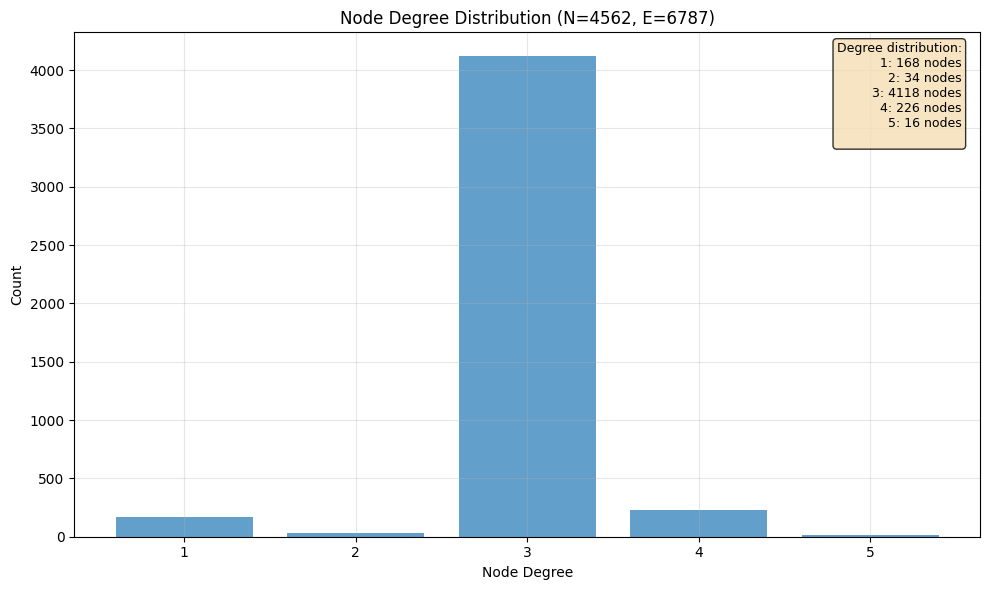

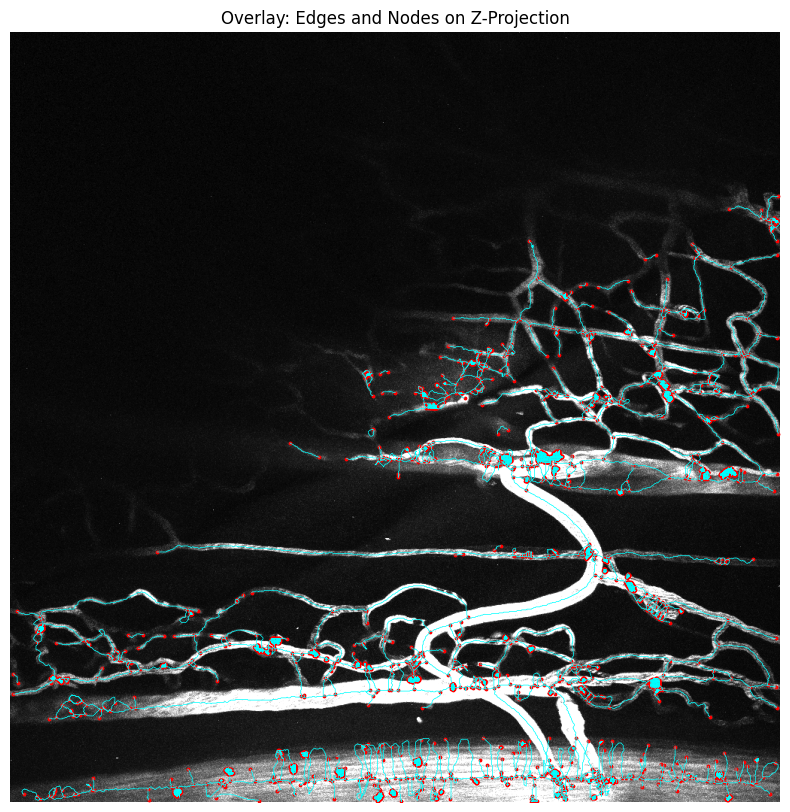

NameError: name 'your_graph' is not defined

In [9]:
G = smart_multigraph_degree2_removal(G, skeleton)
plot_node_degree_distribution(G)
visualize_edges_and_nodes(image, G)
stats = compute_comprehensive_vessel_statistics(
    G, 
    node_positions=your_positions_dict,
    voxel_size=(1, 1, 1),  # in microns
    image_dimensions=(x_size, y_size, z_size)  # in voxels
)

=== Debugging Information ===
Total edges: 1867
Edges with branch_order: 1770
Edges with voxel paths: 1867
Edges with both (visualizable): 1770
All branch orders found: ['BO1', 'BO2', 'BO3', 'BO4', 'BO5', 'BO6', 'BO7', 'BO8', 'BO9', 'BO10', 'BO11', 'BO12', 'BO13', 'BO14', 'BO15', 'BO16', 'BO17', 'BO18', 'BO19', 'BO20', 'BO21', 'BO22', 'BO23', 'BO24', 'BO25', 'BO26']
Visualizable branch orders: ['BO1', 'BO2', 'BO3', 'BO4', 'BO5', 'BO6', 'BO7', 'BO8', 'BO9', 'BO10', 'BO11', 'BO12', 'BO13', 'BO14', 'BO15', 'BO16', 'BO17', 'BO18', 'BO19', 'BO20', 'BO21', 'BO22', 'BO23', 'BO24', 'BO25', 'BO26']
Grouping branch orders above BO8 -> 26 orders reduced to 9 colors


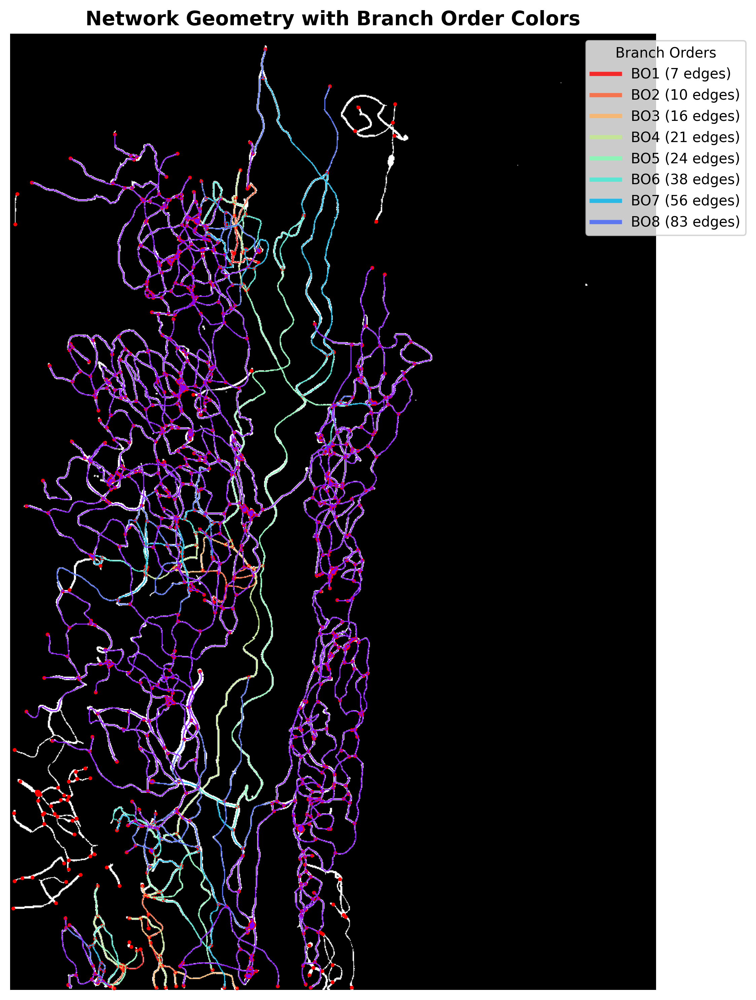

=== Enhanced Poiseuille Weight Calculation (With Constrictions) ===
Formula: Weight = 1 / (∫ resistance dx)
Resistance per unit length = (128 * μ) / (π * d^4)
Viscosity calculation: μ = 1 / diameter^1.647
Constriction pattern: d1 → d2 → d1 over 40μm, spaced 100μm apart
Units: diameter and length in micrometers (μm)

BO1: d1=6.2μm (μ=0.049537), d2=6.2μm (μ=0.049537)
BO2: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
BO3: d1=5.0μm (μ=0.070599), d2=4.0μm (μ=0.101955)
BO4: d1=5.0μm (μ=0.070599), d2=4.0μm (μ=0.101955)
BO5: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
BO6: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
BO7: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
BO8: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
BO9: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
B10: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
B11: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
B12: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
B13: d1=4.0μm (μ=0.101955), d2=3.2μm (μ=0.147237)
B14: d1=4.0μm (μ=0.101955), d2=3

Edge (103, 104) not found in graph



=== Summary ===
Weights successfully set: 356
Edges missing branch_order: 97
Edges with unknown branch_order: 1414
=== Poiseuille Weight Calculation ===
Formula: Conductance
Edge Diameter: 6 μm
Calculated Viscosity: 0.052286 (from 1/diameter^1.647)
Weight = (π * d^4) / (128 * μ * L)

=== Debugging Information ===
Using inverse weights (1/weight): True
Total edges: 1867
Edges with weights: 1867
Edges with voxel paths: 1867
Edges with both (visualizable): 1867
Data 1/weight range: [0.003800, 5.014037]
Color mapping range: [0.100000, 5.500000]
Plotted 1867 edges with weights and paths


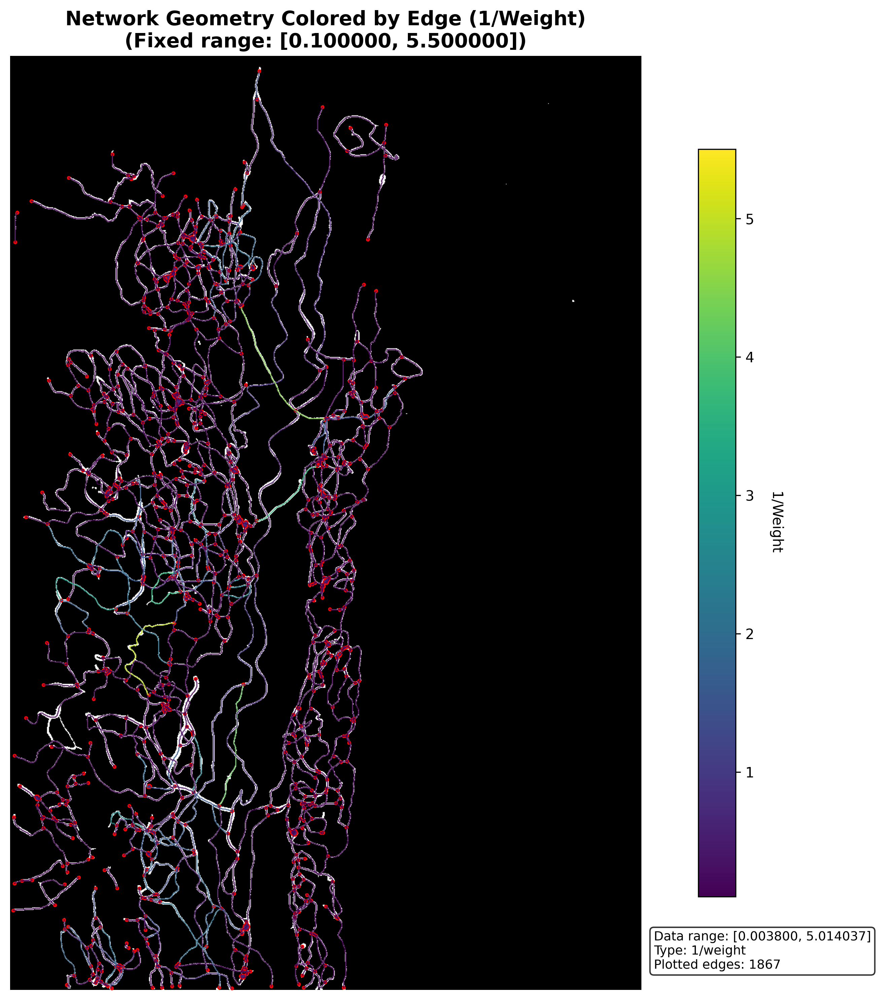

In [111]:
#Everything needs repeating for pub as a few endo vessels were missing (now added) - images correct, resistances slightly off
starting_nodes = [426, 184, 509, 494, 483]   #Arterioles
custom_edges = [
        (103, 262),
        (103, 104),
        (309, 363),
        (363, 746),
        (363, 745),
        (746, 874),
        (745, 766),
        (874, 1140),
        (221, 309),
        (103, 106),
        (34, 222),
        (222, 258),
        (233, 236),
        (123, 176),
        (234, 235),
        (35, 65),
        (32, 35),
        (260,290),
        (290,846),
        (290,846),
        (766, 846),
        (766, 845)
    ]  # Endoneurial vessels
assign_branch_orders(G, starting_nodes)
visualize_geometry_with_branch_orders(image, G, color_palette='rainbow', group_above=8)
set_poiseuille_weights_with_constrictions(G, diameter_by_branch_order_enhanced)
#set_poiseuille_weights(G, diameter_by_branch_order)
#For endnoneurial vessels
set_poiseuille_edge_weights(G, custom_edges, 6, use_resistance=False)
fig, ax, weight_range, cmap = visualize_geometry_with_edge_weights(image, G, min_weight=0.1, max_weight=5.5, use_inverse=True)


In [39]:
def calc_laplacian_from_conductance_matrix(C):
    if not np.allclose(C, C.T):
        raise ValueError("Conductance matrix must be symmetric")
    if not np.all(np.diagonal(C) == 0):
        raise ValueError("Conductance matrix diagonal must be zero")
    diag = np.sum(C, axis=1)
    L = np.diag(diag) - C
    return L

def calc_two_point_from_laplacian_matrix(L, node_idx1, node_idx2):
    """ This function calculates the two point resistance between two nodes in a network given the Laplacian matrix.

    Args:
        L (np.array): Laplacian matrix of the network (hermitian)
        node_idx1 (int): idx of node 1 
        node_idx2 (int): idx of node 2
                         Note idxs start at zero, so the idxs are 1 lower than in the Wu paper
    """
    
    # calculate the eigenvalues and orthonormal eigenvectors of the Laplacian matrix
    eigvals, eigvecs = np.linalg.eigh(L)

    # calculate the effective resistance between the two nodes
    R = 0
    for II in range(1, len(eigvals)):
        if eigvals[II] > 1e-10:
            R += (1/eigvals[II]) * (eigvecs[node_idx1, II] - eigvecs[node_idx2, II])**2

    return R

def calc_two_point_from_laplacian_matrix_nodeID(L, G, node_id1, node_id2):
    """ This function calculates the two point resistance between two nodes in a network given the Laplacian matrix.
    Args:
        L (np.array): Laplacian matrix of the network (hermitian)
        G (networkx.MultiGraph): The multigraph containing the nodes
        node_id1: ID of node 1 (as it appears in the multigraph)
        node_id2: ID of node 2 (as it appears in the multigraph)
    """
    
    # Get the node list from the multigraph to create the mapping
    node_list = list(G.nodes())
    
    # Create mapping from node ID to matrix index
    node_to_idx = {node_id: idx for idx, node_id in enumerate(node_list)}
    
    # Convert node IDs to matrix indices
    try:
        node_idx1 = node_to_idx[node_id1]
        node_idx2 = node_to_idx[node_id2]
    except KeyError as e:
        raise ValueError(f"Node {e} not found in the multigraph")
    
    # calculate the eigenvalues and orthonormal eigenvectors of the Laplacian matrix
    eigvals, eigvecs = np.linalg.eigh(L)
    
    # calculate the effective resistance between the two nodes
    R = 0
    for II in range(1, len(eigvals)):
        if eigvals[II] > 1e-10:
            R += (1/eigvals[II]) * (eigvecs[node_idx1, II] - eigvecs[node_idx2, II])**2
    
    return R

  
    

In [75]:
 interactive_3d_graph(G)

In [112]:
#Terminal nodes
#Arterioles
#426 arteriole 1
#184 Arteriole 2
#509, 494, 483  Arteriole 3

#[595, 527, 612] Connects directly to artery

#Venules
#[587, 425, 455, 778, 1330, 1355, 1329, 400, 1301, 1493, 1496, 1466, 831, 875, 1416, 1154, 742, 184, 574, 575, 1022,497, 1106, 428, 901, 869, 731, 732, 646, 448, 620,  689,887,593, 2, 585, 483, 494, 509, 822, 1069,43, 20, 22, 19, 24, 218, 173, 291, 310, 166, 201, 498]   
            
#Perineurial input nodes (journey to perineurium) # needs improving
#[865?,1140?, 874?, 1329, 1118?, 801, 497, 443, 495, 720, 439, 716?, 381,  461, 463, 553, 772, 950] # on main side
#[ ,  ]                              # artery side


#Nodes across perineurium (journey accross perineurium)
#[1330, 1140, 874, 1252, 955, 953, 937, 880, 1014, 1281, 1118, 865, 813, 750, 805, 749, 716, 656, 600, 552, 553, 592, 528, 481, 417, 453, 461, 447, 484, 544]

#endoneurial nodes
#[766, 845, 846, 290, 498, 745, 363, 500, 309, 33, 258, 233, 222, 235, 32, 34, 234, 35, 381, 236, 314, 2, 403, 64, 86]



LX = nx.laplacian_matrix(G, weight = "weight").toarray()
    ###Finbars method of exporting, by first exporting from Networkx to an array
    #C = nx.to_numpy_array(G, weight='weight')
    #L = calc_laplacian_from_conductance_matrix(C)
    

In [114]:
print("20%")
node_ID1 = 426
list_nodeID2 = [766, 845, 846, 290, 498, 745, 363, 500, 309, 33, 258, 233, 222, 235, 32, 34, 234, 35, 381, 236, 314, 2, 403, 64, 86]
print(f"Starting loop with {len(list_nodeID2)} items")
for i, n in enumerate(list_nodeID2):
    print(f"Processing item {i+1}/{len(list_nodeID2)}: n = {n}")
    try:
        result = calc_two_point_from_laplacian_matrix_nodeID(LX, G, node_ID1, n)
        print(f"  Success for n = {n}, result = {result}")
    except Exception as e:
        print(f"  Error for n = {n}: {e}")
        # Optionally continue with the next iteration instead of stopping
        continue
print("Loop completed")
node_ID1 = 184
for i, n in enumerate(list_nodeID2):
    print(f"Processing item {i+1}/{len(list_nodeID2)}: n = {n}")
    try:
        result = calc_two_point_from_laplacian_matrix_nodeID(LX, G, node_ID1, n)
        print(f"  Success for n = {n}, result = {result}")
    except Exception as e:
        print(f"  Error for n = {n}: {e}")
        # Optionally continue with the next iteration instead of stopping
        continue
print("Loop completed")
node_ID1 = 509
for i, n in enumerate(list_nodeID2):
    print(f"Processing item {i+1}/{len(list_nodeID2)}: n = {n}")
    try:
        result = calc_two_point_from_laplacian_matrix_nodeID(LX, G, node_ID1, n)
        print(f"  Success for n = {n}, result = {result}")
    except Exception as e:
        print(f"  Error for n = {n}: {e}")
        # Optionally continue with the next iteration instead of stopping
        continue
print("Loop completed")
node_ID1 = 494
for i, n in enumerate(list_nodeID2):
    print(f"Processing item {i+1}/{len(list_nodeID2)}: n = {n}")
    try:
        result = calc_two_point_from_laplacian_matrix_nodeID(LX, G, node_ID1, n)
        print(f"  Success for n = {n}, result = {result}")
    except Exception as e:
        print(f"  Error for n = {n}: {e}")
        # Optionally continue with the next iteration instead of stopping
        continue
print("Loop completed")
node_ID1 = 483
for i, n in enumerate(list_nodeID2):
    print(f"Processing item {i+1}/{len(list_nodeID2)}: n = {n}")
    try:
        result = calc_two_point_from_laplacian_matrix_nodeID(LX, G, node_ID1, n)
        print(f"  Success for n = {n}, result = {result}")
    except Exception as e:
        print(f"  Error for n = {n}: {e}")
        # Optionally continue with the next iteration instead of stopping
        continue
print("Loop completed")



20%
Starting loop with 25 items
Processing item 1/25: n = 766
  Success for n = 766, result = 2.1540352598113124
Processing item 2/25: n = 845
  Success for n = 845, result = 2.362793538384475
Processing item 3/25: n = 846
  Success for n = 846, result = 2.1472357973946385
Processing item 4/25: n = 290
  Success for n = 290, result = 2.135733306118722
Processing item 5/25: n = 498
  Success for n = 498, result = 1.952085233591387
Processing item 6/25: n = 745
  Success for n = 745, result = 2.061394243815824
Processing item 7/25: n = 363
  Success for n = 363, result = 2.0204136006994373
Processing item 8/25: n = 500
  Success for n = 500, result = 1.9425891811444091
Processing item 9/25: n = 309
  Success for n = 309, result = 1.720068103638951
Processing item 10/25: n = 33
  Success for n = 33, result = 7.809267238339042
Processing item 11/25: n = 258
  Success for n = 258, result = 1.8638273640073537
Processing item 12/25: n = 233
  Success for n = 233, result = 1.8708216921097542
P

  Success for n = 845, result = 2.8865496450176162
Processing item 3/25: n = 846
  Success for n = 846, result = 2.67358111924923
Processing item 4/25: n = 290
  Success for n = 290, result = 2.663782177953234
Processing item 5/25: n = 498
  Success for n = 498, result = 2.4518810093762924
Processing item 6/25: n = 745
  Success for n = 745, result = 2.5752609867559006
Processing item 7/25: n = 363
  Success for n = 363, result = 2.5323072177237465
Processing item 8/25: n = 500
  Success for n = 500, result = 2.4428079381489707
Processing item 9/25: n = 309
  Success for n = 309, result = 2.2225038928403653
Processing item 10/25: n = 33
  Success for n = 33, result = 8.20991103400177
Processing item 11/25: n = 258
  Success for n = 258, result = 2.271965565804693
Processing item 12/25: n = 233
  Success for n = 233, result = 2.2790629680437373
Processing item 13/25: n = 222
  Success for n = 222, result = 2.233843718789509
Processing item 14/25: n = 235
  Success for n = 235, result = 

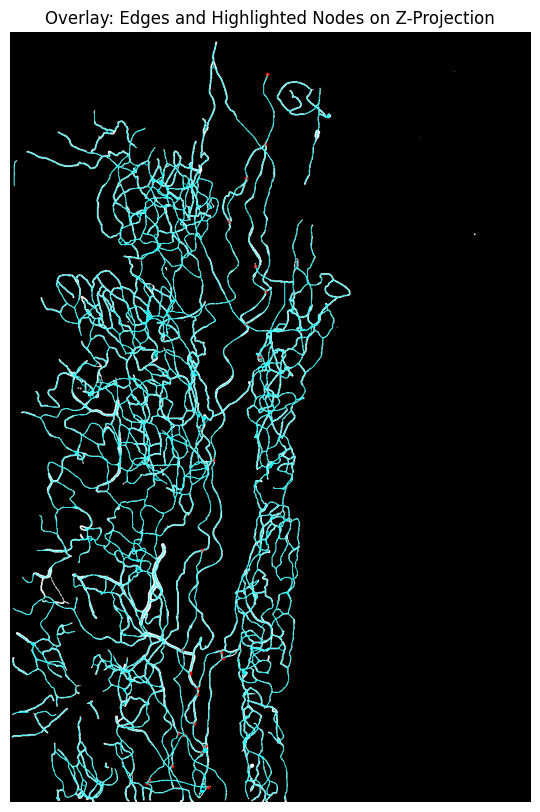

In [16]:
visualize_edges_and_nodes_highlight(image, G, highlight_nodes=[766, 845, 846, 290, 498, 745, 363, 500, 309, 33, 258, 233, 222, 235, 32, 34, 234, 35, 381, 236, 314, 2, 403, 64, 86])

In [ ]:
def estimate_diameter_fwhm(intensity_image, start, end, spacing, voxel_size):
    """
    Estimates diameter using Full Width at Half Maximum along a line perpendicular to vessel.
    """
    start = np.array(start)
    end = np.array(end)
    vec = end - start
    vec_length = np.linalg.norm(vec)
    if vec_length == 0:
        return np.nan
    vec = vec / vec_length  # unit vector

    # perpendicular direction
    perp = np.cross(vec, [1, 0, 0])
    if np.allclose(perp, 0):
        perp = np.cross(vec, [0, 1, 0])
    perp = perp / np.linalg.norm(perp)

    # line coordinates
    steps = np.linspace(-spacing, spacing, int(2 * spacing / np.min(voxel_size)))
    diam_values = []
    for d in steps:
        coord = (start + end) / 2 + d * perp
        coord /= voxel_size
        val = map_coordinates(intensity_image, coord[::-1], order=1, mode='constant', cval=0.0)
        diam_values.append(val[0])

    diam_values = np.array(diam_values)
    max_val = diam_values.max()
    if max_val == 0:
        return np.nan
    half_max = max_val / 2.0
    above_half = np.where(diam_values >= half_max)[0]
    if len(above_half) < 2:
        return np.nan
    fwhm = (steps[above_half[-1]] - steps[above_half[0]])
    return np.abs(fwhm)

def compute_average_branch_diameter(G, image, voxel_size, interval=5, output_csv="branch_diameter.csv"):
    """
    Measures diameter at intervals along each edge and computes mean per branch.
    """
    data = []
    for u, v, d in G.edges(data=True):
        if 'path' not in d:
            continue
        path = np.array(d['path']) * voxel_size  # to microns
        length = d.get("length", 0)
        if length < interval:
            continue

        samples = []
        current_length = 0
        for i in range(1, len(path)):
            seg_len = np.linalg.norm(path[i] - path[i-1])
            current_length += seg_len
            if current_length >= interval:
                est = estimate_diameter_fwhm(image, path[i-1], path[i], spacing=10, voxel_size=voxel_size)
                if est is not None and not np.isnan(est):
                    samples.append(est)
                current_length = 0  # reset counter

        avg_diam = np.nanmean(samples) if samples else np.nan
        data.append({
            "Branch ID": f"{u}-{v}",
            "Branch Length (µm)": length,
            "Average Diameter (µm)": avg_diam
        })

    df = pd.DataFrame(data)
    df.to_csv(output_csv, index=False)
    logger.debug(f"Saved average diameter metrics to {output_csv}")
    